# Part F: Generate figures and make analysis

## Introduction
This notebook contains _all code_ that has been used to create the figures and perform the analysis for the paper "Can more detailed geological maps improve streamflow prediction in ungauged basins?" paper by do Nascimento et al. (in review). To be able to run this notebook, please ensure that you have downloaded the acompanying data of the paper, and to have run all the codes before. All links can be found in the data section of the paper.

Author: Thiago Nascimento (thiago.nascimento@eawag.ch)

## Requirements

**Files**

- estreams_gauging_stations.csv https://doi.org/10.5281/zenodo.14778580 (Last access: 11 February 2025)
- estreams_geology_moselle_regional_attributes.csv https://doi.org/10.5281/zenodo.14778580 (Last access: 15 February 2025)
- estreams_attributes_filtered_quality_geology_v01.csv https://github.com/thiagovmdon/LSH-quality_geology (Last access: 11 February 2025)



## Import modules

In [5]:
import pandas as pd
import datetime as datetime
import matplotlib.pyplot as plt
import numpy as np
#import spotpy
import time
import os
import tqdm as tqdm
#import hydroanalysis
from utils.functions import find_max_unique_rows
from utils.functions import find_iterative_immediate_downstream
#warnings.filterwarnings("ignore")
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import rasterio
import xarray as xr
from pathlib import Path
import xarray as xr
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


## Configurations

In [6]:
# Path to where the EStreams dataset is stored
# Windows
path_estreams = r'C:\Users\nascimth\Documents\data\EStreams'

## Mac
#path_estreams = r'/Users/thiagomedeirosdonascimento/Downloads/Python 2/Scripts/estreams_part_b/data/EStreams'

path_data = r"C:/Users/nascimth/Documents/data"

## Import data

### Shapefiles

In [7]:
moselle=gpd.read_file(r"..\data\shps\moselle_delienation.shp")
rivers_moselle=gpd.read_file(r"..\data\shps\rivers_moselle.shp")
catchment_boundaries = gpd.read_file(path_data+'//EStreams/shapefiles/estreams_catchments.shp')
catchment_boundaries.set_index("basin_id", inplace=True)
catchment_boundaries

,gauge_id,country,area_offic,area_estre,area_flag,area_rel,start_date,end_date,gauge_flag,upstream,group,geometry
basin_id,,,,,,,,,,,,
AT000001,200014,AT,4647.9,4668.379,0,-0.440608,1996-01-01,2021-12-31,B,16,1,"POLYGON Z ((9.69406 46.54322 0, 9.6957 46.5364..."
AT000002,200048,AT,102.0,102.287,0,-0.281373,1958-10-01,2021-12-31,B,1,1,"POLYGON Z ((10.1365 47.02949 0, 10.13495 47.02..."
AT000003,231662,AT,535.2,536.299,0,-0.205344,1985-01-02,2021-12-31,B,2,1,"POLYGON Z ((10.11095 46.89437 0, 10.11226 46.8..."
AT000004,200592,AT,66.6,66.286,0,0.471471,1998-01-02,2021-12-31,B,1,1,"POLYGON Z ((10.14189 47.09706 0, 10.14042 47.0..."
AT000005,200097,AT,72.2,72.448,0,-0.343490,1990-01-01,2019-12-31,B,3,1,"POLYGON Z ((9.67851 47.06249 0, 9.67888 47.063..."
...,...,...,...,...,...,...,...,...,...,...,...,...
UAGR0017,6682300,UA,321.0,325.370,0,-1.361371,1978-01-01,1987-12-31,B,1,1988,"POLYGON Z ((33.96791 44.63291 0, 33.96791 44.6..."
UAGR0018,6682500,UA,49.7,47.594,0,4.237425,1978-01-01,1987-12-31,B,1,1989,"POLYGON Z ((34.19958 44.58291 0, 34.20291 44.5..."
UAGR0019,6683010,UA,261.0,244.731,1,6.233333,1978-01-01,1987-12-31,B,1,1990,"POLYGON Z ((34.19624 44.88375 0, 34.19624 44.8..."


### Geological maps (clipped to the Moselle basin)


In [8]:
##################################################################################################################
# Global geology clipped to the Moselle catchment
GLiM_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/glim_moselle_wgs.shp")

attribute_field = 'xx'
GLiM_moselle_dissolved = GLiM_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
GLiM_moselle_dissolved["class"] = GLiM_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_glim = {
    "very low": ['ev', 'ig', 'pa', 'pb', 'va', 'vb', "wb"],
    "low": ['mt', 'pi', 'py', 'vi'],
    "medium": ['sc', 'sm'],
    "high": ['su', 'ss']
}

# Create a new column for reclassified permeability
def reclassify_glim_class(class_name):
    for permeability, classes in permeability_columns_glim.items():
        if class_name in classes:
            return permeability
    return None

GLiM_moselle_dissolved['permeability'] = GLiM_moselle_dissolved['class'].apply(reclassify_glim_class)

##################################################################################################################
# Continental geology clipped to the Moselle catchment
geology_median_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/geology_median_moselle_wgs.shp")

attribute_field = 'LEVEL3'
geology_median_moselle_dissolved = geology_median_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_median_moselle_dissolved["class"] = geology_median_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Conglomerates", "Conglomerates and sands", "Gravels", 
             "Sands", "Sandstones", "Sandstones and sands"],
    "medium": ["Conglomerates and clays", "Gneisses", "Limestones", 
               "Limestones and sands", "Sandstones and clays", "Sandstones and marls",
               "Limestones and clays", "Limestones and marls", "Marlstones and sands"],
    "low": ["Claystones and clays", "Marbles",
              "Marls", "Marlstones", "Marlstones and clays", 
              "Marlstones and marls", "Phyllites", "Schists",
              "Silts"],
    "very low": ["Plutonic rocks", "Volcanic rocks", 
                    "Inland water", "Snow field / ice field",
                    "Clays",  'Quartzites', "Shales"]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_median_moselle_dissolved['permeability'] = geology_median_moselle_dissolved['class'].apply(reclassify_geology_class)

##################################################################################################################
# Regional geology clipped to the Moselle catchment
geology_high_moselle = gpd.read_file(path_data+'/gis/lithology/moselle_hr_ff.shp')

attribute_field = 'Labels01'
geology_high_moselle_dissolved = geology_high_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_high_moselle_dissolved["class"] = geology_high_moselle_dissolved.index

# Set the CRS to WGS84
geology_high_moselle_dissolved = geology_high_moselle_dissolved.to_crs(epsg=4326)


# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Alluvium", 'Coal', 'Conglomerate', 'Gravel and sand',
             'Sand', 'Sand and gravel', 'Sandstone and conglomerate', 'Sandstone'
        ],
    
    "medium": ['Limestone', 'Sandstone and marl', 'Sandstone and schist',
              'Sandstone, conglomerate and marl'],
    
    "low": ['Arkose', 'Dolomite rock', 'Limestone and marl', 'Marl', 
             'Marl and dolomite', 'Marl and limestone', 'Marl and sandstone',
             'Sandstone and siltstone', 'Sandstone, siltstone and schist', 
              'Schist and sandstone', 'Silt',  'Silt and schist', 'Siltstone, sandstone and schist'
              ,"Siltstone"
             ],
    
    "very low": ['Cristallin basement', 'Plutonic rock',  'Quarzite',
                    'Schist','Volcanic rock' 
                   ]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_high_moselle_dissolved['permeability'] = geology_high_moselle_dissolved['class'].apply(reclassify_geology_class)

### Topography

Current CRS: EPSG:4326
Image is already in WGS84 CRS.


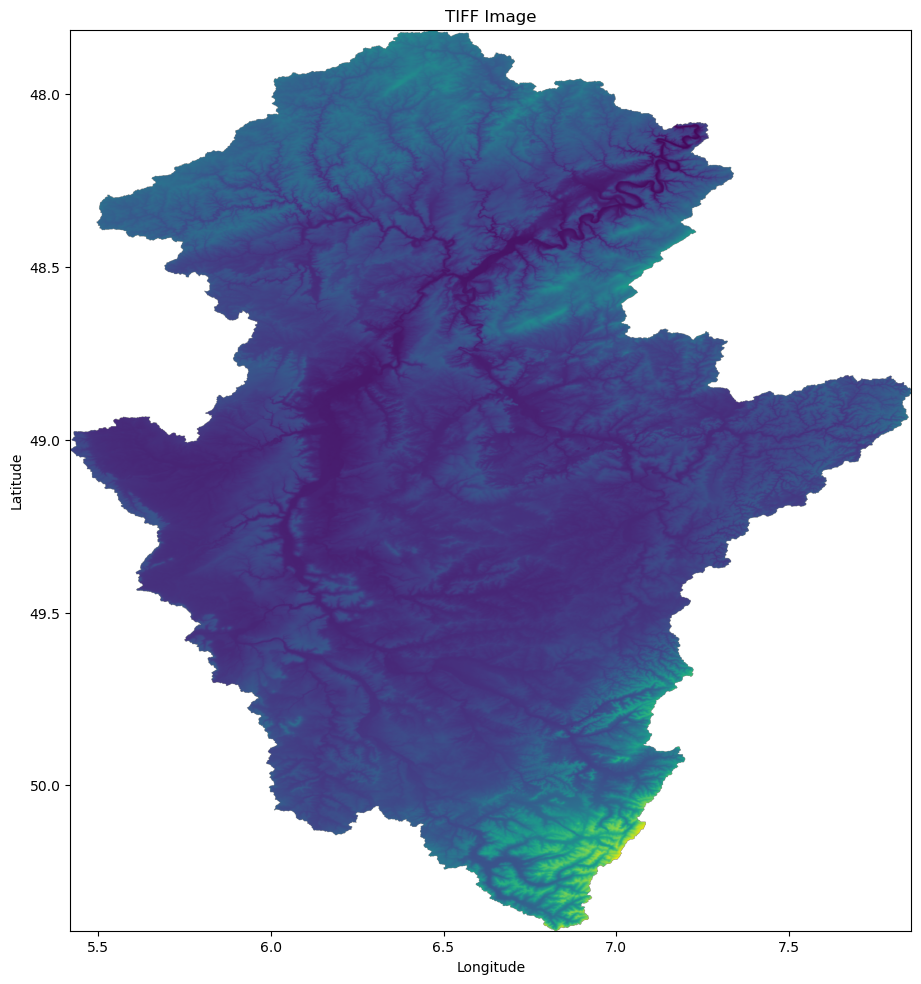

In [9]:
##################################################################################################################
# Terrain (elevation)
# Path to the TIFF file
tiff_path = path_data+"/gis/paper_moselle/raster/elevation/moselle_srtm.tif"

# Open the TIFF file
with rasterio.open(tiff_path) as src:
    # Check the current CRS
    current_crs = src.crs
    print(f'Current CRS: {current_crs}')

    # Define the target CRS (WGS84)
    dst_crs = 'EPSG:4326'  # WGS84

    # If the current CRS is not WGS84, reproject the image
    if current_crs != dst_crs:
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        # Create an in-memory array to hold the reprojected data
        reprojected_image = rasterio.io.MemoryFile().open(**kwargs)

        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(reprojected_image, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

        # Read the reprojected image
        elevation_wgs = reprojected_image.read(1)

        print(f'Image reprojected to WGS84 and stored in-memory.')
    else:
        # Read the original image if it is already in WGS84
        elevation_wgs = src.read(1)
        transform = src.transform
        print('Image is already in WGS84 CRS.')

# Calculate the extent
left, bottom, right, top = transform * (0, 0), transform * (elevation_wgs.shape[1], 0), transform * (elevation_wgs.shape[1], elevation_wgs.shape[0]), transform * (0, elevation_wgs.shape[0])
extent = (left[0], right[0], bottom[1], top[1])

# Plot the image with the correct extent
fig, ax = plt.subplots(1, 1, figsize=(16.6, 11.7))
ax.imshow(elevation_wgs, cmap='viridis', extent=extent)
ax.set_title('TIFF Image')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

### Network and attributes

In [10]:
# Read the gauges network metadata (from EStreams):
network_estreams = pd.read_csv(path_estreams+'/streamflow_gauges/estreams_gauging_stations.csv', encoding='utf-8')
network_estreams.set_index("basin_id", inplace = True)

# Attributes already filtered from EStreams previously in do Nascimento et al. (2025a):
estreams_attributes = pd.read_csv('../data/estreams_attributes_filtered_quality_geology_v01.csv', encoding='utf-8')
estreams_attributes.set_index("basin_id", inplace = True)

# Geological attributes (regional scale). Same ones provided in do Nascimento et al. (2025a):
geology_regional_31_classes_moselle = pd.read_csv("../data/estreams_geology_moselle_regional_attributes.csv", encoding='utf-8')
geology_regional_31_classes_moselle.set_index("basin_id", inplace = True)


# Read the dataset network
estreams_attributes_clipped_filters = pd.read_csv(R'..\data\network_estreams_moselle_108_gauges.csv', encoding='utf-8')
estreams_attributes_clipped_filters.set_index("basin_id", inplace = True)

## Preprocessing
### Network organization

In [11]:
# Convert 'date_column' and 'time_column' to datetime
network_estreams['start_date'] = pd.to_datetime(network_estreams['start_date'])
network_estreams['end_date'] = pd.to_datetime(network_estreams['end_date'])

# Convert to list both the nested_catchments and the duplicated_suspect columns
network_estreams['nested_catchments'] = network_estreams['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
network_estreams['duplicated_suspect'] = network_estreams['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

# Set the nested catchments as a dataframe
nested_catchments = pd.DataFrame(network_estreams['nested_catchments'])

# Now we add the outlet to the list (IF it was not before):
# Ensure that the basin_id is in the nested_catchments
for basin_id in nested_catchments.index:
    if basin_id not in nested_catchments.at[basin_id, 'nested_catchments']:
        nested_catchments.at[basin_id, 'nested_catchments'].append(basin_id)


# Convert to list both the nested_catchments and the duplicated_suspect columns
estreams_attributes['nested_catchments'] = estreams_attributes['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
estreams_attributes['duplicated_suspect'] = estreams_attributes['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

estreams_attributes.sort_index(inplace = True) 

### Geological data organization

In [12]:
# Create a dictionary to map permeability classes to corresponding columns
permeability_columns = {
    "high": ["lit_fra_Alluvium", 'lit_fra_Coal', 'lit_fra_Conglomerate', 'lit_fra_Gravel and sand',
             'lit_fra_Sand', 'lit_fra_Sand and gravel', 'lit_fra_Sandstone and conglomerate', 'lit_fra_Sandstone'
        ],
    
    "medium": ['lit_fra_Limestone', 'lit_fra_Sandstone and marl', 'lit_fra_Sandstone and schist',
              'lit_fra_Sandstone, conglomerate and marl',

              'lit_fra_Arkose', 'lit_fra_Dolomite rock', 'lit_fra_Limestone and marl', 'lit_fra_Marl', 
             'lit_fra_Marl and dolomite', 'lit_fra_Marl and limestone', 'lit_fra_Marl and sandstone',
               'lit_fra_Sandstone and siltstone', 'lit_fra_Sandstone, siltstone and schist', 
              'lit_fra_Schist and sandstone', 'lit_fra_Silt',  'lit_fra_Silt and schist', 'lit_fra_Siltstone, sandstone and schist'
              
             ],
    
    "low": ['lit_fra_Cristallin basement', 'lit_fra_Plutonic rock',  'lit_fra_Quarzite',
                    'lit_fra_Schist','lit_fra_Volcanic rock' 
                   ]
}

# Iterate over the permeability columns and calculate the area for each class
for permeability_class, columns in permeability_columns.items():
    geology_regional_31_classes_moselle[f'area_perm_{permeability_class}'] = geology_regional_31_classes_moselle[columns].sum(axis=1)

# Drop unnecessary columns
geology_regional_31_classes_moselle = geology_regional_31_classes_moselle[["area_perm_high", "area_perm_medium", "area_perm_low"]]

# Rename the columns
geology_regional_31_classes_moselle.columns = ["perm_high_regi", "perm_medium_regi", "perm_low_regi"]

# Display the updated DataFrame
geology_regional_31_classes_moselle

geology_regional_31_classes_moselle["baseflow_index"] = estreams_attributes["baseflow_index"]
geology_regional_31_classes_moselle.corr(method="pearson")

# Concatenation
estreams_attributes[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]] = geology_regional_31_classes_moselle[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]]

# Adjust the three categories for also global dataset
estreams_attributes["perm_high_glob2"] = estreams_attributes["perm_high_glob"]
estreams_attributes["perm_medium_glob2"] = estreams_attributes["perm_medium_glob"] + estreams_attributes["perm_low_glob"]
estreams_attributes["perm_low_glob2"] = estreams_attributes["perm_verylow_glob"]

###########################################################################################################################
# Adjust the columns of the dataset:
for basin_id in estreams_attributes.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes.loc[basin_id, "perm_high_regi"] / 100
    v2 = estreams_attributes.loc[basin_id, "perm_medium_regi"] / 100
    v3 = estreams_attributes.loc[basin_id, "perm_low_regi"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes.loc[basin_id, "perm_high_regi"] = v1 * 100
    estreams_attributes.loc[basin_id, "perm_medium_regi"] = v2 * 100
    estreams_attributes.loc[basin_id, "perm_low_regi"] = v3 * 100


for basin_id in estreams_attributes.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes.loc[basin_id, "perm_high_glob2"] / 100
    v2 = estreams_attributes.loc[basin_id, "perm_medium_glob2"] / 100
    v3 = estreams_attributes.loc[basin_id, "perm_low_glob2"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes.loc[basin_id, "perm_high_glob2"] = v1 * 100
    estreams_attributes.loc[basin_id, "perm_medium_glob2"] = v2 * 100
    estreams_attributes.loc[basin_id, "perm_low_glob2"] = v3 * 100

### Attributes organization

In [13]:
# First we define the outlet of the Moselle to be used
outlets = ["DEBU1959"]
nested_cats_df = nested_catchments.loc[outlets, :]

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 

nested_cats_filtered = find_max_unique_rows(nested_cats_df)                                  # Filter only the catchemnts using the function stated before
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]                     # Here we filter the catchemnts for the list (again, after we apply our function):

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)

# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]

# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Adjust and clip it:
estreams_attributes_clipped = estreams_attributes_dfs["DEBU1959"]

# Convert 'date_column' and 'time_column' to datetime
estreams_attributes_clipped['start_date'] = pd.to_datetime(estreams_attributes_clipped['start_date'])
estreams_attributes_clipped['end_date'] = pd.to_datetime(estreams_attributes_clipped['end_date'])

100%|██████████| 1/1 [00:00<00:00, 1004.86it/s]


## Merging simulations

In [2]:
# Base path to your NetCDF files
base_path = Path(r"..\results\sim\space-time")

# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 6)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo])
    output_path = base_path / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")

## Load the simulations

In [130]:
# Function to load the simulations and merge with the observations
def load_group_with_inputs(group: str, base_path: Path) -> xr.Dataset:
    """
    Load simulation + inputs for a given group into a single merged xarray.Dataset.
    
    Assumes both files contain the same gauge_id and date dimensions.

    Parameters:
    - group (str): Group name like "Group_3"
    - base_path (Path): Directory where both simu_Group_X.nc and inputs_Group_X.nc live

    Returns:
    - xarray.Dataset with all variables merged
    """
    # Load the group simulation file
    ds_sim = xr.load_dataset(base_path / f"simu_{group}.nc")
    
    # Load the group input file
    ds_inputs = xr.load_dataset(base_path / f"inputs.nc")
    
    # Merge datasets (assumes same gauge_id and date alignment)
    ds_merged = xr.merge([ds_sim, ds_inputs])

    return ds_merged


In [131]:
# Example of usage
base_dir = Path(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\sim\space-time")
ds = load_group_with_inputs("Group_3", base_dir)

In [ ]:
import xarray as xr

Group_number = "Group_2"
# Load the dataset
ds = xr.open_dataset(rf"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\sim\space-time\simu_{Group_number}.nc")

In [17]:
import pickle
from pathlib import Path
from neuralhydrology.evaluation.signatures import baseflow_index
from neuralhydrology.evaluation.signatures import calculate_all_signatures

In [18]:
import tqdm as tqdm
import pandas as pd

In [19]:
import xarray as xr
import pandas as pd
import numpy as np
import tqdm
from collections import defaultdict

from neuralhydrology.evaluation.signatures import baseflow_index, hfd_mean, high_q_dur, high_q_freq, low_q_dur, low_q_freq, q5, q95, q_mean, runoff_ratio, slope_fdc, stream_elas, zero_q_freq

sources = ['observation', 'regional', 'continental', 'global']

# Signature functions and whether they require precipitation
signature_funcs = {
    'baseflow_index': lambda q, p: baseflow_index(q, alpha=0.925, warmup=365, n_passes=3)[0],
    'hfd_mean': lambda q, p: hfd_mean(q, datetime_coord="date"),
    'high_q_dur': lambda q, p: high_q_dur(q),
    'high_q_freq': lambda q, p: high_q_freq(q, datetime_coord="date"),
    'low_q_dur': lambda q, p: low_q_dur(q),
    'low_q_freq': lambda q, p: low_q_freq(q, datetime_coord="date"),
    'q5': lambda q, p: q5(q),
    'q95': lambda q, p: q95(q),
    'q_mean': lambda q, p: q_mean(q),
    'runoff_ratio': lambda q, p: runoff_ratio(q, p),
    'slope_fdc': lambda q, p: slope_fdc(q),
    'stream_elas': lambda q, p: stream_elas(q, p, datetime_coord="date"),
    'zero_q_freq': lambda q, p: zero_q_freq(q)
}

# Initialize signature result containers
signature_results = {name: [] for name in signature_funcs}

# Loop over gauges and compute all signatures for all sources
for gauge in tqdm.tqdm(ds.gauge_id.values):
    prcp = ds.sel(gauge_id=gauge)['precipitation']
    
    for sig_name, sig_func in signature_funcs.items():
        row = {'gauge_id': gauge}
        for source in sources:
            discharge = ds.sel(gauge_id=gauge)[source]
            try:
                row[source] = sig_func(discharge, prcp)
            except Exception as e:
                print(f"{sig_name} failed for {gauge} [{source}]: {e}")
                row[source] = np.nan
        signature_results[sig_name].append(row)

# Convert to DataFrames
signature_dfs = {sig: pd.DataFrame(rows) for sig, rows in signature_results.items()}

100%|██████████| 108/108 [01:32<00:00,  1.16it/s]


In [20]:
signature_dfs["baseflow_index"]

,gauge_id,observation,regional,continental,global
0,BEWA0066,0.518846,0.531626,0.543151,0.738881
1,BEWA0067,0.451975,0.521073,0.534401,0.689737
2,BEWA0106,0.501923,0.528043,0.547417,0.804325
3,BEWA0107,0.582678,0.535484,0.544852,0.800851
4,BEWA0119,0.510325,0.532457,0.543658,0.735409
...,...,...,...,...,...
103,LU000015,0.522385,0.527638,0.541551,0.799223
104,LU000016,0.568219,0.517495,0.580728,0.492603
105,LU000017,0.576211,0.562334,0.590687,0.651941
106,LU000018,0.552706,0.614357,0.769090,0.491382


In [99]:
signature_dfs["baseflow_index"].iloc[:, 1:].corr()

,observation,regional,continental,global
observation,1.000000,0.667161,0.476258,0.355299
regional,0.667161,1.000000,0.819756,0.470018
continental,0.476258,0.819756,1.000000,0.128920
global,0.355299,0.470018,0.128920,1.000000


In [40]:
# Read the dataset network
estreams_attributes_clipped_filters = pd.read_csv(R'..\data\network_estreams_moselle_108_gauges.csv', encoding='utf-8')
estreams_attributes_clipped_filters.set_index("basin_id", inplace = True)
estreams_attributes_clipped_filters

,Unnamed: 0,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,...,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_high_glob2,perm_medium_glob2,perm_low_glob2,group
basin_id,,,,,,,,,,,,,,,,,,,,,
LU000018,0,5,Schoenfels,LU,LU_CONTACTFORM,Mamer,6.100795,49.723112,6.100795,49.723112,...,0.015,0.015,17.0,39.0,61.0,0.0,0.0,100.0,0.0,Group_1
LU000010,1,6,Hunnebuer,LU,LU_CONTACTFORM,Eisch,6.079524,49.729184,6.079524,49.729184,...,0.026,0.026,16.0,42.0,58.0,0.0,1.0,99.0,0.0,Group_1
LU000001,2,17,Bigonville,LU,LU_CONTACTFORM,Sure,5.801399,49.869821,5.801399,49.869821,...,0.000,0.000,9.0,1.0,0.0,99.0,100.0,0.0,0.0,Group_1
DERP2028,3,2674030900,Eisenschmitt,DE,DE_RP,Salm,6.718000,50.048000,6.718000,50.048000,...,0.000,0.000,10.0,80.0,7.0,13.0,79.0,20.0,1.0,Group_1
FR000183,4,A900105050,A9001050,FR,FR_EAUFRANCE,La Sarre à Laneuveville-lès-Lorquin,7.008689,48.654579,7.008689,48.654579,...,0.000,0.000,4.0,66.0,29.0,5.0,64.0,30.0,6.0,Group_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FR003271,107,A782101001,La Seille Ã Nomeny,FR,FR_EAUFRANCE,La Seille à Nomeny,6.227788,48.888271,6.227788,48.888271,...,0.429,0.436,5.0,8.0,92.0,0.0,0.0,100.0,0.0,Group_7
FR003301,108,A930108040,La Sarre Ã Wittring,FR,FR_EAUFRANCE,La Sarre à Wittring,7.150066,49.053225,7.150066,49.053225,...,0.436,2.205,16.0,17.0,83.0,0.0,15.0,85.0,0.0,Group_7
DERP2003,109,2620050500,Bollendorf,DE,DE_RP,Sauer,6.359000,49.851000,6.359000,49.851000,...,1.627,4.160,65.0,17.0,30.0,53.0,50.0,50.0,0.0,Group_7


In [53]:
list_cal = estreams_attributes_clipped_filters[estreams_attributes_clipped_filters.group == Group_number].index.tolist()

# Remove strings starting with 'LU'
list_cal = [g for g in list_cal if not g.startswith("LU")]

df_filtered = df.loc[~df.index.isin(list_cal)]

In [55]:
df_filtered

,high_q_freq_observation,high_q_dur_observation,low_q_freq_observation,low_q_dur_observation,zero_q_freq_observation,q95_observation,q5_observation,q_mean_observation,hfd_mean_observation,baseflow_index_observation,...,low_q_dur_global,zero_q_freq_global,q95_global,q5_global,q_mean_global,hfd_mean_global,baseflow_index_global,slope_fdc_global,stream_elas_global,runoff_ratio_global
gauge_id,,,,,,,,,,,,,,,,,,,,,
BEWA0066,5.961538,2.981132,53.692308,12.429752,0.0,4.675689,0.099492,1.358803,130.176471,0.389181,...,33.666667,0.000406,3.174039,0.414797,1.284423,146.192308,0.648253,1.525452,1.944527,0.455542
BEWA0106,14.884615,4.623529,101.846154,13.924623,0.0,4.380872,0.048698,1.157128,137.083333,0.343103,...,56.500000,0.000406,2.218730,0.350967,0.990665,153.653846,0.706824,1.546397,2.045315,0.393547
BEWA0107,5.730769,2.980392,60.961538,10.121212,0.0,4.167928,0.105341,1.269441,139.708333,0.406032,...,56.500000,0.000406,2.943302,0.500728,1.350499,152.884615,0.713171,1.312356,1.674782,0.459553
BEWA0119,9.769231,3.265823,68.038462,9.548223,0.0,4.672516,0.105519,1.299843,127.521739,0.366035,...,19.800000,0.000406,3.177620,0.407178,1.273348,145.769231,0.644001,1.544489,1.942674,0.456261
DEBU1956,5.115385,3.317073,31.500000,4.321951,0.0,3.448487,0.180313,1.052807,132.115385,0.474338,...,23.911765,0.000203,3.489016,0.190804,1.081725,129.807692,0.475547,2.404309,2.045159,0.439954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,8.653846,5.086957,59.538462,12.976000,0.0,4.167929,0.108717,1.074052,123.230769,0.363970,...,56.500000,0.000406,2.313608,0.362257,1.028782,151.615385,0.699281,1.451054,1.546171,0.405620
LU000016,4.192308,1.790323,0.000000,NaN,0.0,2.728381,0.236251,0.819142,134.692308,0.489045,...,34.179104,0.000406,3.153355,0.102070,0.821329,126.230769,0.371356,2.897078,2.169681,0.366669
LU000017,3.576923,2.526316,7.269231,7.060606,0.0,3.165241,0.192473,0.953157,129.153846,0.461423,...,19.000000,0.000406,2.894495,0.240542,0.976482,136.346154,0.544243,1.851160,2.034390,0.404121


In [54]:
sig = "baseflow_index"

df_filtered[[f"{sig}_observation", f"{sig}_global", f"{sig}_continental", f"{sig}_regional"]].corr()

,baseflow_index_observation,baseflow_index_global,baseflow_index_continental,baseflow_index_regional
baseflow_index_observation,1.000000,0.201044,0.576185,0.697382
baseflow_index_global,0.201044,1.000000,0.008272,0.287655
baseflow_index_continental,0.576185,0.008272,1.000000,0.867440
baseflow_index_regional,0.697382,0.287655,0.867440,1.000000


In [14]:
df_filtered[[f"{sig}_observation", f"{sig}_global", f"{sig}_continental", f"{sig}_regional"]]

NameError: name 'df_filtered' is not defined

In [4]:
from neuralhydrology.evaluation.metrics import nse
import xarray as xr

def masked_nse(obs: xr.DataArray, sim: xr.DataArray, mode: str = "full", quantile: float = 0.25) -> float:
    """Compute NSE over full, low, or high flow periods, aligning obs/sim and dropping NaNs."""
    if mode == "full":
        pair = xr.Dataset({"obs": obs, "sim": sim}).dropna(dim="date")
    else:
        q_thresh = obs.quantile(quantile, dim="date")
        if mode == "low":
            mask = obs < q_thresh
        elif mode == "high":
            mask = obs > q_thresh
        else:
            raise ValueError(f"Invalid mode: {mode}")

        obs = obs.where(mask)
        sim = sim.where(mask)
        pair = xr.Dataset({"obs": obs, "sim": sim}).dropna(dim="date")

    if pair.dims["date"] < 2:
        return float("nan")  # avoid crash if too little data

    return nse(pair["obs"], pair["sim"])



In [8]:
from neuralhydrology.evaluation.metrics import nse
import xarray as xr

def masked_nse(obs: xr.DataArray, sim: xr.DataArray, mode: str = "full") -> float:
    """Compute NSE over full, low (Q5), or high (Q95) flow periods."""
    if mode == "full":
        pair = xr.Dataset({"obs": obs, "sim": sim}).dropna(dim="date")
    else:
        quantile = 0.05 if mode == "low" else 0.95
        q_thresh = obs.quantile(quantile, dim="date")

        if mode == "low":
            mask = obs < q_thresh
        elif mode == "high":
            mask = obs > q_thresh
        else:
            raise ValueError(f"Invalid mode: {mode}")

        obs = obs.where(mask)
        sim = sim.where(mask)
        pair = xr.Dataset({"obs": obs, "sim": sim}).dropna(dim="date")

    if pair.dims["date"] < 2:
        return float("nan")

    return nse(pair["obs"], pair["sim"])


In [11]:
# Apply warm-up cut (1 year)
start_date = pd.to_datetime(ds.date.values[0])
warmup_cutoff = start_date + pd.DateOffset(years=1)
ds = ds.sel(date=slice(warmup_cutoff, None))

# Define models to evaluate
models = ['regional', 'continental', 'global']
modes = ['full', 'low', 'high']

# Storage
results = []

for gauge in tqdm.tqdm(ds.gauge_id.values):
    obs = ds.sel(gauge_id=gauge)["observation"]
    row = {"gauge_id": gauge}
    
    for model in models:
        sim = ds.sel(gauge_id=gauge)[model]
        for mode in modes:
            try:
                row[f"nse_{model}_{mode}"] = masked_nse(obs, sim, mode=mode)
            except Exception as e:
                print(f"Failed for {gauge} [{model} - {mode}]: {e}")
                row[f"nse_{model}_{mode}"] = float("nan")
    
    results.append(row)

# Convert to DataFrame
nse_df = pd.DataFrame(results)

  0%|          | 0/108 [00:00<?, ?it/s]C:\Users\nascimth\AppData\Local\Temp\ipykernel_10780\1221984985.py:23: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  if pair.dims["date"] < 2:
C:\Users\nascimth\AppData\Local\Temp\ipykernel_10780\1221984985.py:23: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  if pair.dims["date"] < 2:
C:\Users\nascimth\AppData\Local\Temp\ipykernel_10780\1221984985.py:23: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension 

In [12]:
nse_df

,gauge_id,nse_regional_full,nse_regional_low,nse_regional_high,nse_continental_full,nse_continental_low,nse_continental_high,nse_global_full,nse_global_low,nse_global_high
0,BEWA0066,0.859820,-5.234480,0.407457,0.860490,-7.333332,0.402749,0.627691,-1199.556870,-1.068240
1,BEWA0067,0.753820,-12.485969,-0.136978,0.752535,-14.596888,-0.146151,0.573442,-957.464038,-1.089440
2,BEWA0106,0.772838,-129.291930,0.262145,0.772905,-186.132570,0.236458,0.418714,-5329.132806,-1.608172
3,BEWA0107,0.709297,-109.400759,0.295288,0.717867,-85.573909,0.325627,0.614028,-4268.120359,-0.618620
4,BEWA0119,0.830469,-4.540463,0.266374,0.833676,-5.840835,0.277927,0.669975,-957.539477,-1.008139
...,...,...,...,...,...,...,...,...,...,...
103,LU000015,0.838706,-160.017955,0.363872,0.838657,-171.572106,0.347017,0.477996,-3569.015213,-1.966452
104,LU000016,0.725052,-21.634326,-0.192811,0.682771,-26.681679,-0.495043,0.712368,-65.848377,-0.187470
105,LU000017,0.850615,-13.933410,0.372587,0.841218,-10.916281,0.280504,0.755914,-37.135008,-0.191217
106,LU000018,0.539893,-29.115913,-0.770541,0.300968,-237.257854,-1.721976,0.600350,-71.820623,-0.411652


In [13]:
nse_df.to_csv("nse_all_models_by_flow_class.csv", index=False)


In [108]:
# Assume ds is your xarray.Dataset with discharge values
obs = ds.sel(gauge_id="DEBU1959")["observation"]
sim = ds.sel(gauge_id="DEBU1959")["global"]

nse_full = masked_nse(obs, sim, mode="full")
nse_low = masked_nse(obs, sim, mode="low", quantile=0.25)
nse_high = masked_nse(obs, sim, mode="high", quantile=0.75)

print(f"NSE full: {nse_full:.3f}, low: {nse_low:.3f}, high: {nse_high:.3f}")


NSE full: 0.748, low: -1.997, high: 0.451


## Load the performances

# Calibration

In [ ]:
# Folder where the CSVs are saved (change if needed)
csv_folder = r"..\results\performances\calibration"

# Create a dictionary by reading all .csv files in the folder
data_diff_calibration_complete_dict = {}
for filename in os.listdir(csv_folder):
    if filename.endswith(".csv"):
        key = filename.replace(".csv", "")
        df = pd.read_csv(os.path.join(csv_folder, filename))  # <== this is the 'df' you're asking about
        df.set_index("basin", inplace=True)
        data_diff_calibration_complete_dict[key] = df

data_diff_calibration_complete_dict = {key.replace("_cal", ""): value for key, value in data_diff_calibration_complete_dict.items()}


# Example: access one DataFrame
print(data_diff_calibration_complete_dict.keys())      # shows all keys

dict_keys(['Group_1', 'Group_2', 'Group_3', 'Group_4', 'Group_5', 'Group_6', 'Group_7'])


### Geology simplified (not used in the paper)

In [31]:
# Folder where the CSVs are saved (change if needed)
csv_folder = r"..\results\performances\space"

# Create a dictionary by reading all .csv files in the folder
data_diff_cal_complete_dict = {}
for filename in os.listdir(csv_folder):
    if filename.endswith(".csv") and "nogeo" not in filename and "comp" not in filename:
        key = filename.replace(".csv", "")
        df = pd.read_csv(os.path.join(csv_folder, filename))  # <== this is the 'df' you're asking about
        df.set_index("basin", inplace=True)
        data_diff_cal_complete_dict[key] = df

# Example: access one DataFrame
print(data_diff_cal_complete_dict.keys())      # shows all keys

dict_keys(['Group_1', 'Group_2', 'Group_3', 'Group_4', 'Group_5', 'Group_6', 'Group_7'])


In [32]:
# Folder where the CSVs are saved (change if needed)
csv_folder = r"..\results\performances\space_time"

# Create a dictionary by reading all .csv files in the folder
data_diff_val_complete_dict = {}
for filename in os.listdir(csv_folder):
    if filename.endswith(".csv") and "nogeo" not in filename and "comp" not in filename:
        key = filename.replace(".csv", "")
        df = pd.read_csv(os.path.join(csv_folder, filename))  # <== this is the 'df' you're asking about
        df.set_index("basin", inplace=True)
        data_diff_val_complete_dict[key] = df

# Example: access one DataFrame
print(data_diff_val_complete_dict.keys())      # shows all keys

dict_keys(['Group_1', 'Group_2', 'Group_3', 'Group_4', 'Group_5', 'Group_6', 'Group_7'])


### No-geology

In [33]:
# For the no-geo performances:
# Folder where the CSVs are saved (change if needed)
csv_folder = r"..\results\performances\space"

# Create a dictionary by reading all .csv files in the folder
data_diff_cal_complete_dict_nogeo = {}
for filename in os.listdir(csv_folder):
    if filename.endswith("nogeo.csv") and "bla" not in filename:
        key = filename.replace(".csv", "")
        df = pd.read_csv(os.path.join(csv_folder, filename))  # <== this is the 'df' you're asking about
        df.set_index("basin", inplace=True)
        data_diff_cal_complete_dict_nogeo[key] = df

# Example: access one DataFrame
print(data_diff_cal_complete_dict_nogeo.keys())      # shows all keys

dict_keys(['Group_1_nogeo', 'Group_2_nogeo', 'Group_3_nogeo', 'Group_4_nogeo', 'Group_5_nogeo', 'Group_6_nogeo', 'Group_7_nogeo'])


In [34]:
# For the no-geo performances:
# Folder where the CSVs are saved (change if needed)
csv_folder = r"..\results\performances\space_time"

# Create a dictionary by reading all .csv files in the folder
data_diff_val_complete_dict_nogeo = {}
for filename in os.listdir(csv_folder):
    if filename.endswith("nogeo.csv") and "bla" not in filename:
        key = filename.replace(".csv", "")
        df = pd.read_csv(os.path.join(csv_folder, filename))  # <== this is the 'df' you're asking about
        df.set_index("basin", inplace=True)
        data_diff_val_complete_dict_nogeo[key] = df

# Example: access one DataFrame
print(data_diff_val_complete_dict_nogeo.keys())      # shows all keys

dict_keys(['Group_1_nogeo', 'Group_2_nogeo', 'Group_3_nogeo', 'Group_4_nogeo', 'Group_5_nogeo', 'Group_6_nogeo', 'Group_7_nogeo'])


### Geology

In [35]:
# For the no-geo performances:
# Folder where the CSVs are saved (change if needed)
csv_folder = r"..\results\performances\space"

# Create a dictionary by reading all .csv files in the folder
data_diff_cal_complete_dict_comp = {}
for filename in os.listdir(csv_folder):
    if filename.endswith("comp.csv") and "bla" not in filename:
        key = filename.replace(".csv", "")
        df = pd.read_csv(os.path.join(csv_folder, filename))  # <== this is the 'df' you're asking about
        df.set_index("basin", inplace=True)
        data_diff_cal_complete_dict_comp[key] = df

# Example: access one DataFrame
print(data_diff_cal_complete_dict_comp.keys())      # shows all keys

dict_keys(['Group_1_comp', 'Group_2_comp', 'Group_3_comp', 'Group_4_comp', 'Group_5_comp', 'Group_6_comp', 'Group_7_comp'])


In [36]:
# For the no-geo performances:
# Folder where the CSVs are saved (change if needed)
csv_folder = r"..\results\performances\space_time"

# Create a dictionary by reading all .csv files in the folder
data_diff_val_complete_dict_comp = {}
for filename in os.listdir(csv_folder):
    if filename.endswith("comp.csv") and "bla" not in filename:
        key = filename.replace(".csv", "")
        df = pd.read_csv(os.path.join(csv_folder, filename))  # <== this is the 'df' you're asking about
        df.set_index("basin", inplace=True)
        data_diff_val_complete_dict_comp[key] = df

# Example: access one DataFrame
print(data_diff_val_complete_dict_comp.keys())      # shows all keys

dict_keys(['Group_1_comp', 'Group_2_comp', 'Group_3_comp', 'Group_4_comp', 'Group_5_comp', 'Group_6_comp', 'Group_7_comp'])


## Merge all

In [37]:
# No-geology
# Loop through all available _nogeo groups
for nogeo_key in data_diff_val_complete_dict_nogeo.keys():
    # Get the corresponding base group name (e.g., 'Group_1' from 'Group_1_nogeo')
    base_key = nogeo_key.replace('_nogeo', '')

    # Proceed only if the base group exists in the main dictionary
    if base_key in data_diff_val_complete_dict:
        # Get the base and nogeo dataframes
        df_base = data_diff_val_complete_dict[base_key]
        df_nogeo = data_diff_val_complete_dict_nogeo[nogeo_key]

        # Select only the relevant _nogeo columns
        columns_to_add = ['bfi_nogeo', 'slope_nogeo', 'hfd_nogeo', 'nse_nogeo']
        df_nogeo_subset = df_nogeo[columns_to_add]

        # Join the _nogeo columns into the base dataframe
        data_diff_val_complete_dict[base_key] = df_base.join(df_nogeo_subset)

# Loop through all available _nogeo groups
for nogeo_key in data_diff_cal_complete_dict_nogeo.keys():
    # Get the corresponding base group name (e.g., 'Group_1' from 'Group_1_nogeo')
    base_key = nogeo_key.replace('_nogeo', '')

    # Proceed only if the base group exists in the main dictionary
    if base_key in data_diff_cal_complete_dict:
        # Get the base and nogeo dataframes
        df_base = data_diff_cal_complete_dict[base_key]
        df_nogeo = data_diff_cal_complete_dict_nogeo[nogeo_key]

        # Select only the relevant _nogeo columns
        columns_to_add = ['bfi_nogeo', 'slope_nogeo', 'hfd_nogeo', 'nse_nogeo']
        df_nogeo_subset = df_nogeo[columns_to_add]

        # Join the _nogeo columns into the base dataframe
        data_diff_cal_complete_dict[base_key] = df_base.join(df_nogeo_subset)


# Complex geology
# Loop through all available _comp groups
for comp_key in data_diff_val_complete_dict_comp.keys():
    # Get the corresponding base group name (e.g., 'Group_1' from 'Group_1_comp')
    base_key = comp_key.replace('_comp', '')

    # Proceed only if the base group exists in the main dictionary
    if base_key in data_diff_val_complete_dict:
        # Get the base and comp dataframes
        df_base = data_diff_val_complete_dict[base_key]
        df_comp = data_diff_val_complete_dict_comp[comp_key]

        # Select only the relevant _comp columns
        columns_to_add = ['nse_r1comp', 'nse_c1comp', 'nse_g1comp', 'bfi_r1comp', 'bfi_c1comp', 'bfi_g1comp', 'qmean_r1comp', 'qmean_c1comp', 'qmean_g1comp', 
                          'slope_r1comp', 'slope_c1comp', 'slope_g1comp', 'hfd_r1comp', 'hfd_c1comp', 'hfd_g1comp'
                          ]
        df_comp_subset = df_comp[columns_to_add]

        # Join the _comp columns into the base dataframe
        data_diff_val_complete_dict[base_key] = df_base.join(df_comp_subset)


for comp_key in data_diff_cal_complete_dict_comp.keys():
    # Get the corresponding base group name (e.g., 'Group_1' from 'Group_1_comp')
    base_key = comp_key.replace('_comp', '')

    # Proceed only if the base group exists in the main dictionary
    if base_key in data_diff_cal_complete_dict:
        # Get the base and comp dataframes
        df_base = data_diff_cal_complete_dict[base_key]
        df_comp = data_diff_cal_complete_dict_comp[comp_key]

        # Select only the relevant _comp columns
        columns_to_add = ['nse_r1comp', 'nse_c1comp', 'nse_g1comp', 'bfi_r1comp', 'bfi_c1comp', 'bfi_g1comp', 'qmean_r1comp', 'qmean_c1comp', 'qmean_g1comp', 
                          'slope_r1comp', 'slope_c1comp', 'slope_g1comp', 'hfd_r1comp', 'hfd_c1comp', 'hfd_g1comp'
                          ]
        df_comp_subset = df_comp[columns_to_add]

        # Join the _comp columns into the base dataframe
        data_diff_cal_complete_dict[base_key] = df_base.join(df_comp_subset)

## Adjust the data

In [38]:
selected_groups = ["Group_1", "Group_2", "Group_3", "Group_4", "Group_5", "Group_6", "Group_7"]

data_diff_cal_complete_dict_plot = {k: data_diff_cal_complete_dict[k] for k in selected_groups if k in data_diff_cal_complete_dict}
data_diff_val_complete_dict_plot = {k: data_diff_val_complete_dict[k] for k in selected_groups if k in data_diff_val_complete_dict}
data_diff_calibration_complete_dict_plot = {k: data_diff_calibration_complete_dict[k] for k in selected_groups if k in data_diff_calibration_complete_dict}


# List to store all DataFrames
dfs = list(data_diff_cal_complete_dict_plot.values())

# Concatenate all, aligning by index and columns (outer join)
all_data = pd.concat(dfs, axis=0)

# Group by index and compute mean
data_diff_cal_complete = all_data.groupby(all_data.index).mean()

# List to store all DataFrames
dfs = list(data_diff_val_complete_dict_plot.values())

# Concatenate all, aligning by index and columns (outer join)
all_data = pd.concat(dfs, axis=0)

# Group by index and compute mean
data_diff_val_complete = all_data.groupby(all_data.index).mean()

# List to store all DataFrames
dfs = list(data_diff_calibration_complete_dict_plot.values())

# Concatenate all, aligning by index and columns (outer join)
all_data = pd.concat(dfs, axis=0)

# Group by index and compute mean
data_diff_calibration_complete = all_data.groupby(all_data.index).mean()


## Plots

### Calibration

In [28]:
data_diff_calibration_complete

,nse,nse_rg,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,nse_bfi_r1comp,nse_bfi_c1comp,nse_bfi_g1comp,nse_bfi_nogeo,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,hfd_obs,hfd_r1comp,hfd_c1comp,hfd_g1comp,hfd_nogeo
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,0.007822,0.159171,0.888971,0.881149,0.729800,0.834018,NaN,NaN,NaN,NaN,...,3.400558,3.385611,3.607795,1.729753,2.108634,126.294118,127.705882,125.941176,144.882353,135.411765
BEWA0067,0.009381,0.186302,0.853418,0.844037,0.667116,0.770814,NaN,NaN,NaN,NaN,...,3.527884,3.230371,3.162046,1.393018,1.906795,123.437500,126.750000,127.187500,143.250000,136.750000
BEWA0106,0.029570,0.311750,0.826920,0.797350,0.515170,0.746055,NaN,NaN,NaN,NaN,...,4.063631,3.817219,2.985912,1.651158,2.127401,127.000000,130.391304,133.913043,151.260870,138.956522
BEWA0107,0.006591,0.231690,0.782269,0.775678,0.550579,0.719475,NaN,NaN,NaN,NaN,...,3.418299,3.042587,3.059455,1.050436,1.719903,133.588235,134.058824,135.411765,158.000000,145.235294
BEWA0119,0.011139,0.204167,0.856534,0.845395,0.652367,0.764437,NaN,NaN,NaN,NaN,...,3.336434,3.138115,3.096508,1.250348,1.723139,123.266667,129.933333,131.800000,148.266667,141.133333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FR003296,-0.002082,0.032342,0.846443,0.848526,0.814102,0.838327,0.763733,0.779184,0.690796,0.733948,...,2.183742,2.487593,2.454299,2.787065,2.307108,132.153846,131.846154,131.769231,132.538462,133.384615
FR003300,0.004528,0.018135,0.704772,0.700244,0.686637,0.682452,NaN,NaN,NaN,NaN,...,2.409833,2.195141,2.610715,2.185037,1.964889,135.000000,135.760000,131.200000,136.040000,137.840000
FR003301,0.002815,0.006893,0.877694,0.874879,0.870801,0.822419,NaN,NaN,NaN,NaN,...,2.879739,2.653793,2.758094,2.603119,2.027379,128.187500,129.187500,128.062500,129.687500,135.937500


In [29]:
data_dict

,nse,nse_rg,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,nse_bfi_r1comp,nse_bfi_c1comp,nse_bfi_g1comp,nse_bfi_nogeo,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,hfd_obs,hfd_r1comp,hfd_c1comp,hfd_g1comp,hfd_nogeo
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,0.007822,0.159171,0.888971,0.881149,0.729800,0.834018,NaN,NaN,NaN,NaN,...,3.400558,3.385611,3.607795,1.729753,2.108634,126.294118,127.705882,125.941176,144.882353,135.411765
BEWA0067,0.009381,0.186302,0.853418,0.844037,0.667116,0.770814,NaN,NaN,NaN,NaN,...,3.527884,3.230371,3.162046,1.393018,1.906795,123.437500,126.750000,127.187500,143.250000,136.750000
BEWA0106,0.029570,0.311750,0.826920,0.797350,0.515170,0.746055,NaN,NaN,NaN,NaN,...,4.063631,3.817219,2.985912,1.651158,2.127401,127.000000,130.391304,133.913043,151.260870,138.956522
BEWA0107,0.006591,0.231690,0.782269,0.775678,0.550579,0.719475,NaN,NaN,NaN,NaN,...,3.418299,3.042587,3.059455,1.050436,1.719903,133.588235,134.058824,135.411765,158.000000,145.235294
BEWA0119,0.011139,0.204167,0.856534,0.845395,0.652367,0.764437,NaN,NaN,NaN,NaN,...,3.336434,3.138115,3.096508,1.250348,1.723139,123.266667,129.933333,131.800000,148.266667,141.133333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FR003296,-0.002082,0.032342,0.846443,0.848526,0.814102,0.838327,0.763733,0.779184,0.690796,0.733948,...,2.183742,2.487593,2.454299,2.787065,2.307108,132.153846,131.846154,131.769231,132.538462,133.384615
FR003300,0.004528,0.018135,0.704772,0.700244,0.686637,0.682452,NaN,NaN,NaN,NaN,...,2.409833,2.195141,2.610715,2.185037,1.964889,135.000000,135.760000,131.200000,136.040000,137.840000
FR003301,0.002815,0.006893,0.877694,0.874879,0.870801,0.822419,NaN,NaN,NaN,NaN,...,2.879739,2.653793,2.758094,2.603119,2.027379,128.187500,129.187500,128.062500,129.687500,135.937500


In [30]:
df

basin
BEWA0066    0.007822
BEWA0067    0.009381
BEWA0106    0.029570
BEWA0107    0.006591
BEWA0119    0.011139
              ...   
FR003296   -0.002082
FR003300    0.004528
FR003301    0.002815
FR003302    0.002738
FR003307    0.004564
Name: nse, Length: 92, dtype: float64

In [40]:
data_diff_val_complete

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,bfi_g1comp,qmean_r1comp,qmean_c1comp,qmean_g1comp,slope_r1comp,slope_c1comp,slope_g1comp,hfd_r1comp,hfd_c1comp,hfd_g1comp
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,0.007999,0.193294,0.816050,0.808050,0.622756,NaN,NaN,NaN,0.515742,0.578789,...,0.743807,1.306682,1.303524,1.285556,3.334363,2.987921,1.534966,130.764706,134.470588,150.196078
BEWA0067,0.012304,0.139817,0.754879,0.742576,0.615063,NaN,NaN,NaN,0.446878,0.564938,...,0.698783,1.362339,1.350700,1.367239,3.338369,2.934753,1.701058,132.052083,135.979167,147.708333
BEWA0106,0.007547,0.359963,0.756900,0.749353,0.396936,NaN,NaN,NaN,0.496805,0.582017,...,0.791087,1.073284,1.071827,1.031436,3.783713,3.402966,1.475382,131.637681,134.557971,154.724638
BEWA0107,0.001647,0.220919,0.730829,0.729183,0.509910,NaN,NaN,NaN,0.565063,0.557327,...,0.761698,1.484436,1.484112,1.447515,3.297442,3.107328,1.405324,134.235294,137.137255,157.235294
BEWA0119,0.001614,0.195395,0.792291,0.790677,0.596897,NaN,NaN,NaN,0.508101,0.566760,...,0.721872,1.384765,1.379944,1.362483,3.442993,3.121945,1.591426,129.522222,132.544444,147.388889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,-0.006136,0.237127,0.795602,0.801739,0.558476,NaN,NaN,NaN,0.516853,0.580560,...,0.784091,0.922420,0.921210,0.922831,3.588753,3.119963,1.257188,129.021978,132.263736,154.109890
LU000016,-0.001741,0.008490,0.692547,0.694288,0.684057,NaN,NaN,NaN,0.564940,0.558774,...,0.543193,0.626518,0.638785,0.664747,2.459098,2.490300,2.902758,131.153846,131.736264,132.879121
LU000017,0.006710,0.035115,0.842363,0.835653,0.807248,NaN,NaN,NaN,0.572433,0.612745,...,0.671721,0.802197,0.804938,0.824275,2.802570,2.520245,1.819491,132.219780,134.648352,141.747253


In [48]:
data_diff_val_complete_dict_plot

{'Group_1':                nse    nse_rg    nse_r1    nse_c1    nse_g1  nse_bfi_r1  \
 basin                                                                    
 LU000018  0.263924 -0.001897  0.666745  0.402822  0.668643         NaN   
 LU000010  0.194010  0.049021  0.752182  0.558173  0.703161         NaN   
 LU000001 -0.025423  0.243689  0.832134  0.857557  0.588446         NaN   
 LU000006 -0.006909  0.044902  0.842751  0.849660  0.797849         NaN   
 LU000007  0.003112  0.023421  0.814641  0.811530  0.791220         NaN   
 ...            ...       ...       ...       ...       ...         ...   
 DERP2007  0.009848 -0.034686  0.806747  0.796898  0.841433    0.855402   
 FR003271 -0.006701  0.011885  0.721644  0.728346  0.709759         NaN   
 FR003301  0.002485  0.000899  0.834550  0.832065  0.833651         NaN   
 DERP2003 -0.000601  0.035920  0.857353  0.857953  0.821433    0.864648   
 DEBU1958  0.000401 -0.006373  0.848826  0.848425  0.855198    0.868525   
 
           n

In [49]:
data_diff_calibration_complete_dict_plot

{'Group_1':                nse    nse_rg  nse_r1comp  nse_c1comp  nse_g1comp  nse_nogeo  \
 basin                                                                         
 DERP2028  0.066601 -0.053844    0.731982    0.665381    0.785826   0.857333   
 FR000183  0.008486  0.022605    0.438686    0.430200    0.416080   0.338784   
 DERP2008  0.027169 -0.003719    0.830805    0.803636    0.834525   0.750001   
 FR000137  0.003828  0.007160    0.829948    0.826120    0.822788   0.772613   
 FR003294  0.004428  0.007875    0.727067    0.722639    0.719192   0.679008   
 FR000185 -0.006467 -0.040150    0.353127    0.359594    0.393276   0.399005   
 FR000154  0.005141  0.018221    0.779552    0.774411    0.761331   0.760995   
 FR003307  0.004564 -0.008579    0.839768    0.835204    0.848347   0.785382   
 FR003256  0.018243 -0.000319    0.809400    0.791158    0.809720   0.778158   
 DERP2004  0.017517  0.102799    0.876020    0.858502    0.773221   0.804167   
 FR003252  0.031216  0.010071

In [56]:
df

,nse,nse_rg,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,nse_bfi_r1comp,nse_bfi_c1comp,nse_bfi_g1comp,nse_bfi_nogeo,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,hfd_obs,hfd_r1comp,hfd_c1comp,hfd_g1comp,hfd_nogeo
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,0.007822,0.159171,0.888971,0.881149,0.729800,0.834018,NaN,NaN,NaN,NaN,...,3.400558,3.385611,3.607795,1.729753,2.108634,126.294118,127.705882,125.941176,144.882353,135.411765
BEWA0067,0.009381,0.186302,0.853418,0.844037,0.667116,0.770814,NaN,NaN,NaN,NaN,...,3.527884,3.230371,3.162046,1.393018,1.906795,123.437500,126.750000,127.187500,143.250000,136.750000
BEWA0106,0.029570,0.311750,0.826920,0.797350,0.515170,0.746055,NaN,NaN,NaN,NaN,...,4.063631,3.817219,2.985912,1.651158,2.127401,127.000000,130.391304,133.913043,151.260870,138.956522
BEWA0107,0.006591,0.231690,0.782269,0.775678,0.550579,0.719475,NaN,NaN,NaN,NaN,...,3.418299,3.042587,3.059455,1.050436,1.719903,133.588235,134.058824,135.411765,158.000000,145.235294
BEWA0119,0.011139,0.204167,0.856534,0.845395,0.652367,0.764437,NaN,NaN,NaN,NaN,...,3.336434,3.138115,3.096508,1.250348,1.723139,123.266667,129.933333,131.800000,148.266667,141.133333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FR003296,-0.002082,0.032342,0.846443,0.848526,0.814102,0.838327,0.763733,0.779184,0.690796,0.733948,...,2.183742,2.487593,2.454299,2.787065,2.307108,132.153846,131.846154,131.769231,132.538462,133.384615
FR003300,0.004528,0.018135,0.704772,0.700244,0.686637,0.682452,NaN,NaN,NaN,NaN,...,2.409833,2.195141,2.610715,2.185037,1.964889,135.000000,135.760000,131.200000,136.040000,137.840000
FR003301,0.002815,0.006893,0.877694,0.874879,0.870801,0.822419,NaN,NaN,NaN,NaN,...,2.879739,2.653793,2.758094,2.603119,2.027379,128.187500,129.187500,128.062500,129.687500,135.937500


In [61]:
data_diff_calibration_complete_dict_plot["Group_4"]

,nse,nse_rg,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,nse_bfi_r1comp,nse_bfi_c1comp,nse_bfi_g1comp,nse_bfi_nogeo,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,hfd_obs,hfd_r1comp,hfd_c1comp,hfd_g1comp,hfd_nogeo
basin,,,,,,,,,,,,,,,,,,,,,
DERP2027,0.023939,-0.010341,0.775191,0.751252,0.785532,0.775499,0.637646,0.792769,0.659165,0.775032,...,1.823503,2.631488,1.887281,2.416431,1.973105,132.153846,133.269231,142.423077,133.692308,137.692308
DERP2016,0.102648,0.003547,0.790454,0.687806,0.786907,0.788181,0.713671,0.371803,0.717733,0.757378,...,1.965057,2.060551,2.931972,1.957754,1.981400,139.653846,134.653846,131.269231,134.846154,135.653846
FR003239,-0.001185,0.011593,0.738097,0.739283,0.726505,0.695514,NaN,NaN,NaN,NaN,...,1.733716,1.872968,2.174420,2.143953,2.105599,127.391304,135.391304,133.391304,132.695652,133.652174
DERP2005,0.047264,0.001945,0.833732,0.786467,0.831787,0.740047,0.844355,0.753507,0.786523,0.493732,...,3.817129,3.781797,3.491720,2.822663,1.920405,120.192308,127.346154,132.192308,129.884615,136.500000
DERP2030,0.041107,0.160002,0.868005,0.826898,0.708003,0.851926,0.884021,0.788788,0.465613,0.782653,...,2.942743,3.188097,3.874290,1.177627,1.905516,139.346154,132.192308,133.884615,153.307692,138.923077
FR003266,0.016342,0.029133,0.731620,0.715278,0.702486,0.706607,NaN,NaN,NaN,NaN,...,4.039029,3.027013,2.860480,3.111940,2.062421,130.000000,126.727273,130.545455,127.409091,135.409091
FR003268,-0.030745,0.007614,0.672947,0.703692,0.665333,0.684578,NaN,NaN,NaN,NaN,...,2.835481,3.001980,2.264922,3.180571,2.067320,126.708333,126.208333,134.166667,126.958333,135.333333
FR000138,0.010890,-0.023225,0.797675,0.786785,0.820900,0.750727,NaN,NaN,NaN,NaN,...,2.617710,2.295045,2.166932,2.907729,2.083444,125.461538,134.076923,137.538462,129.153846,137.692308
FR000200,0.010615,-0.008489,0.770609,0.759994,0.779099,0.731071,NaN,NaN,NaN,NaN,...,2.898508,2.372289,2.267858,3.047334,1.996242,120.916667,130.166667,134.166667,127.125000,136.541667


In [126]:
import matplotlib as mpl
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['DejaVu Sans']  # or another consistent font


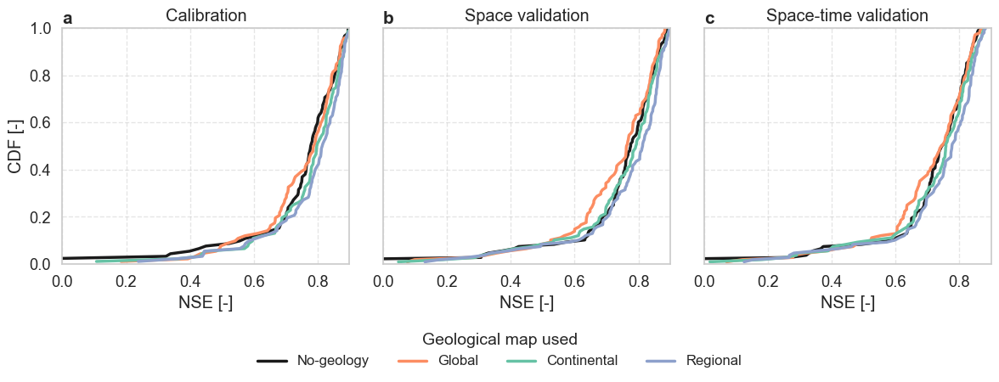

In [127]:
import matplotlib.pyplot as plt
import numpy as np

# Plotting function
def plot_cdf_mean(ax, data_dict, title, label_letter):
    dfs = list(data_dict.values())
    all_data = pd.concat(dfs, axis=0)
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    ax.set_title(title)
    ax.set_xlim(-0.0, 0.9)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)

    # Subplot label (a, b, c)
    ax.text(0, 1.075, label_letter, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

# Set styles
sns.set(style="whitegrid", font_scale=1.2)

# Color and label maps
colors = {
    'nse_nogeo': 'k',
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}
labels_pretty = {
    'nse_nogeo': 'No-geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional',
}

# --- FIGURE 1: CDF plots ---
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

plot_cdf_mean(axs[0], data_diff_calibration_complete_dict_plot, "Calibration", "a")

axs[0].set_ylabel("CDF [-]")
plot_cdf_mean(axs[1], data_diff_cal_complete_dict_plot, "Space validation", "b")
plot_cdf_mean(axs[2], data_diff_val_complete_dict_plot, "Space-time validation", "c")

# Legend shared
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           title="Geological map used",
           loc='lower center',
           bbox_to_anchor=(0.5, -0.15),
           ncol=4,
            fontsize=12,
            title_fontsize=14,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\three_cdfs.png",
    dpi=300,
    bbox_inches='tight'  # <---- Include all content including legend
)

plt.show()

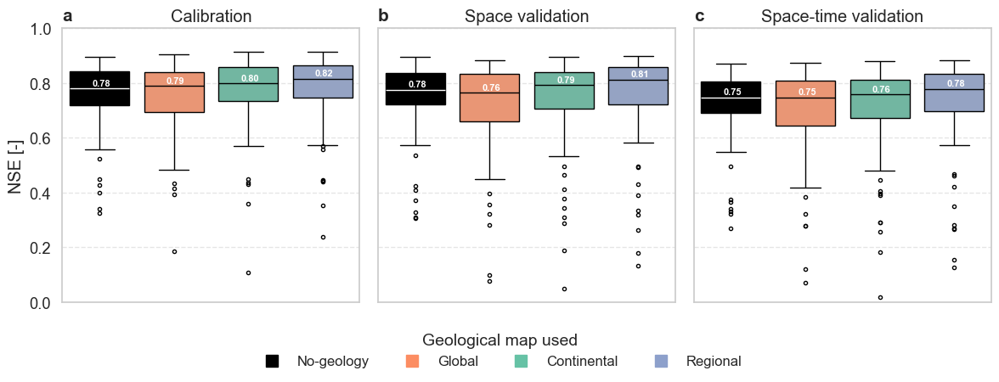

In [129]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.lines as mlines

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Model labels and colors
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'
}
colors_box = {
    'No-Geology': 'black',
    'Global': '#fc8d62',
    'Continental': '#66c2a5',
    'Regional': '#8da0cb'
}

# Your input DataFrames for the three cases
dataframes = [
    data_diff_calibration_complete,
    data_diff_cal_complete,
    data_diff_val_complete
]
titles = ['Calibration', 'Space validation', 'Space-time validation']
subplot_labels = ['a', 'b', 'c']

# Create tidy DataFrames for seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

for i, (ax, title, label) in enumerate(zip(axs, titles, subplot_labels)):
    df_sub = df_all[df_all["Validation"] == title]

    sns.boxplot(
        data=df_sub,
        x="Model",
        y="NSE",
        hue="Model",
        palette=colors_box,
        linewidth=1,
        fliersize=3,
        dodge=False,
        ax=ax
    )

    # Remove auto-generated legend
    if ax.get_legend():
        ax.get_legend().remove()

    # Annotate medians
    median_lines = ax.lines[4::6]
    for line in median_lines:
        y_data, x_data = line.get_xydata().mean(axis=0)
        ax.text(y_data - 0.1, x_data + 0.02, f"{x_data:.2f}", ha='left', va='center',
                fontweight='bold', fontsize=8, color='white')

        model_names = df_sub['Model'].unique()
        model_index = int(round(y_data))
        if model_index < len(model_names) and model_names[model_index] == 'No-Geology':
            line.set_color('white')

    ax.set_title(title)

    if i == 0:
        ax.set_ylabel("NSE [-]")
    else:
        ax.set_ylabel("")
        ax.tick_params(labelleft=False)  # Fully remove y-tick labels for right panels
    
    ax.set_xticks([])
    ax.set_xlabel("")
    ax.set_ylim(0, 1.0)
    ax.grid(True, linestyle='--', alpha=0.5)

    # Subplot label (a, b, c)
    ax.text(-0.0, 1.075, label, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

# Custom legend below
custom_handles = [
    mlines.Line2D([], [], color='black', marker='s', linestyle='None', markersize=10, label='No-geology'),
    mlines.Line2D([], [], color='#fc8d62', marker='s', linestyle='None', markersize=10, label='Global'),
    mlines.Line2D([], [], color='#66c2a5', marker='s', linestyle='None', markersize=10, label='Continental'),
    mlines.Line2D([], [], color='#8da0cb', marker='s', linestyle='None', markersize=10, label='Regional'),
]

fig.legend(
    handles=custom_handles,
    title="Geological map used",
    loc='lower center',
    bbox_to_anchor=(0.5, -0.15),
    ncol=4,
    fontsize=12,
    title_fontsize=14,
    frameon=False
)

plt.tight_layout()
plt.savefig("../results/figs/boxplots_three_panels.png", dpi=300, bbox_inches='tight')
plt.show()

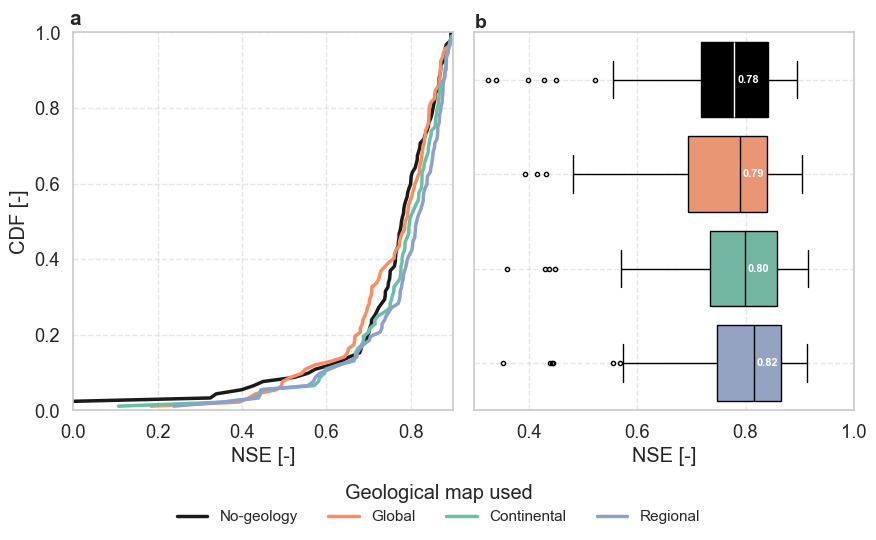

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define colors for each model type
colors = {
    'nse_nogeo': 'k',   # Coral / Orange #E69F00 other option
    'nse_g1comp': '#fc8d62',   # Coral / Orange #E69F00 other option
    'nse_c1comp': '#66c2a5',  # Mint Green
    'nse_r1comp': '#8da0cb',  # Lavender Blue
}

# Pretty names for legend
labels_pretty = {
    'nse_nogeo': 'No-geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional',
}

# Define dicts to loop through
dicts = {
    'Calibration': data_diff_calibration_complete_dict_plot   
}

# Create 1x2 subplot figure
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=False)

ax = axs[0]
 
data_dict = dicts["Calibration"]

# --- Step 1: Plot all individual curves ---
#for group_num, df in data_dict.items():
#    for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
#        if model_type in df.columns:
#            nse_values = np.sort(df[model_type].dropna())
#            if len(nse_values) == 0:
#                continue
#            cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
#            ax.plot(
#                nse_values, cumulative,
#                color=colors[model_type],
#                alpha=0.3,
#                linewidth=1
#            )


# --- Step 2: Compute and plot mean lines ---
dfs = list(data_dict.values())
all_data = pd.concat(dfs, axis=0)
data_combined = all_data.groupby(all_data.index).mean()

for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
    nse_values = np.sort(data_combined[model_type].dropna())
    if len(nse_values) == 0:
        continue
    cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
    ax.plot(
        nse_values, cumulative,
        color=colors[model_type],
        linewidth=2.5,
        label=labels_pretty[model_type]
    )

# Plot styling
ax.set_xlabel("NSE [-]")
ax.set_xlim(-0.0, 0.9)
ax.set_ylim(0, 1.0)
ax.grid(True, linestyle='--', alpha=0.5)
#ax.set_title(label, fontsize=14, weight='bold')

# Subplot label (A. / B.)
ax.text(-0.01, 1.06, "a", transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

axs[0].set_ylabel("CDF [-]")





# Define model colors
colors = {
    'Regional': '#8da0cb',
    'Continental': '#66c2a5',
    'Global': '#fc8d62',
    'No-Geology': 'black'

}

# Map column names to pretty names
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'

}

# Data sources
dataframes = [data_diff_calibration_complete]
titles = ['Space-time validation']

# Prepare tidy DataFrames for Seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

# Combine all into one tidy DataFrame
df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot loop
ax = axs[1]
val_type = titles[0]
df_sub = df_all[df_all["Validation"] == val_type]

sns.boxplot(
        data=df_sub,
        x="NSE",
        y="Model",
        hue="Model",           # Fix for future seaborn versions
        ax=ax,
        palette=colors,
        linewidth=1,
        fliersize=3,
        dodge=False            # Ensures boxes stay aligned without hue splitting
    )

# Annotate medians inside the box and change median line color for black box
median_lines = ax.lines[4::6]  # Every 6th line is a median

# Annotate medians inside the box and change median line color for black box
median_lines = ax.lines[4::6]  # Every 6th line is a median line in Seaborn boxplots

for line in median_lines:
    x_data, y_data = line.get_xydata().mean(axis=0)  # Now x = NSE (median), y = Model position

    ax.text(x_data + 0.005, y_data, f"{x_data:.2f}", ha='left', va='center',
            fontweight='bold', fontsize=8, color='white', rotation=0  # Rotate the text 90 degrees
)

    # Identify the model at this y-position
    model_names = df_sub['Model'].unique()
    model_index = int(round(y_data))
    if 0 <= model_index < len(model_names):
        model_name = model_names[model_index]
        if model_name == 'No-Geology':
            line.set_color('white')


ax.set_yticklabels([])  # Remove tick labels only


ax.set_ylabel("")
#ax.set_ylim(-0.5, 1.0)
ax.set_xlim(0.3, 1.0)

ax.grid(True, linestyle='--', alpha=0.5)

ax.set_xlabel("NSE [-]")

# Subplot label (A / B)
ax.text(-0., 1.05, "b", transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')

# Only one legend for both plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           title="Geological map used",
           loc='lower center',
           bbox_to_anchor=(0.5, -0.1),  # x=50%, y=-0.1 (adjust this to go lower)
           ncol=4,
           fontsize=11,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\cdfs_boxplots_flipped_cal.png",
    dpi=300,
    bbox_inches='tight'  # <---- Include all content including legend
)

plt.show()

### CDF combined with the boxplots

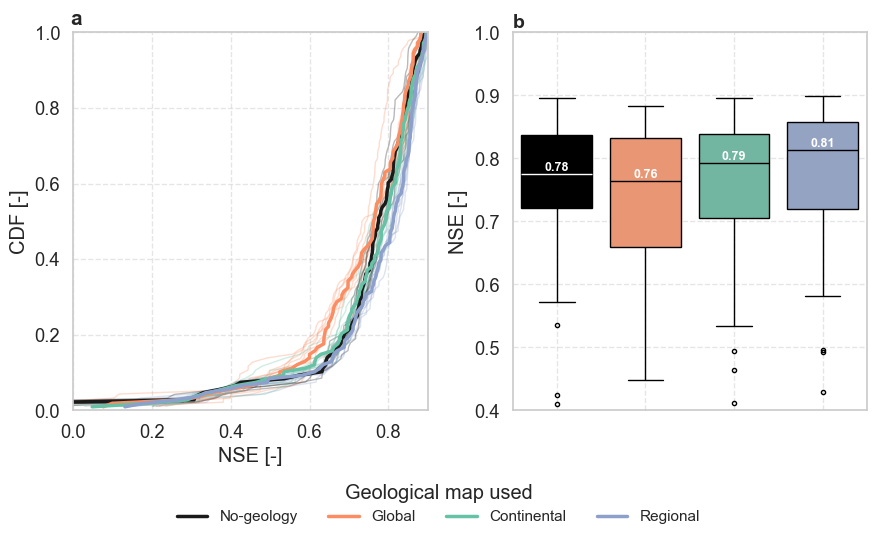

In [54]:
# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define colors for each model type
colors = {
    'nse_nogeo': 'k',   # Coral / Orange #E69F00 other option
    'nse_g1comp': '#fc8d62',   # Coral / Orange #E69F00 other option
    'nse_c1comp': '#66c2a5',  # Mint Green
    'nse_r1comp': '#8da0cb',  # Lavender Blue
}

# Pretty names for legend
labels_pretty = {
    'nse_nogeo': 'No-geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional',
}

# Define dicts to loop through
dicts = {
    'Space-time validation': data_diff_cal_complete_dict_plot   
}

# Create 1x2 subplot figure
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=False)

ax = axs[0]
 
data_dict = dicts["Space-time validation"]

# --- Step 1: Plot all individual curves ---
for group_num, df in data_dict.items():
    for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type in df.columns:
            nse_values = np.sort(df[model_type].dropna())
            if len(nse_values) == 0:
                continue
            cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
            ax.plot(
                nse_values, cumulative,
                color=colors[model_type],
                alpha=0.3,
                linewidth=1
            )


# --- Step 2: Compute and plot mean lines ---
dfs = list(data_dict.values())
all_data = pd.concat(dfs, axis=0)
data_combined = all_data.groupby(all_data.index).mean()

for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
    nse_values = np.sort(data_combined[model_type].dropna())
    if len(nse_values) == 0:
        continue
    cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
    ax.plot(
        nse_values, cumulative,
        color=colors[model_type],
        linewidth=2.5,
        label=labels_pretty[model_type]
    )

# Plot styling
ax.set_xlabel("NSE [-]")
ax.set_xlim(-0.0, 0.9)
ax.set_ylim(0, 1.0)
ax.grid(True, linestyle='--', alpha=0.5)
#ax.set_title(label, fontsize=14, weight='bold')

# Subplot label (A. / B.)
ax.text(-0.01, 1.06, "a", transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

axs[0].set_ylabel("CDF [-]")





# Define model colors
colors = {
    'Regional': '#8da0cb',
    'Continental': '#66c2a5',
    'Global': '#fc8d62',
    'No-Geology': 'black'

}

# Map column names to pretty names
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'

}

# Data sources
dataframes = [data_diff_cal_complete]
titles = ['Space-time validation']

# Prepare tidy DataFrames for Seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

# Combine all into one tidy DataFrame
df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot loop
ax = axs[1]
val_type = titles[0]
df_sub = df_all[df_all["Validation"] == val_type]

sns.boxplot(
        data=df_sub,
        x="Model",
        y="NSE",
        hue="Model",           # Fix for future seaborn versions
        ax=ax,
        palette=colors,
        linewidth=1,
        fliersize=3,
        dodge=False            # Ensures boxes stay aligned without hue splitting
    )

# Annotate medians inside the box and change median line color for black box
median_lines = ax.lines[4::6]  # Every 6th line is a median

for line in median_lines:
    x_data, y_data = line.get_xydata().mean(axis=0)
    ax.text(x_data, y_data+0.01, f"{y_data:.2f}", ha='center', va='center',
                fontweight='bold', fontsize=9, color='white')

    # Check x position to detect "No-Geology" box (assumed to be index 0-3)
    model_name = df_sub['Model'].unique()[int(round(x_data))]
    if model_name == 'No-Geology':
        line.set_color('white')  # Change median line to white

ax.set_xticklabels([])  # Remove tick labels only


ax.set_xlabel("")
#ax.set_ylim(-0.5, 1.0)
ax.set_ylim(0.4, 1.0)

ax.grid(True, linestyle='--', alpha=0.5)

ax.set_ylabel("NSE [-]")

# Subplot label (A / B)
ax.text(-0., 1.05, "b", transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')

# Only one legend for both plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           title="Geological map used",
           loc='lower center',
           bbox_to_anchor=(0.5, -0.1),  # x=50%, y=-0.1 (adjust this to go lower)
           ncol=4,
           fontsize=11,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\cdfs_boxplots.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

### CDF combined with the boxplots (paper)

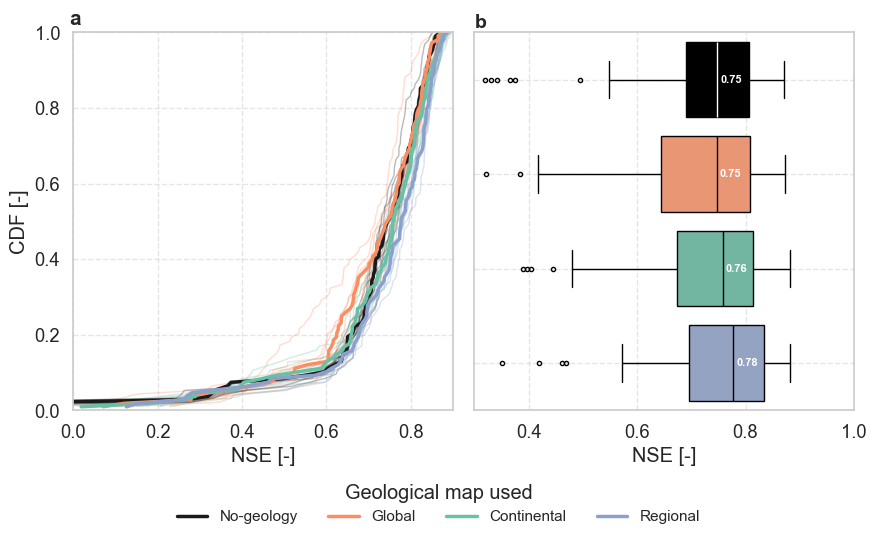

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define colors for each model type
colors = {
    'nse_nogeo': 'k',   # Coral / Orange #E69F00 other option
    'nse_g1comp': '#fc8d62',   # Coral / Orange #E69F00 other option
    'nse_c1comp': '#66c2a5',  # Mint Green
    'nse_r1comp': '#8da0cb',  # Lavender Blue
}

# Pretty names for legend
labels_pretty = {
    'nse_nogeo': 'No-geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional',
}

# Define dicts to loop through
dicts = {
    'Space-time validation': data_diff_val_complete_dict_plot   
}

# Create 1x2 subplot figure
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=False)

ax = axs[0]
 
data_dict = dicts["Space-time validation"]

# --- Step 1: Plot all individual curves ---
for group_num, df in data_dict.items():
    for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type in df.columns:
            nse_values = np.sort(df[model_type].dropna())
            if len(nse_values) == 0:
                continue
            cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
            ax.plot(
                nse_values, cumulative,
                color=colors[model_type],
                alpha=0.3,
                linewidth=1
            )


# --- Step 2: Compute and plot mean lines ---
dfs = list(data_dict.values())
all_data = pd.concat(dfs, axis=0)
data_combined = all_data.groupby(all_data.index).mean()

for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
    nse_values = np.sort(data_combined[model_type].dropna())
    if len(nse_values) == 0:
        continue
    cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
    ax.plot(
        nse_values, cumulative,
        color=colors[model_type],
        linewidth=2.5,
        label=labels_pretty[model_type]
    )

# Plot styling
ax.set_xlabel("NSE [-]")
ax.set_xlim(-0.0, 0.9)
ax.set_ylim(0, 1.0)
ax.grid(True, linestyle='--', alpha=0.5)
#ax.set_title(label, fontsize=14, weight='bold')

# Subplot label (A. / B.)
ax.text(-0.01, 1.06, "a", transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

axs[0].set_ylabel("CDF [-]")





# Define model colors
colors = {
    'Regional': '#8da0cb',
    'Continental': '#66c2a5',
    'Global': '#fc8d62',
    'No-Geology': 'black'

}

# Map column names to pretty names
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'

}

# Data sources
dataframes = [data_diff_val_complete]
titles = ['Space-time validation']

# Prepare tidy DataFrames for Seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

# Combine all into one tidy DataFrame
df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot loop
ax = axs[1]
val_type = titles[0]
df_sub = df_all[df_all["Validation"] == val_type]

sns.boxplot(
        data=df_sub,
        x="NSE",
        y="Model",
        hue="Model",           # Fix for future seaborn versions
        ax=ax,
        palette=colors,
        linewidth=1,
        fliersize=3,
        dodge=False            # Ensures boxes stay aligned without hue splitting
    )

# Annotate medians inside the box and change median line color for black box
median_lines = ax.lines[4::6]  # Every 6th line is a median

# Annotate medians inside the box and change median line color for black box
median_lines = ax.lines[4::6]  # Every 6th line is a median line in Seaborn boxplots

for line in median_lines:
    x_data, y_data = line.get_xydata().mean(axis=0)  # Now x = NSE (median), y = Model position

    ax.text(x_data + 0.005, y_data, f"{x_data:.2f}", ha='left', va='center',
            fontweight='bold', fontsize=8, color='white', rotation=0  # Rotate the text 90 degrees
)

    # Identify the model at this y-position
    model_names = df_sub['Model'].unique()
    model_index = int(round(y_data))
    if 0 <= model_index < len(model_names):
        model_name = model_names[model_index]
        if model_name == 'No-Geology':
            line.set_color('white')


ax.set_yticklabels([])  # Remove tick labels only


ax.set_ylabel("")
#ax.set_ylim(-0.5, 1.0)
ax.set_xlim(0.3, 1.0)

ax.grid(True, linestyle='--', alpha=0.5)

ax.set_xlabel("NSE [-]")

# Subplot label (A / B)
ax.text(-0., 1.05, "b", transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')

# Only one legend for both plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           title="Geological map used",
           loc='lower center',
           bbox_to_anchor=(0.5, -0.1),  # x=50%, y=-0.1 (adjust this to go lower)
           ncol=4,
           fontsize=11,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\cdfs_boxplots_flipped.png",
    dpi=300,
    bbox_inches='tight'  # <---- Include all content including legend
)

plt.show()

### CDF combined with the boxplots (appendix)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define colors for each model type
colors = {
    'nse_nogeo': 'k',   # Coral / Orange #E69F00 other option
    'nse_g1comp': '#fc8d62',   # Coral / Orange #E69F00 other option
    'nse_c1comp': '#66c2a5',  # Mint Green
    'nse_r1comp': '#8da0cb',  # Lavender Blue
}

# Pretty names for legend
labels_pretty = {
    'nse_nogeo': 'No-geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional',
}

# Define dicts to loop through
dicts = {
    'Space validation': data_diff_cal_complete_dict_plot   
}

# Create 1x2 subplot figure
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=False)

ax = axs[0]
 
data_dict = dicts["Space validation"]

# --- Step 1: Plot all individual curves ---
for group_num, df in data_dict.items():
    for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type in df.columns:
            nse_values = np.sort(df[model_type].dropna())
            if len(nse_values) == 0:
                continue
            cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
            ax.plot(
                nse_values, cumulative,
                color=colors[model_type],
                alpha=0.3,
                linewidth=1
            )


# --- Step 2: Compute and plot mean lines ---
dfs = list(data_dict.values())
all_data = pd.concat(dfs, axis=0)
data_combined = all_data.groupby(all_data.index).mean()

for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
    nse_values = np.sort(data_combined[model_type].dropna())
    if len(nse_values) == 0:
        continue
    cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
    ax.plot(
        nse_values, cumulative,
        color=colors[model_type],
        linewidth=2.5,
        label=labels_pretty[model_type]
    )

# Plot styling
ax.set_xlabel("NSE [-]")
ax.set_xlim(-0.0, 0.9)
ax.set_ylim(0, 1.0)
ax.grid(True, linestyle='--', alpha=0.5)
#ax.set_title(label, fontsize=14, weight='bold')

# Subplot label (A. / B.)
ax.text(-0.01, 1.06, "a", transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

axs[0].set_ylabel("CDF [-]")





# Define model colors
colors = {
    'Regional': '#8da0cb',
    'Continental': '#66c2a5',
    'Global': '#fc8d62',
    'No-Geology': 'black'

}

# Map column names to pretty names
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'

}

# Data sources
dataframes = [data_diff_val_complete]
titles = ['Space-time validation']

# Prepare tidy DataFrames for Seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

# Combine all into one tidy DataFrame
df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot loop
ax = axs[1]
val_type = titles[0]
df_sub = df_all[df_all["Validation"] == val_type]

sns.boxplot(
        data=df_sub,
        x="NSE",
        y="Model",
        hue="Model",           # Fix for future seaborn versions
        ax=ax,
        palette=colors,
        linewidth=1,
        fliersize=3,
        dodge=False            # Ensures boxes stay aligned without hue splitting
    )

# Annotate medians inside the box and change median line color for black box
median_lines = ax.lines[4::6]  # Every 6th line is a median

# Annotate medians inside the box and change median line color for black box
median_lines = ax.lines[4::6]  # Every 6th line is a median line in Seaborn boxplots

for line in median_lines:
    x_data, y_data = line.get_xydata().mean(axis=0)  # Now x = NSE (median), y = Model position

    ax.text(x_data + 0.005, y_data, f"{x_data:.2f}", ha='left', va='center',
            fontweight='bold', fontsize=8, color='white', rotation=0  # Rotate the text 90 degrees
)

    # Identify the model at this y-position
    model_names = df_sub['Model'].unique()
    model_index = int(round(y_data))
    if 0 <= model_index < len(model_names):
        model_name = model_names[model_index]
        if model_name == 'No-Geology':
            line.set_color('white')


ax.set_yticklabels([])  # Remove tick labels only


ax.set_ylabel("")
#ax.set_ylim(-0.5, 1.0)
ax.set_xlim(0.3, 1.0)

ax.grid(True, linestyle='--', alpha=0.5)

ax.set_xlabel("NSE [-]")

# Subplot label (A / B)
ax.text(-0., 1.05, "b", transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')

# Only one legend for both plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           title="Geological map used",
           loc='lower center',
           bbox_to_anchor=(0.5, -0.1),  # x=50%, y=-0.1 (adjust this to go lower)
           ncol=4,
           fontsize=11,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\cdfs_boxplots_flipped_appendix.png",
    dpi=300,
    bbox_inches='tight'  # <---- Include all content including legend
)

plt.show()

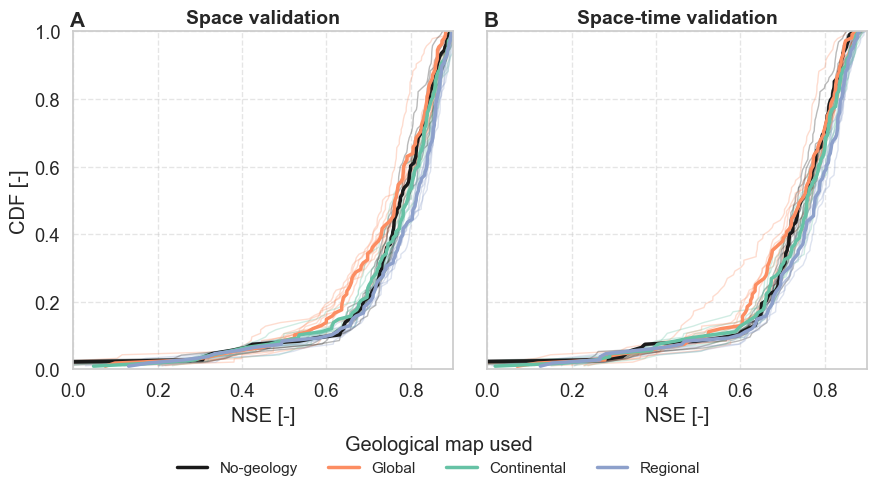

In [30]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Define colors for each model type
colors = {
    'nse_nogeo': 'k',   # Coral / Orange #E69F00 other option
    'nse_g1comp': '#fc8d62',   # Coral / Orange #E69F00 other option
    'nse_c1comp': '#66c2a5',  # Mint Green
    'nse_r1comp': '#8da0cb',  # Lavender Blue
}

# Pretty names for legend
labels_pretty = {
    'nse_nogeo': 'No-geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional',
}

# Define dicts to loop through
dicts = {
    'Space validation': data_diff_cal_complete_dict_plot,
    'Space-time validation': data_diff_val_complete_dict_plot
    
}

# Create 1x2 subplot figure
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=True)
letters = ['A', 'B']

# Plot loop
for ax, (label, data_dict), subplot_letter in zip(axs, dicts.items(), letters):
    
    # --- Step 1: Plot all individual curves ---
    for group_num, df in data_dict.items():
        for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
            if model_type in df.columns:
                nse_values = np.sort(df[model_type].dropna())
                if len(nse_values) == 0:
                    continue
                cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
                ax.plot(
                    nse_values, cumulative,
                    color=colors[model_type],
                    alpha=0.3,
                    linewidth=1
                )

    # --- Step 2: Compute and plot mean lines ---
    dfs = list(data_dict.values())
    all_data = pd.concat(dfs, axis=0)
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    # Plot styling
    ax.set_xlabel("NSE [-]")
    ax.set_xlim(-0.0, 0.9)
    ax.set_ylim(0, 1.0)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_title(label, fontsize=14, weight='bold')

    # Subplot label (A. / B.)
    ax.text(-0.01, 1.06, f"{subplot_letter}", transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

# Shared y-axis label
axs[0].set_ylabel("CDF [-]")

# Only one legend for both plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Geological map used", loc='lower center', ncol=4, fontsize=11, frameon=False)

# Final layout
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\cdfs_4geologiescomp.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\1001098119.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


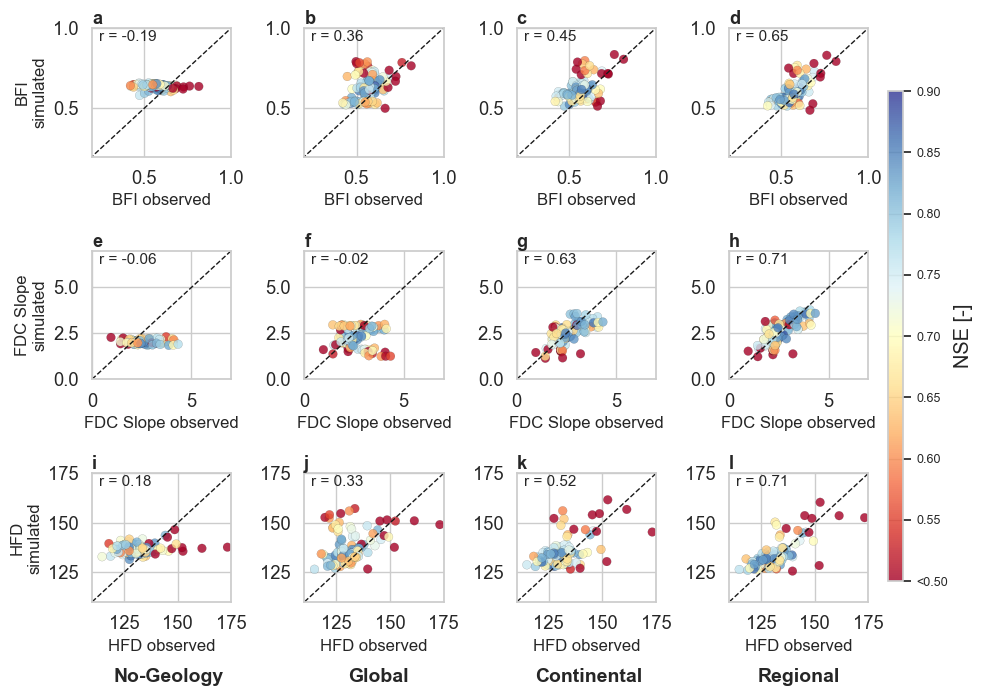

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'g1comp', 'c1comp', 'r1comp']
scale_titles = ['No-Geology', 'Global', 'Continental', 'Regional']

# Colormap and normalization
cmap = plt.cm.RdYlBu
vmin, vmax = 0.5, 0.9
norm = Normalize(vmin=vmin, vmax=vmax)

# Create subplots
fig, axs = plt.subplots(3, 4, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# For shared colorbar, store one scatter artist
scatter_for_colorbar = None

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Color values clipped to [0.5, 0.9]
        colors = data_diff_val_complete[var_nse].clip(lower=vmin, upper=vmax)

        # Scatterplot
        sc = ax.scatter(
            data_diff_val_complete[var_obs],
            data_diff_val_complete[var_pred],
            c=colors,
            cmap=cmap,
            norm=norm,
            s=40,
            edgecolor='k',
            linewidth=0.1,
            alpha=0.8
        )

        # Store one artist for colorbar
        if scatter_for_colorbar is None:
            scatter_for_colorbar = sc


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12)
        else:
            ax.set_ylabel("")
        ax.set_xlabel(f"{row_title} observed", fontsize=12)

        # Correlation
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        ax.text(
            0.05, 0.9, f"r = {R:.2f}", transform=ax.transAxes,
            fontsize=11, bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot label
        subplot_idx = row * 4 + col
        ax.text(
            -0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
            fontsize=13, fontweight='bold', va='top', ha='left'
        )

        # Set axis limits per metric
        if metric == 'bfi':
            ax.set_xlim(0.2, 1)
            ax.set_ylim(0.2, 1)
        elif metric == 'slope':
            ax.set_xlim(0, 7)
            ax.set_ylim(0, 7)
        elif metric == 'hfd':
            ax.set_xlim(110, 175)
            ax.set_ylim(110, 175)

axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 3].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 1].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 2].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 3].plot([0, 7], [0, 7], 'k--', lw=1)

axs[2, 0].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 1].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 2].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 3].plot([100, 180], [100, 180], 'k--', lw=1)


# Add single vertical colorbar to the right
fig.subplots_adjust(right=0.88)  # Make room for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter_for_colorbar, cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.ax.tick_params(labelsize=9)



# Custom ticks and labels
ticks = np.linspace(0.5, 0.9, num=9)  # Adjust number of ticks if needed
tick_labels = [f"<0.50"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

# Column titles (below x-axis)
col_positions = [0.18, 0.39, 0.6, 0.81]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0, title, ha='center', va='bottom', fontsize=14, fontweight='bold')

# Final layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.12, right=0.88)

# Optional save
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\signatures_colorbar.png", dpi=300)

plt.show()

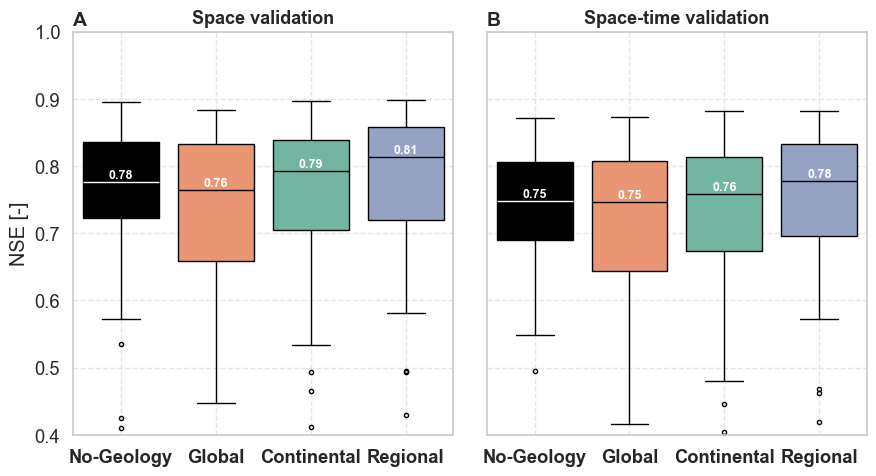

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define model colors
colors = {
    'Regional': '#8da0cb',
    'Continental': '#66c2a5',
    'Global': '#fc8d62',
    'No-Geology': 'black'

}

# Map column names to pretty names
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'

}

# Data sources
dataframes = [data_diff_cal_complete, data_diff_val_complete]
titles = ['Space validation', 'Space-time validation']
letters = ['A', 'B']

# Prepare tidy DataFrames for Seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

# Combine all into one tidy DataFrame
df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot setup
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=True)

# Plot loop
for i, ax in enumerate(axs):
    val_type = titles[i]
    df_sub = df_all[df_all["Validation"] == val_type]

    sns.boxplot(
        data=df_sub,
        x="Model",
        y="NSE",
        hue="Model",           # Fix for future seaborn versions
        ax=ax,
        palette=colors,
        linewidth=1,
        fliersize=3,
        dodge=False            # Ensures boxes stay aligned without hue splitting
    )

    # Annotate medians inside the box and change median line color for black box
    median_lines = ax.lines[4::6]  # Every 6th line is a median

    for line in median_lines:
        x_data, y_data = line.get_xydata().mean(axis=0)
        ax.text(x_data, y_data+0.01, f"{y_data:.2f}", ha='center', va='center',
                fontweight='bold', fontsize=9, color='white')

        # Check x position to detect "No-Geology" box (assumed to be index 0-3)
        model_name = df_sub['Model'].unique()[int(round(x_data))]
        if model_name == 'No-Geology':
            line.set_color('white')  # Change median line to white





    # Bold x-tick labels
    for tick in ax.get_xticklabels():
        tick.set_fontweight('bold')

    ax.set_title(val_type, fontsize=13, weight='bold')
    ax.set_xlabel("")
    #ax.set_ylim(-0.5, 1.0)
    ax.set_ylim(0.4, 1.0)

    ax.grid(True, linestyle='--', alpha=0.5)

    if i == 0:
        ax.set_ylabel("NSE [-]")
    else:
        ax.set_ylabel("")

    # Subplot label (A / B)
    ax.text(-0., 1.05, f"{letters[i]}", transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')
    
# Final layout
plt.tight_layout()
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\boxplots_4geologies.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\621541014.py:58: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\621541014.py:64: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True,
C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\621541014.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True,
C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\621541014.py:114: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True,


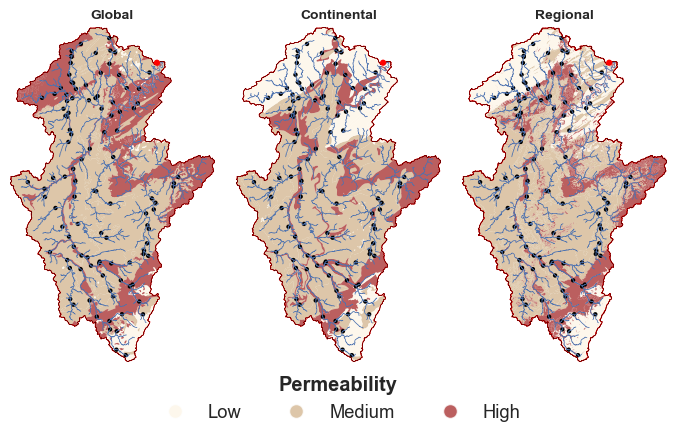

In [33]:
network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7, 4))  # Two subplots side by side

# Select multiple geometries
FR_selected_gdf = moselle.copy()

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)


# Plot the river
rivers_moselle.plot(ax=ax1, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax2, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax3, linewidth=0.5, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    ax.set_title(text_to_subplots[i], loc="center", fontsize=10, fontweight="bold")
    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')

# Adjust the layout to remove extra space
plt.tight_layout()

fig.savefig(r'..\results\figs\fig_permeability_moselle.png', dpi=300, bbox_inches='tight')

C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\1501369036.py:84: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\1501369036.py:86: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\1501369036.py:88: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
C:\Users\nascimth\AppData\Local\Temp\ipykernel_39508\1501369036.py:160: UserWarning: This figure includes Axes that ar

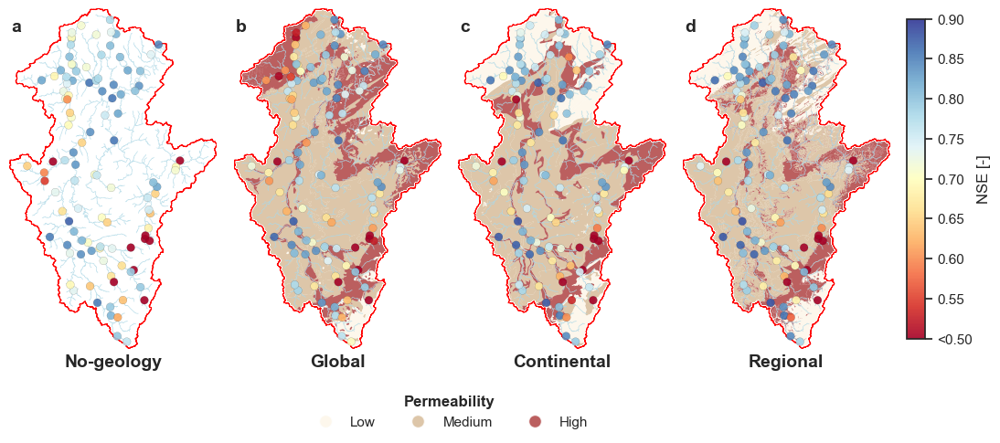

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_val_complete.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = ['No-geology', 'Global', 'Continental', 'Regional']
background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = moselle.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
#plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Color setup
vmin, vmax = 0.5, 0.9
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
    elif bg_type == 'median':
        geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
    elif bg_type == 'high':
        geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

    # Add rivers and boundary for all
    moselle.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)

# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.5, 0.9, num=9)
tick_labels = [f"<0.50"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')

# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\maps_combined.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [35]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<=0.5].loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
basin,,,,
DERP2013,0.267132,0.290461,0.120473,-0.666550
FR000144,0.153608,0.018607,0.070845,-0.225342
FR000183,0.419650,0.404198,0.416707,0.341240
FR000184,0.468301,0.388776,0.523795,0.269280
FR000185,0.267584,0.255912,0.279419,0.373854
FR003250,0.125873,0.180606,0.279063,0.320296
FR003254,0.461596,0.445551,0.467034,0.366102
FR003259,0.281659,0.290221,0.321374,0.329665
FR003280,0.350968,0.396705,0.383060,0.494246


In [36]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<=0.5].loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
basin,,,,
DERP2013,0.267132,0.290461,0.120473,-0.666550
FR000144,0.153608,0.018607,0.070845,-0.225342
FR000183,0.419650,0.404198,0.416707,0.341240
FR000184,0.468301,0.388776,0.523795,0.269280
FR000185,0.267584,0.255912,0.279419,0.373854
FR003250,0.125873,0.180606,0.279063,0.320296
FR003254,0.461596,0.445551,0.467034,0.366102
FR003259,0.281659,0.290221,0.321374,0.329665
FR003280,0.350968,0.396705,0.383060,0.494246


Index(['nse', 'nse_rg', 'nse_r1', 'nse_c1', 'nse_g1', 'nse_bfi_r1',
       'nse_bfi_c1', 'nse_bfi_g1', 'bfi_obs', 'bfi_r1', 'bfi_c1', 'bfi_g1',
       'qmean_obs', 'qmean_r1', 'qmean_c1', 'qmean_g1', 'slope_obs',
       'slope_r1', 'slope_c1', 'slope_g1', 'hfd_obs', 'hfd_r1', 'hfd_c1',
       'hfd_g1', 'bfi_nogeo', 'slope_nogeo', 'hfd_nogeo', 'nse_nogeo',
       'nse_r1comp', 'nse_c1comp', 'nse_g1comp', 'bfi_r1comp', 'bfi_c1comp',
       'bfi_g1comp', 'qmean_r1comp', 'qmean_c1comp', 'qmean_g1comp',
       'slope_r1comp', 'slope_c1comp', 'slope_g1comp', 'hfd_r1comp',
       'hfd_c1comp', 'hfd_g1comp'],
      dtype='object')

In [ ]:
data_diff_val_complete_dict_plot

AttributeError: 'dict' object has no attribute 'nse_r1comp'

In [145]:
data_diff_val_complete[data_diff_val_complete.nse_g1comp>=0.7].loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
basin,,,,
DEBU1956,0.836769,0.843025,0.831102,0.837674
DEBU1957,0.860983,0.860791,0.865020,0.856370
DEBU1958,0.856200,0.860100,0.849806,0.856665
DEBU1959,0.845600,0.851078,0.846451,0.847883
DERP2003,0.872480,0.873299,0.827606,0.859258
...,...,...,...,...
LU000006,0.836865,0.836591,0.802104,0.819307
LU000007,0.773970,0.772686,0.755608,0.741692
LU000009,0.731151,0.717322,0.721853,0.706397


In [141]:
data_diff_val_complete.loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
basin,,,,
BEWA0066,0.849026,0.826988,0.628351,0.779171
BEWA0067,0.787471,0.756212,0.627980,0.711989
BEWA0106,0.778157,0.764990,0.477557,0.693718
BEWA0107,0.743017,0.732049,0.525144,0.724209
BEWA0119,0.820006,0.800625,0.635017,0.774866
...,...,...,...,...
LU000015,0.829616,0.816852,0.554646,0.772348
LU000016,0.664423,0.661448,0.645742,0.650373
LU000017,0.853616,0.851334,0.823115,0.840427


In [40]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp>=0.87].loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
basin,,,,
DERP2003,0.872480,0.873299,0.827606,0.859258
FR003237,0.877930,0.871162,0.835387,0.853519
FR003249,0.877894,0.875290,0.864799,0.851735
FR003265,0.882486,0.881107,0.873250,0.870622


In [41]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<=0.5].loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
basin,,,,
DERP2013,0.267132,0.290461,0.120473,-0.666550
FR000144,0.153608,0.018607,0.070845,-0.225342
FR000183,0.419650,0.404198,0.416707,0.341240
FR000184,0.468301,0.388776,0.523795,0.269280
FR000185,0.267584,0.255912,0.279419,0.373854
FR003250,0.125873,0.180606,0.279063,0.320296
FR003254,0.461596,0.445551,0.467034,0.366102
FR003259,0.281659,0.290221,0.321374,0.329665
FR003280,0.350968,0.396705,0.383060,0.494246


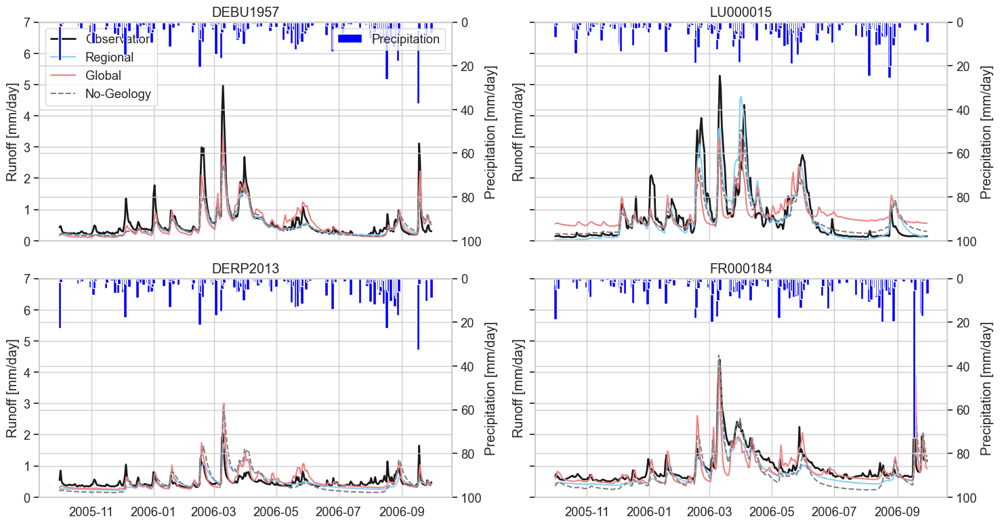

In [160]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["DEBU1957", "LU000015", "DERP2013", "FR000184"]  # Replace with your desired gauge IDs
start_date = "2005-10-01"
end_date = "2006-09-30"

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 8), sharex=True, sharey=True)
axs = axs.flatten()  # Flatten 2D array of axes to 1D for easier iteration

for i, gauge_id in enumerate(gauge_ids):
    ax1 = axs[i]

    # Subset dataset
    ts = ds.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))

    # Plot discharge simulations and observation
    ax1.plot(ts.date, ts["observation"], label="Observation", linewidth=2, color="k")
    ax1.plot(ts.date, ts["regional"], label="Regional", color="lightskyblue")
    #ax1.plot(ts.date, ts["continental"], label="Continental")
    ax1.plot(ts.date, ts["global"], label="Global", color="lightcoral")
    ax1.plot(ts.date, ts["nogeology"], label="No-Geology", linestyle="--", color="gray")
    ax1.set_ylabel("Runoff [mm/day]")
    ax1.grid(True)
    ax1.set_ylim(0, 7)

    # Add precipitation on secondary axis
    ax2 = ax1.twinx()
    ax2.bar(ts.date, ts["precipitation"], width=3.0, color='blue', label="Precipitation")
    ax2.set_ylabel("Precipitation [mm/day]")
    ax2.set_ylim(0, 100)
    ax2.invert_yaxis()  # Invert y-axis to simulate hydrograph style

    # Title
    ax1.set_title(f"{gauge_id}")

    # Legends (only show in first subplot to avoid clutter)
    if i == 0:
        ax1.legend(loc="upper left")
        ax2.legend(loc="upper right")

# Shared x-label only for bottom subplots
for ax in axs[::]:
    ax.set_xlabel("")

plt.tight_layout()
plt.show()

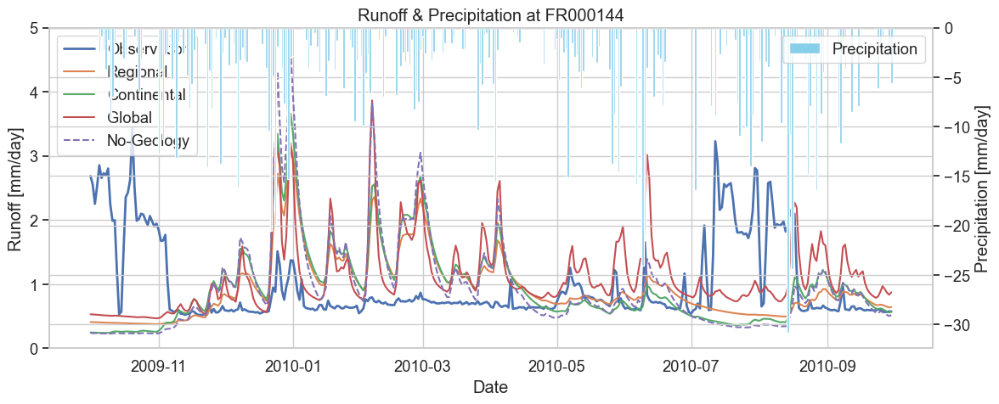

In [132]:
import matplotlib.pyplot as plt

# Define parameters
gauge_id = "FR000144"
start_date = "2009-10-01"
end_date = "2010-09-30"

# Subset the dataset
ts = ds.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 5))

# Plot discharge simulations and observation
ax1.plot(ts.date, ts["observation"], label="Observation", linewidth=2)
ax1.plot(ts.date, ts["regional"], label="Regional")
ax1.plot(ts.date, ts["continental"], label="Continental")
ax1.plot(ts.date, ts["global"], label="Global")
ax1.plot(ts.date, ts["nogeology"], label="No-Geology", linestyle="--")
ax1.set_ylabel("Runoff [mm/day]")
ax1.set_xlabel("Date")
ax1.legend(loc="upper left")
ax1.grid(True)
ax1.set_ylim(0, 5)
# Add precipitation as inverted bars on second axis
ax2 = ax1.twinx()
ax2.bar(ts.date, -ts["precipitation"], width=1.0, color='skyblue', label="Precipitation")
ax2.set_ylabel("Precipitation [mm/day]")
#ax2.set_ylim(0, 50)

#ax2.invert_yaxis()  # Invert y-axis to simulate hydrograph style
ax2.legend(loc="upper right")
plt.title(f"Runoff & Precipitation at {gauge_id}")
plt.tight_layout()
plt.show()


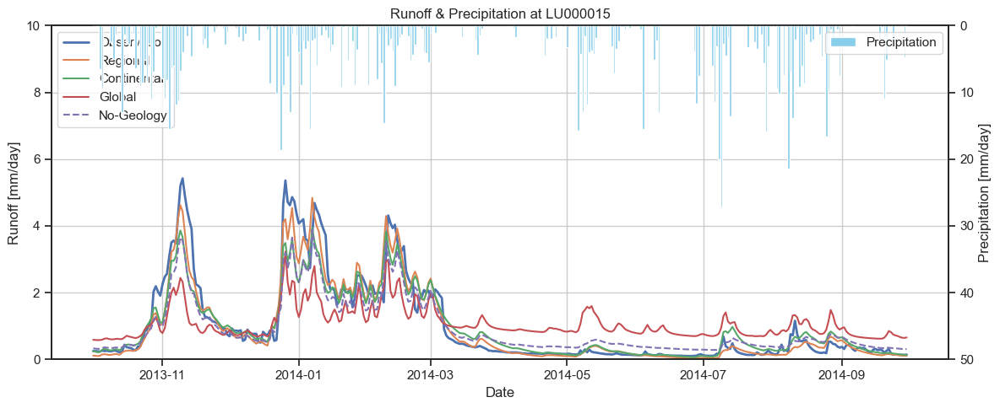

In [91]:
import matplotlib.pyplot as plt

# Define parameters
gauge_id = "LU000015"
start_date = "2013-10-01"
end_date = "2014-09-30"

# Subset the dataset
ts = ds.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 5))

# Plot discharge simulations and observation
ax1.plot(ts.date, ts["observation"], label="Observation", linewidth=2)
ax1.plot(ts.date, ts["regional"], label="Regional")
ax1.plot(ts.date, ts["continental"], label="Continental")
ax1.plot(ts.date, ts["global"], label="Global")
ax1.plot(ts.date, ts["nogeology"], label="No-Geology", linestyle="--")
ax1.set_ylabel("Runoff [mm/day]")
ax1.set_xlabel("Date")
ax1.legend(loc="upper left")
ax1.grid(True)
ax1.set_ylim(0, 10)
# Add precipitation as inverted bars on second axis
ax2 = ax1.twinx()
ax2.bar(ts.date, ts["precipitation"], width=1.0, color='skyblue', label="Precipitation")
ax2.set_ylabel("Precipitation [mm/day]")
ax2.set_ylim(0, 50)

ax2.invert_yaxis()  # Invert y-axis to simulate hydrograph style
ax2.legend(loc="upper right")
plt.title(f"Runoff & Precipitation at {gauge_id}")
plt.tight_layout()
plt.show()


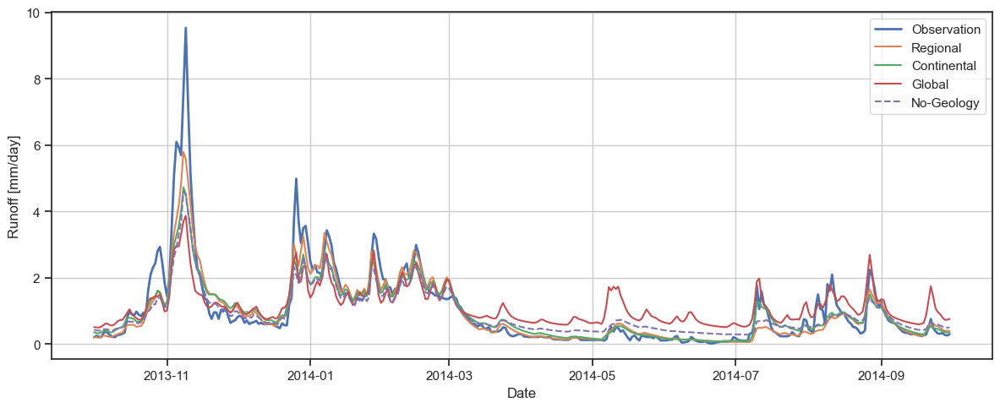

In [71]:
import matplotlib.pyplot as plt

# Define parameters
gauge_id = "LU000019"
start_date = "2013-10-01"
end_date = "2014-09-30"

# Subset the dataset
ts = ds.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))

# Plot
plt.figure(figsize=(12, 5))
plt.plot(ts.date, ts["observation"], label="Observation", linewidth=2)
plt.plot(ts.date, ts["regional"], label="Regional")
plt.plot(ts.date, ts["continental"], label="Continental")
plt.plot(ts.date, ts["global"], label="Global")
plt.plot(ts.date, ts["nogeology"], label="No-Geology", linestyle="--")

plt.xlabel("Date")
plt.ylabel("Runoff [mm/day]")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

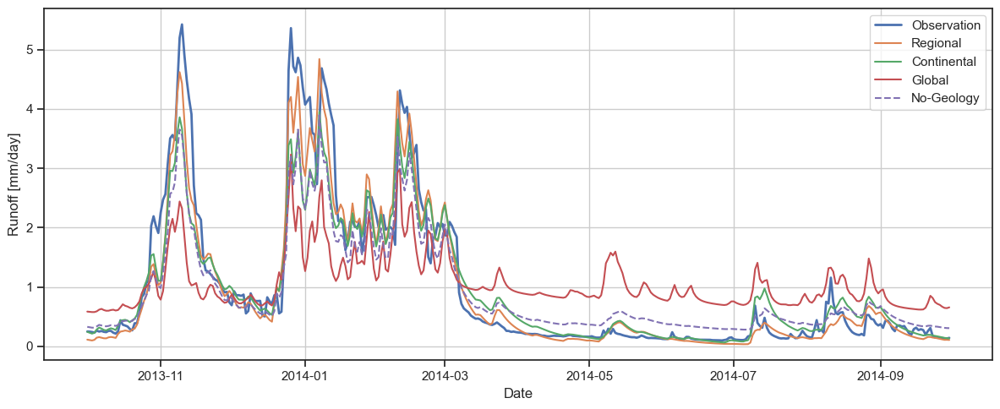

In [70]:
import matplotlib.pyplot as plt

# Define parameters
gauge_id = "LU000015"
start_date = "2013-10-01"
end_date = "2014-09-30"

# Subset the dataset
ts = ds.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))

# Plot
plt.figure(figsize=(12, 5))
plt.plot(ts.date, ts["observation"], label="Observation", linewidth=2)
plt.plot(ts.date, ts["regional"], label="Regional")
plt.plot(ts.date, ts["continental"], label="Continental")
plt.plot(ts.date, ts["global"], label="Global")
plt.plot(ts.date, ts["nogeology"], label="No-Geology", linestyle="--")

plt.xlabel("Date")
plt.ylabel("Runoff [mm/day]")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

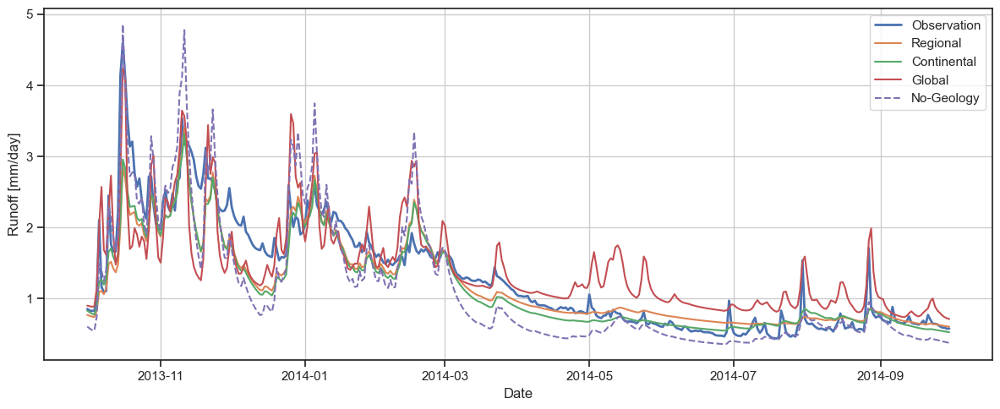

In [66]:
import matplotlib.pyplot as plt

# Define parameters
gauge_id = "FR000184"
start_date = "2013-10-01"
end_date = "2014-09-30"

# Subset the dataset
ts = ds.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))

# Plot
plt.figure(figsize=(12, 5))
plt.plot(ts.date, ts["observation"], label="Observation", linewidth=2)
plt.plot(ts.date, ts["regional"], label="Regional")
plt.plot(ts.date, ts["continental"], label="Continental")
plt.plot(ts.date, ts["global"], label="Global")
plt.plot(ts.date, ts["nogeology"], label="No-Geology", linestyle="--")

plt.xlabel("Date")
plt.ylabel("Runoff [mm/day]")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [101]:
network_estreams_gdf

,Unnamed: 0,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,...,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_high_glob2,perm_medium_glob2,perm_low_glob2,group,geometry,basin_id
basin_id,,,,,,,,,,,,,,,,,,,,,
LU000018,0,5,Schoenfels,LU,LU_CONTACTFORM,Mamer,6.100795,49.723112,6.100795,49.723112,...,17.0,39.0,61.0,0.0,0.0,100.0,0.0,Group_1,POINT (6.1008 49.72311),LU000018
LU000010,1,6,Hunnebuer,LU,LU_CONTACTFORM,Eisch,6.079524,49.729184,6.079524,49.729184,...,16.0,42.0,58.0,0.0,1.0,99.0,0.0,Group_1,POINT (6.07952 49.72918),LU000010
LU000001,2,17,Bigonville,LU,LU_CONTACTFORM,Sure,5.801399,49.869821,5.801399,49.869821,...,9.0,1.0,0.0,99.0,100.0,0.0,0.0,Group_1,POINT (5.8014 49.86982),LU000001
DERP2028,3,2674030900,Eisenschmitt,DE,DE_RP,Salm,6.718000,50.048000,6.718000,50.048000,...,10.0,80.0,7.0,13.0,79.0,20.0,1.0,Group_1,POINT (6.718 50.048),DERP2028
FR000183,4,A900105050,A9001050,FR,FR_EAUFRANCE,La Sarre à Laneuveville-lès-Lorquin,7.008689,48.654579,7.008689,48.654579,...,4.0,66.0,29.0,5.0,64.0,30.0,6.0,Group_1,POINT (7.00869 48.65458),FR000183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DERP2007,106,2628050400,Pruemzurlay,DE,DE_RP,Pruem,6.437000,49.868000,6.437000,49.868000,...,21.0,16.0,19.0,65.0,7.0,93.0,0.0,Group_7,POINT (6.437 49.868),DERP2007
FR003271,107,A782101001,La Seille Ã Nomeny,FR,FR_EAUFRANCE,La Seille à Nomeny,6.227788,48.888271,6.227788,48.888271,...,5.0,8.0,92.0,0.0,0.0,100.0,0.0,Group_7,POINT (6.22779 48.88827),FR003271
FR003301,108,A930108040,La Sarre Ã Wittring,FR,FR_EAUFRANCE,La Sarre à Wittring,7.150066,49.053225,7.150066,49.053225,...,16.0,17.0,83.0,0.0,15.0,85.0,0.0,Group_7,POINT (7.15007 49.05322),FR003301


## Study area

In [113]:
catchment_boundaries_moselle = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

In [140]:
world = gpd.read_file(r"C:\Users\nascimth\Documents\data\gis\world.shp")


C:\Users\nascimth\AppData\Local\Temp\ipykernel_21184\31380701.py:34: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = moselle.unary_union
C:\Users\nascimth\AppData\Local\Temp\ipykernel_21184\31380701.py:132: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), rotation=90, ha='center', fontsize=10)
C:\Users\nascimth\AppData\Local\Temp\ipykernel_21184\31380701.py:133: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)
C:\Users\nascimth\AppData\Local\Temp\ipykernel_21184\31380701.py:147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0)


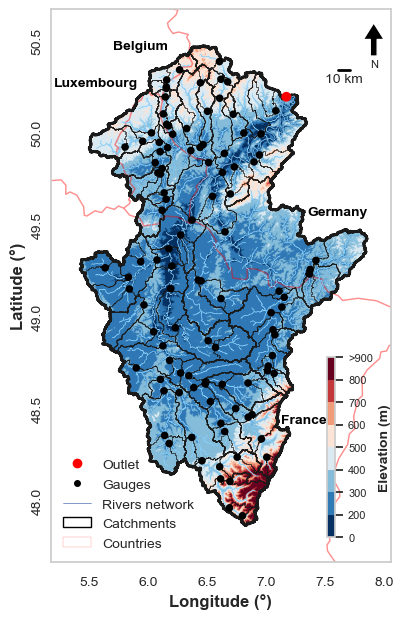

In [277]:
import matplotlib as mpl
from matplotlib.colors import BoundaryNorm


# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, ax = plt.subplots(figsize=(4, 6))


data_df = estreams_attributes_dfs["DEBU1959"]
# Load the world shapefile dataset provided by GeoPandas

# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 12           # Change the font size
mpl.rcParams['font.weight'] = 'normal'   # Change font weight
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight


# Clear the subplot
ax.clear()

# Set the background color to white
ax.set_facecolor('white')

# Set plot limits to the bounding box of the selected study areas
bounds = moselle.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = moselle.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

world.plot(ax=ax, color='none', edgecolor='red', linewidth=1, alpha=0.25)

# Calculate the extent
left, bottom = transform * (0, 0)
right, top = transform * (elevation_wgs.shape[1], elevation_wgs.shape[0])
extent = (left, right, top, bottom)  # Notice the order for top and bottom

# Define the color classes (discrete intervals)
bounds = [0, 200, 300, 400, 500, 600, 700, 800, 900]  # Define class boundaries
cmap = plt.get_cmap('RdBu_r')  # Choose a colormap
norm = BoundaryNorm(bounds, cmap.N)  # Normalize based on the class boundaries

# Plot the elevation data with class intervals
cax = ax.imshow(elevation_wgs, cmap=cmap, norm=norm, extent=extent)

# Add colorbar with class labels
#cbar = fig.colorbar(cax, ticks=bounds)
#cbar.set_label('Elevation (m)')
# Create a small colorbar inside the plot
cbar_ax = fig.add_axes([0.8, 0.12, 0.02, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(cax, cax=cbar_ax, orientation='vertical', ticks=bounds)

tick_labels = [str(b) for b in bounds[:-1]] + ['>900']
cbar.ax.set_yticklabels(tick_labels)

cbar.ax.tick_params(labelsize=8)  # Set the font size for the ticks
cbar.set_label('Elevation (m)', fontsize=10)  # Set the label with a smaller font size

# Adjust the colorbar size (shrink)
#cbar.ax.set_aspect('auto')

# Set the title and show the plot
#ax.set_title('C', loc = "left", fontsize=14, fontweight="bold")

# Plot the river
rivers_moselle.plot(ax=ax, linewidth=0.5, color="lightskyblue")

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax, facecolor='none', edgecolor='darkred', linewidth=0.8)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Sub-catchments')

moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=2, label='Sub-catchments')
catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5, label='Sub-catchments')


# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax, color='black', markersize=30, edgecolor='none', linewidth=0.5, 
                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax, color='red', markersize=50, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min-0.25, x_max+0.2)
ax.set_ylim(y_min-0.2, y_max+0.2)


ax.set_xlabel("Longitude (°)", fontsize=12)
ax.set_ylabel("Latitude (°)", fontsize=12)

# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', label='Catchments')
countries_patch = Patch(facecolor='none', edgecolor='red', lw=0.25, alpha = 0.5, label='Countries')

# For streamflow gauges (as black dots)
streamflow_marker = Line2D([0], [0], color='black', lw=0, marker='o', markersize=4, label='Gauges')

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlet')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network')

# Add the legend with all items
legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, subcatchment_patch, countries_patch], 
                   loc='lower left', fontsize=10, title="", title_fontsize='8', frameon=False)

# Add a north arrow
x, y, arrow_length = 0.95, 0.975, 0.075
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length), arrowprops=dict(facecolor='black', width=5, headwidth=15), ha='center', va='center', fontsize=8, xycoords=ax.transAxes)

# Add a scale bar 
scalebar_length = 10  # in kilometers
x_scalebar = x_max - (x_max - x_min) * 0.1
y_scalebar = y_min + (y_max - y_min) * 0.95
ax.plot([x_scalebar, x_scalebar + scalebar_length/100], [y_scalebar, y_scalebar], color='black', linewidth=2)
ax.text(x_scalebar + (scalebar_length/200), y_scalebar - (y_max - y_min) * 0.02, f'{scalebar_length} km', ha='center', va='center', fontsize=10)

# Rotate the existing y-tick labels without changing them
ax.set_yticklabels(ax.get_yticklabels(), rotation=90, ha='center', fontsize=10)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)

# Adding some text
ax.text(5.7, 50.4, 'Belgium', fontsize=10, color='black', fontweight='bold')
ax.text(5.2, 50.2, 'Luxembourg', fontsize=10, color='black', fontweight='bold')
ax.text(7.35, 49.50, 'Germany', fontsize=10, color='black', fontweight='bold')
ax.text(7.12, 48.37, 'France', fontsize=10, color='black', fontweight='bold')

import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
#ax.set_aspect('equal')
ax.grid(False)
# Adjust the layout to remove extra space
plt.tight_layout(pad=0)

# Save including everything (colorbar + legend)
plt.savefig(
    r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\study_area.png",
    dpi=300,
    bbox_inches='tight'
)
# Show the plot
plt.show()

## Correlations

In [44]:
estreams_attributes_clipped_filters["nse_r1comp"] = df["nse_r1comp"]
estreams_attributes_clipped_filters["nse_g1comp"] = df["nse_g1comp"]
estreams_attributes_clipped_filters["nse_nogeo"] = df["nse_nogeo"]
estreams_attributes_clipped_filters["bfi_obs"] = df["bfi_obs"]

estreams_attributes_clipped_filters_plot = estreams_attributes_clipped_filters.copy()
estreams_attributes_clipped_filters_plot.drop("group", inplace=True, axis=1)

corr_series = estreams_attributes_clipped_filters_plot.iloc[:, 30:].corr(method="spearman")["nse_r1comp"]
filtered_corr = corr_series[abs(corr_series) > 0.4]

filtered_corr

slope_sawicz           0.401566
hfd_mean              -0.414936
perm_low_glob          0.524778
lit_fra_mt             0.524778
perm_verylow_cont      0.534428
lulc_2006_Agric        0.409357
dam_num                0.432903
res_num                0.432903
irri_2005              0.453797
stations_num_p_mean    0.686174
perm_low_regi          0.512380
nse_r1comp             1.000000
nse_g1comp             0.752904
nse_nogeo              0.907803
Name: nse_r1comp, dtype: float64

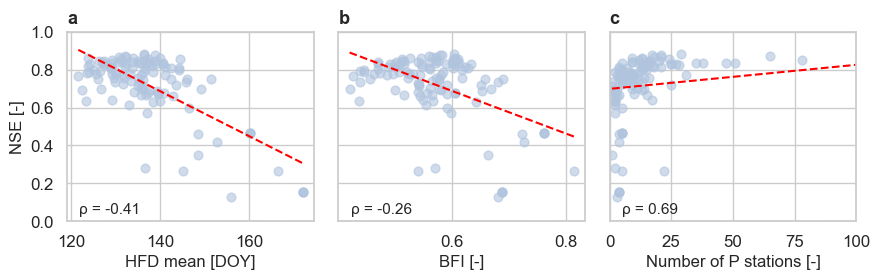

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharey=True)

# Panel A: NSE vs HFD mean
sns.regplot(
    color="lightsteelblue",
    data=estreams_attributes_clipped_filters_plot,
    x="hfd_mean",
    y="nse_r1comp",
    ax=axes[0],
    scatter_kws={"alpha": 0.6, "s": 40},
    line_kws={"color": "red", "linewidth": 1.5, "linestyle": "--"},
    ci=None  # No confidence interval
)
axes[0].set_xlabel("HFD mean [DOY]", fontsize=12)
axes[0].set_ylabel("NSE [-]", fontsize=12)
axes[0].set_title("a", loc='left', fontsize=13, fontweight="bold")
axes[0].axhline(0, linestyle='--', color='gray', linewidth=1)

# Spearman r for HFD
r1, _ = spearmanr(
    estreams_attributes_clipped_filters_plot["hfd_mean"],
    estreams_attributes_clipped_filters_plot["nse_r1comp"]
)

axes[0].text(0.05, 0.1, f"ρ = {r1:.2f}", transform=axes[0].transAxes, fontsize=11, ha='left', va='top')

# Panel B: NSE vs BFI
sns.regplot(
    color="lightsteelblue",
    data=estreams_attributes_clipped_filters_plot,
    x="bfi_obs",
    y="nse_r1comp",
    ax=axes[1],
    scatter_kws={"alpha": 0.6, "s": 40},
    line_kws={"color": "red", "linewidth": 1.5, "linestyle": "--"},
    ci=None
)

axes[1].set_xlabel("BFI [-]", fontsize=12)
axes[1].set_ylabel("")
axes[1].set_title("b", loc='left', fontsize=13, fontweight="bold")
axes[1].axhline(0, linestyle='--', color='gray', linewidth=1)

# Spearman r for BFI
r2, _ = spearmanr(
    estreams_attributes_clipped_filters_plot["bfi_obs"],
    estreams_attributes_clipped_filters_plot["nse_r1comp"]
)
axes[1].text(0.05, 0.1, f"ρ = {r2:.2f}", transform=axes[1].transAxes, fontsize=11, ha='left', va='top')

# Panel C: NSE vs number of stations
sns.regplot(
    color="lightsteelblue",
    data=estreams_attributes_clipped_filters_plot,
    x="stations_num_p_mean",
    y="nse_r1comp",
    ax=axes[2],
    scatter_kws={"alpha": 0.6, "s": 40},
    line_kws={"color": "red", "linewidth": 1.5, "linestyle": "--"},
    ci=None
)
axes[2].set_xlabel("Number of P stations [-]", fontsize=12)
axes[2].set_ylabel("")
axes[2].set_title("c", loc='left', fontsize=13, fontweight="bold")
axes[2].axhline(0, linestyle='--', color='gray', linewidth=1)
axes[2].set_ylim(0, 1)
axes[2].set_xlim(0, 100)

# Spearman r for stations
r3, _ = spearmanr(
    estreams_attributes_clipped_filters_plot["stations_num_p_mean"],
    estreams_attributes_clipped_filters_plot["nse_r1comp"]
)
axes[2].text(0.05, 0.1, f"ρ = {r3:.2f}", transform=axes[2].transAxes, fontsize=11, ha='left', va='top')

# Layout
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\correlations.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [210]:
estreams_attributes_clipped_filters_plot[estreams_attributes_clipped_filters_plot.nse_r1comp<0.5].iloc[:, 110:130]

,lulc_2006_agriculture,dam_num,res_num,lakes_num,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_high_glob2,perm_medium_glob2,perm_low_glob2,nse_r1comp
basin_id,,,,,,,,,,,,,,,,,
FR000183,0.151,0.0,0.0,0.0,0.00,0.00,5.440,0.000,0.000,4.0,66.0,29.0,5.0,64.0,30.0,6.0,0.403250
FR000185,0.156,0.0,0.0,0.0,0.00,0.00,5.536,0.000,0.000,5.0,75.0,23.0,2.0,71.0,27.0,2.0,0.252335
FR000144,0.032,1.0,1.0,2.0,2.86,57.45,7.244,0.000,0.000,4.0,92.0,0.0,8.0,83.0,5.0,12.0,0.141722
FR000144,0.032,1.0,1.0,2.0,2.86,57.45,7.244,0.000,0.000,4.0,92.0,0.0,8.0,83.0,5.0,12.0,0.141722
FR003280,0.749,0.0,0.0,0.0,0.00,0.00,2.491,0.013,0.032,1.0,0.0,100.0,0.0,0.0,100.0,0.0,0.333238
FR000184,0.042,0.0,0.0,0.0,0.00,0.00,6.350,0.000,0.000,5.0,98.0,2.0,0.0,96.0,4.0,0.0,0.470787
FR000144,0.032,1.0,1.0,2.0,2.86,57.45,7.244,0.000,0.000,4.0,92.0,0.0,8.0,83.0,5.0,12.0,0.141722
DERP2013,0.311,0.0,0.0,1.0,0.10,0.62,3.575,0.000,0.000,22.0,91.0,9.0,0.0,92.0,8.0,0.0,0.334203
FR003259,0.414,0.0,0.0,0.0,0.00,0.00,3.622,0.011,0.009,2.0,66.0,34.0,0.0,35.0,65.0,0.0,0.298477


In [207]:
estreams_attributes_clipped_filters_plot[estreams_attributes_clipped_filters_plot.nse_r1comp<0.5]

,Unnamed: 0,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,...,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_high_glob2,perm_medium_glob2,perm_low_glob2,nse_r1comp
basin_id,,,,,,,,,,,,,,,,,,,,,
FR000183,4,A900105050,A9001050,FR,FR_EAUFRANCE,La Sarre à Laneuveville-lès-Lorquin,7.008689,48.654579,7.008689,48.654579,...,0.000,0.000,4.0,66.0,29.0,5.0,64.0,30.0,6.0,0.403250
FR000185,8,A902101060,A9021050,FR,FR_EAUFRANCE,La Sarre à Hermelange,7.014472,48.680322,7.014472,48.680322,...,0.000,0.000,5.0,75.0,23.0,2.0,71.0,27.0,2.0,0.252335
FR000144,16,A623201001,A6232010,FR,FR_EAUFRANCE,La Plaine à Raon-l'Étape [La Trouche],6.877879,48.416320,6.877879,48.416320,...,0.000,0.000,4.0,92.0,0.0,8.0,83.0,5.0,12.0,0.141722
FR000144,23,A623201001,A6232010,FR,FR_EAUFRANCE,La Plaine à Raon-l'Étape [La Trouche],6.877879,48.416320,6.877879,48.416320,...,0.000,0.000,4.0,92.0,0.0,8.0,83.0,5.0,12.0,0.141722
FR003280,36,A832201001,Le Woigot Ã Briey,FR,FR_EAUFRANCE,Le Woigot à Briey,5.933378,49.246953,5.933378,49.246953,...,0.013,0.032,1.0,0.0,100.0,0.0,0.0,100.0,0.0,0.333238
FR000184,49,A901305050,A9013050,FR,FR_EAUFRANCE,La Sarre Rouge à Vasperviller,7.060836,48.640785,7.064290,48.640085,...,0.000,0.000,5.0,98.0,2.0,0.0,96.0,4.0,0.0,0.470787
FR000144,65,A623201001,A6232010,FR,FR_EAUFRANCE,La Plaine à Raon-l'Étape [La Trouche],6.877879,48.416320,6.877879,48.416320,...,0.000,0.000,4.0,92.0,0.0,8.0,83.0,5.0,12.0,0.141722
DERP2013,76,2642030800,Contwig,DE,DE_RP,Schwarzbach,7.419000,49.254000,7.419000,49.254000,...,0.000,0.000,22.0,91.0,9.0,0.0,92.0,8.0,0.0,0.334203
FR003259,83,A664031002,L'ArentÃƒÂ¨le ÃƒÂ Saint-Gorgon et ÃƒÂ Sainte...,FR,FR_EAUFRANCE,L'Arentèle à Saint-Gorgon et à Sainte-Hélène,6.645964,48.324169,6.645964,48.324169,...,0.011,0.009,2.0,66.0,34.0,0.0,35.0,65.0,0.0,0.298477


C:\Users\nascimth\AppData\Local\Temp\ipykernel_31100\33492211.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


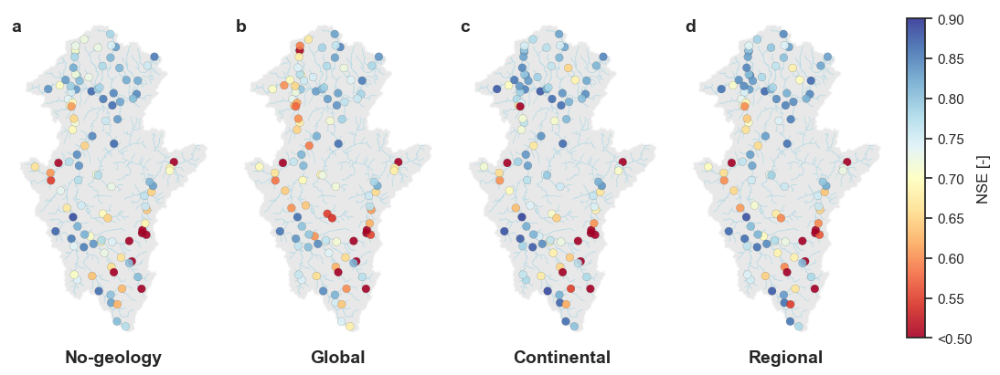

In [55]:
df = data_diff_val_complete.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]


import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines

# Set style
sns.set_theme(style="ticks")

# Improved colormap for NSE
cmap_nse = plt.cm.RdYlBu  # or try 'viridis', 'coolwarm'

# Create figure with 3 columns
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns to plot
nse_cols = ['nse_nogeo',   'nse_g1comp', 'nse_c1comp','nse_r1comp',]
titles = ['a', 'b', 'c', 'd']
main_titles = ['No-geology', 'Global', 'Continental', 'Regional']

# Set common color limits for NSE
vmin, vmax = 0.5, 0.9  # Adjust if you want to include negatives

for ax, col, title in zip(axes, nse_cols, titles):
    # Background maps
    moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

    # Plot all gauges the same way (circle)
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    #ax.set_title(title, loc="left", fontweight="bold")
    #ax.set_aspect('auto')
    #ax.grid(False)
    #sns.despine(ax=ax)
    #ax.set_title(title, loc="left", fontweight="bold")
    ax.text(0.01, 0.97, title, transform=ax.transAxes,
        fontsize=14, fontweight='bold', va='top', ha='left')

    #ax.set_aspect('auto')

    # Remove axis ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")

    # Remove spines and grid
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


## Add a global "subtitle" row across the top
#for ax, title in zip(axes, main_titles):
#    ax.set_title(title, fontsize=12, fontweight="bold", loc="center")
# Add main titles as x-labels below each subplot
for ax, label in zip(axes, main_titles):
    ax.set_xlabel(label, fontsize=14, fontweight='bold', labelpad=1)


# Shared axis labels
#fig.supxlabel("Longitude")
#fig.supylabel("Latitude")


# One colorbar for all subplots
#cbar = fig.colorbar(
#    sc,
#    ax=axes,
#    orientation='vertical',
#    fraction=0.025,
#    pad=0.02
#)

# Adjust layout to make space on the right
fig.subplots_adjust(right=0.85)  # Leave room for colorbar

# Create custom colorbar axis (position: [left, bottom, width, height])
cbar_ax = fig.add_axes([1, 0.15, 0.02, 0.7])  # tweak as needed
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
# Custom ticks and labels
ticks = np.linspace(0.5, 0.9, num=9)  # Adjust number of ticks if needed
tick_labels = [f"<0.50"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

#cbar.set_label('NSE [-]')

plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\maps.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.tight_layout()

plt.show()

In [54]:
df

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,bfi_g1comp,qmean_r1comp,qmean_c1comp,qmean_g1comp,slope_r1comp,slope_c1comp,slope_g1comp,hfd_r1comp,hfd_c1comp,hfd_g1comp
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,0.007999,0.193294,0.816050,0.808050,0.622756,NaN,NaN,NaN,0.515742,0.578789,...,0.724207,1.305067,1.309756,1.267093,3.722231,3.057829,1.711165,127.117647,133.058824,145.000000
BEWA0067,0.012304,0.139817,0.754879,0.742576,0.615063,NaN,NaN,NaN,0.446878,0.564938,...,0.682046,1.375297,1.377525,1.352922,3.699390,2.961299,1.791546,127.687500,134.687500,143.250000
BEWA0106,0.007547,0.359963,0.756900,0.749353,0.396936,NaN,NaN,NaN,0.496805,0.582017,...,0.773741,1.080791,1.086589,1.038626,4.197010,3.471930,1.483192,128.304348,133.826087,149.826087
BEWA0107,0.001647,0.220919,0.730829,0.729183,0.509910,NaN,NaN,NaN,0.565063,0.557327,...,0.752114,1.491404,1.493460,1.414969,3.514244,3.133093,1.421573,131.411765,136.823529,152.117647
BEWA0119,0.001614,0.195395,0.792291,0.790677,0.596897,NaN,NaN,NaN,0.508101,0.566760,...,0.710339,1.384466,1.389720,1.335452,3.673158,3.172561,1.613388,126.600000,131.666667,143.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,-0.006136,0.237127,0.795602,0.801739,0.558476,NaN,NaN,NaN,0.516853,0.580560,...,0.769904,0.932599,0.942872,0.920327,4.058907,3.081813,1.345111,125.846154,132.769231,148.615385
LU000016,-0.001741,0.008490,0.692547,0.694288,0.684057,NaN,NaN,NaN,0.564940,0.558774,...,0.521523,0.650320,0.664249,0.663159,2.316478,2.350339,2.815393,130.615385,130.692308,129.076923
LU000017,0.006710,0.035115,0.842363,0.835653,0.807248,NaN,NaN,NaN,0.572433,0.612745,...,0.655385,0.819222,0.830103,0.820517,3.016282,2.572236,1.884326,130.153846,134.384615,137.230769


C:\Users\nascimth\AppData\Local\Temp\ipykernel_37160\3804485175.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  estreams_attributes_clipped_filters.corr()["nse_r1comp"][100:]


lulc_2006_agriculture    0.247991
dam_num                  0.241615
res_num                  0.247381
lakes_num                0.197692
lakes_tot_area           0.191107
lakes_tot_vol            0.223855
sno_cov_mean             0.024919
irri_1990                0.202419
irri_2005                0.241519
stations_num_p_mean      0.247557
perm_high_regi          -0.308972
perm_medium_regi        -0.050387
perm_low_regi            0.250163
perm_high_glob2          0.001031
perm_medium_glob2        0.065520
perm_low_glob2          -0.119462
nse_r1comp               1.000000
Name: nse_r1comp, dtype: float64

In [71]:
estreams_attributes_clipped_filters.corr()["nse_r1comp"][20:40]

C:\Users\nascimth\AppData\Local\Temp\ipykernel_37160\3936799028.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  estreams_attributes_clipped_filters.corr()["nse_r1comp"][20:40]


q_mean                       0.009868
q_runoff_ratio               0.001149
q_elas_Sankarasubramanian    0.009788
slope_sawicz                 0.319951
baseflow_index              -0.411512
hfd_mean                    -0.523630
hfd_std                     -0.331442
q_5                         -0.360759
q_95                         0.137250
hq_freq                      0.153831
hq_dur                       0.191653
lq_freq                      0.225685
lq_dur                       0.138112
zero_q_freq                       NaN
p_mean                       0.014393
pet_mean                    -0.208654
aridity                     -0.078891
p_seasonality               -0.098624
frac_snow                    0.149691
hp_freq                     -0.247591
Name: nse_r1comp, dtype: float64

<Axes: >

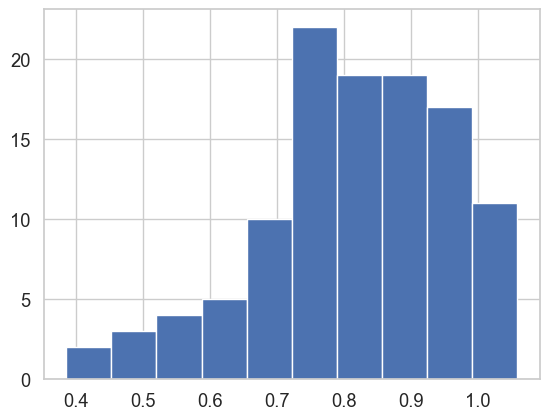

In [72]:
estreams_attributes_clipped_filters.aridity.hist()

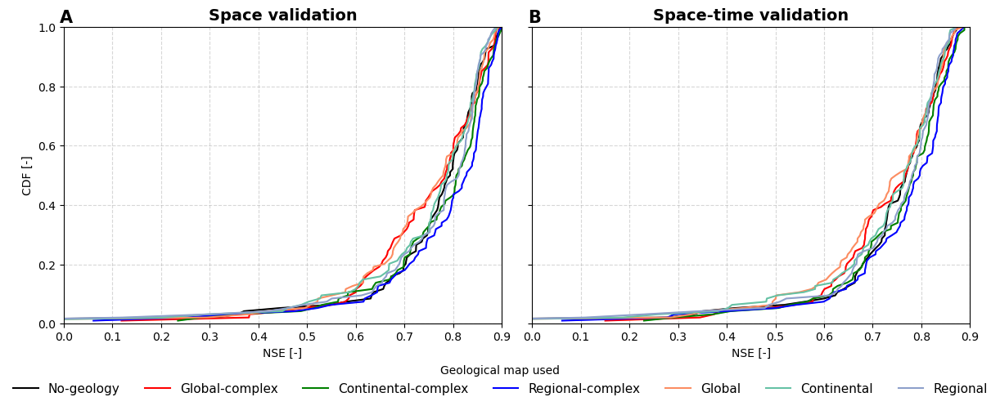

In [85]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Define colors for each model type
colors = {
    'nse_nogeo': 'k',   # Coral / Orange #E69F00 other option
    'nse_g1comp': 'red',   # Coral / Orange #E69F00 other option
    'nse_c1comp': 'green',  # Mint Green
    'nse_r1comp': 'blue',  # Lavender Blue
    'nse_g1': '#fc8d62',   # Coral / Orange #E69F00 other option
    'nse_c1': '#66c2a5',  # Mint Green
    'nse_r1': '#8da0cb',  # Lavender Blue
}

# Pretty names for legend
labels_pretty = {
    'nse_nogeo': 'No-geology',
    'nse_g1comp': 'Global-complex',
    'nse_c1comp': 'Continental-complex',
    'nse_r1comp': 'Regional-complex',
    'nse_g1': 'Global',
    'nse_c1': 'Continental',
    'nse_r1': 'Regional',
}

# Define dicts to loop through
dicts = {
    'Space validation': data_diff_cal_complete_dict,
    'Space-time validation': data_diff_val_complete_dict
    
}

# Create 1x2 subplot figure
fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
letters = ['A', 'B']

# Plot loop
for ax, (label, data_dict), subplot_letter in zip(axs, dicts.items(), letters):
    
    # --- Step 1: Plot all individual curves ---
    for group_num, df in data_dict.items():
        for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp', 'nse_g1', 'nse_c1', 'nse_r1']:
            if model_type in df.columns:
                nse_values = np.sort(df[model_type].dropna())
                if len(nse_values) == 0:
                    continue
                cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
                ax.plot(
                    nse_values, cumulative,
                    color=colors[model_type],
                    alpha=0.3,
                    linewidth=1
                )

    # --- Step 2: Compute and plot mean lines ---
    dfs = list(data_dict.values())
    all_data = pd.concat(dfs, axis=0)
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp', 'nse_g1', 'nse_c1', 'nse_r1']:
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=1.5,
            label=labels_pretty[model_type]
        )

    # Plot styling
    ax.set_xlabel("NSE [-]")
    ax.set_xlim(-0.0, 0.9)
    ax.set_ylim(0, 1.0)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_title(label, fontsize=14, weight='bold')

    # Subplot label (A. / B.)
    ax.text(-0.01, 1.06, f"{subplot_letter}", transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

# Shared y-axis label
axs[0].set_ylabel("CDF [-]")

# Only one legend for both plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Geological map used", loc='lower center', ncol=7, fontsize=11, frameon=False)

# Final layout
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\cdfs_7geologies.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

C:\Users\nascimth\AppData\Local\Temp\ipykernel_25956\223383735.py:130: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


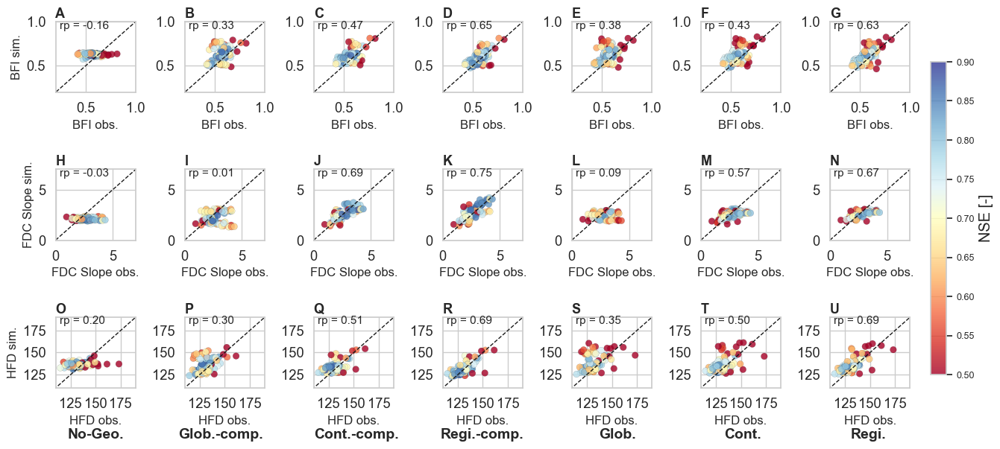

In [124]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'g1comp', 'c1comp', 'r1comp', 'g1', 'c1', 'r1']
scale_titles = ['No-Geo.', 'Glob.-comp.', 'Cont.-comp.', 'Regi.-comp.', 'Glob.', 'Cont.', 'Regi.']

# Colormap and normalization
cmap = plt.cm.RdYlBu
vmin, vmax = 0.5, 0.9
norm = Normalize(vmin=vmin, vmax=vmax)

# Create subplots
fig, axs = plt.subplots(3, 7, figsize=(14, 6), sharex=False, sharey=False)
letters = list(string.ascii_uppercase)

# For shared colorbar, store one scatter artist
scatter_for_colorbar = None

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Color values clipped to [0.5, 0.9]
        colors = data_diff_val_complete[var_nse].clip(lower=vmin, upper=vmax)

        # Scatterplot
        sc = ax.scatter(
            data_diff_val_complete[var_obs],
            data_diff_val_complete[var_pred],
            c=colors,
            cmap=cmap,
            norm=norm,
            s=40,
            edgecolor='k',
            linewidth=0.1,
            alpha=0.8
        )

        # Store one artist for colorbar
        if scatter_for_colorbar is None:
            scatter_for_colorbar = sc


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title} sim.", fontsize=12)
        else:
            ax.set_ylabel("")
        ax.set_xlabel(f"{row_title} obs.", fontsize=12)

        # Correlation
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        ax.text(
            0.05, 0.9, f"rp = {R:.2f}", transform=ax.transAxes,
            fontsize=11, bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot label
        subplot_idx = row * 7 + col
        ax.text(
            0.00, 1.2, f"{letters[subplot_idx]}", transform=ax.transAxes,
            fontsize=13, fontweight='bold', va='top', ha='left'
        )

        # Set axis limits per metric
        if metric == 'bfi':
            ax.set_xlim(0.2, 1)
            ax.set_ylim(0.2, 1)
        elif metric == 'slope':
            ax.set_xlim(0, 7)
            ax.set_ylim(0, 7)
        elif metric == 'hfd':
            ax.set_xlim(110, 190)
            ax.set_ylim(110, 190)

axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 3].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 4].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 5].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 6].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 1].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 2].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 3].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 4].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 5].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 6].plot([0, 7], [0, 7], 'k--', lw=1)

axs[2, 0].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 1].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 2].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 3].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 4].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 5].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 6].plot([100, 200], [100, 200], 'k--', lw=1)

# Add single vertical colorbar to the right
fig.subplots_adjust(right=0.88)  # Make room for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter_for_colorbar, cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.ax.tick_params(labelsize=9)

# Column titles (below x-axis)
col_positions = [0.1, 0.22, 0.35, 0.47, 0.6, 0.72, 0.84]

for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0, title, ha='center', va='bottom', fontsize=14, fontweight='bold')

# Final layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.12, right=0.88)

# Optional save
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\signatures_colorbar7geologies.png", dpi=300)

plt.show()

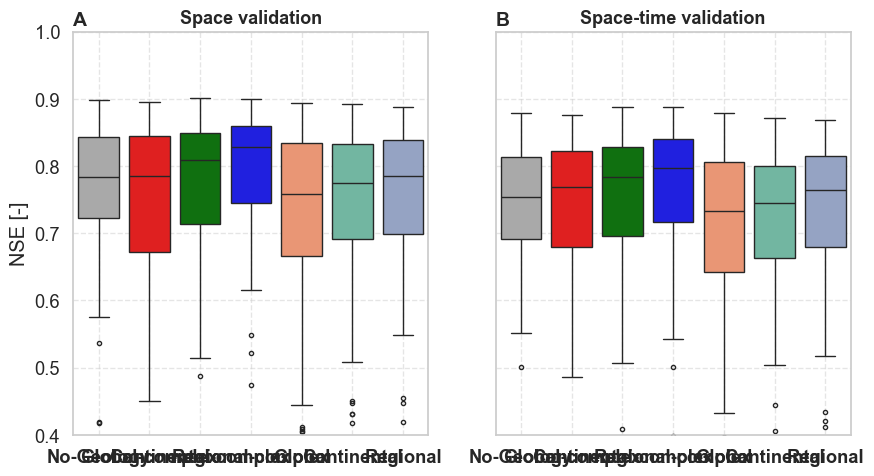

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define model colors
colors = {
    'Regional': '#8da0cb',
    'Continental': '#66c2a5',
    'Global': '#fc8d62',
    'No-Geology': 'darkgray',
    'Regional-complex': 'blue',
    'Continental-complex': 'green',
    'Global-complex': 'red',

}

# Map column names to pretty names
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global-complex',
    'nse_c1comp': 'Continental-complex',
    'nse_r1comp': 'Regional-complex',
    'nse_g1': 'Global',
    'nse_c1': 'Continental',
    'nse_r1': 'Regional',
}

# Data sources
dataframes = [data_diff_cal_complete, data_diff_val_complete]
titles = ['Space validation', 'Space-time validation']
letters = ['A', 'B']

# Prepare tidy DataFrames for Seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

# Combine all into one tidy DataFrame
df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot setup
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=True)

# Plot loop
for i, ax in enumerate(axs):
    val_type = titles[i]
    df_sub = df_all[df_all["Validation"] == val_type]

    sns.boxplot(
        data=df_sub,
        x="Model",
        y="NSE",
        hue="Model",           # Fix for future seaborn versions
        ax=ax,
        palette=colors,
        linewidth=1,
        fliersize=3,
        dodge=False            # Ensures boxes stay aligned without hue splitting
    )

    # Bold x-tick labels
    for tick in ax.get_xticklabels():
        tick.set_fontweight('bold')

    ax.set_title(val_type, fontsize=13, weight='bold')
    ax.set_xlabel("")
    #ax.set_ylim(-0.5, 1.0)
    ax.set_ylim(0.4, 1.0)

    ax.grid(True, linestyle='--', alpha=0.5)

    if i == 0:
        ax.set_ylabel("NSE [-]")
    else:
        ax.set_ylabel("")

    # Subplot label (A / B)
    ax.text(-0., 1.05, f"{letters[i]}", transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')
    
# Final layout
plt.tight_layout()
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\boxplots_7geologies.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()


C:\Users\nascimth\AppData\Local\Temp\ipykernel_25956\2861044322.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


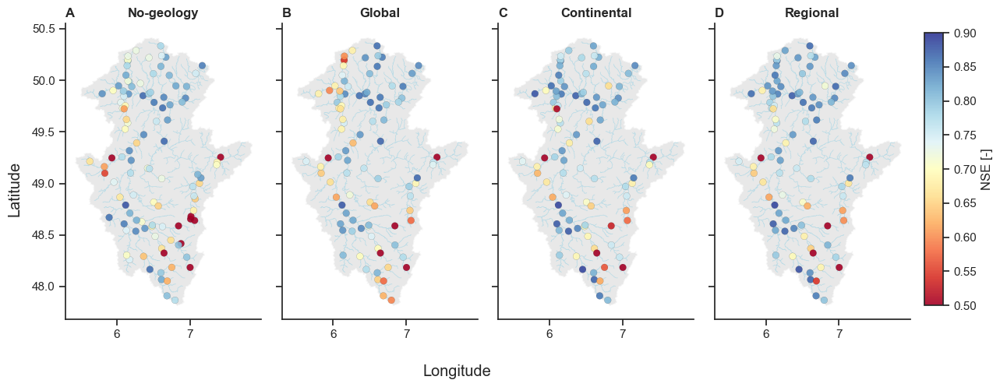

NameError: name 'estreams_attributes_clipped_filters' is not defined

## Geological classes

C:\Users\nascimth\AppData\Local\Temp\ipykernel_30196\4234871186.py:58: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
C:\Users\nascimth\AppData\Local\Temp\ipykernel_30196\4234871186.py:64: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True,
C:\Users\nascimth\AppData\Local\Temp\ipykernel_30196\4234871186.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True,
C:\Users\nascimth\AppData\Local\Temp\ipykernel_30196\4234871186.py:114: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True,


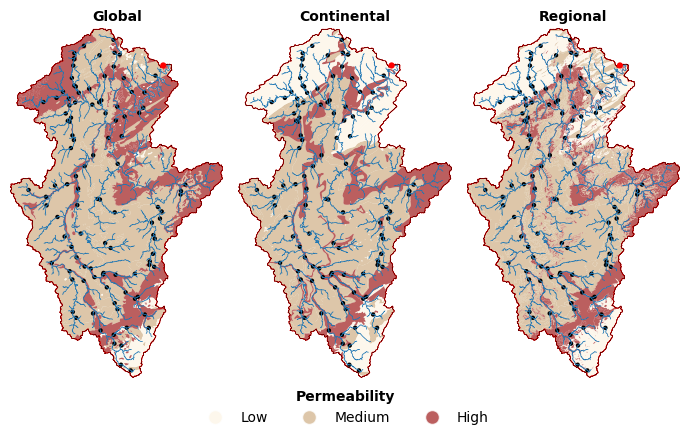

In [22]:
network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7, 4))  # Two subplots side by side

# Select multiple geometries
FR_selected_gdf = moselle.copy()

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)


# Plot the river
rivers_moselle.plot(ax=ax1, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax2, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax3, linewidth=0.5, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    ax.set_title(text_to_subplots[i], loc="center", fontsize=10, fontweight="bold")
    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')

# Adjust the layout to remove extra space
plt.tight_layout()

fig.savefig(r'..\results\figs\fig_permeability_moselle.png', dpi=300, bbox_inches='tight')

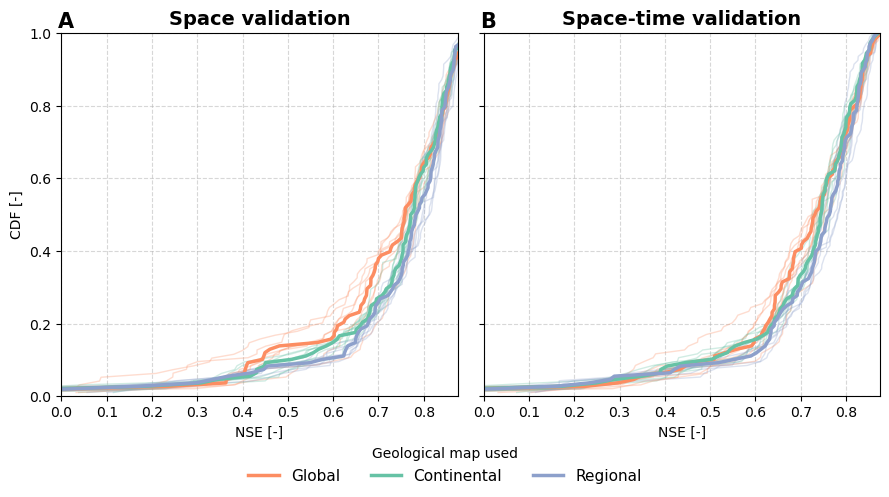

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Define colors for each model type
colors = {
    'nse_g1': '#fc8d62',   # Coral / Orange #E69F00 other option
    'nse_c1': '#66c2a5',  # Mint Green
    'nse_r1': '#8da0cb',  # Lavender Blue
}

# Pretty names for legend
labels_pretty = {
    'nse_g1': 'Global',
    'nse_c1': 'Continental',
    'nse_r1': 'Regional',
}

# Define dicts to loop through
dicts = {
    'Space validation': data_diff_cal_complete_dict,
    'Space-time validation': data_diff_val_complete_dict
    
}

# Create 1x2 subplot figure
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=True)
letters = ['A', 'B']

# Plot loop
for ax, (label, data_dict), subplot_letter in zip(axs, dicts.items(), letters):
    
    # --- Step 1: Plot all individual curves ---
    for group_num, df in data_dict.items():
        for model_type in ['nse_g1', 'nse_c1', 'nse_r1']:
            if model_type in df.columns:
                nse_values = np.sort(df[model_type].dropna())
                if len(nse_values) == 0:
                    continue
                cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
                ax.plot(
                    nse_values, cumulative,
                    color=colors[model_type],
                    alpha=0.3,
                    linewidth=1
                )

    # --- Step 2: Compute and plot mean lines ---
    dfs = list(data_dict.values())
    all_data = pd.concat(dfs, axis=0)
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_g1', 'nse_c1', 'nse_r1']:
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    # Plot styling
    ax.set_xlabel("NSE [-]")
    ax.set_xlim(-0.0, 0.875)
    ax.set_ylim(0, 1.0)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_title(label, fontsize=14, weight='bold')

    # Subplot label (A. / B.)
    ax.text(-0.01, 1.06, f"{subplot_letter}", transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

# Shared y-axis label
axs[0].set_ylabel("CDF [-]")

# Only one legend for both plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Geological map used", loc='lower center', ncol=3, fontsize=11, frameon=False)

# Final layout
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\cdfs.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

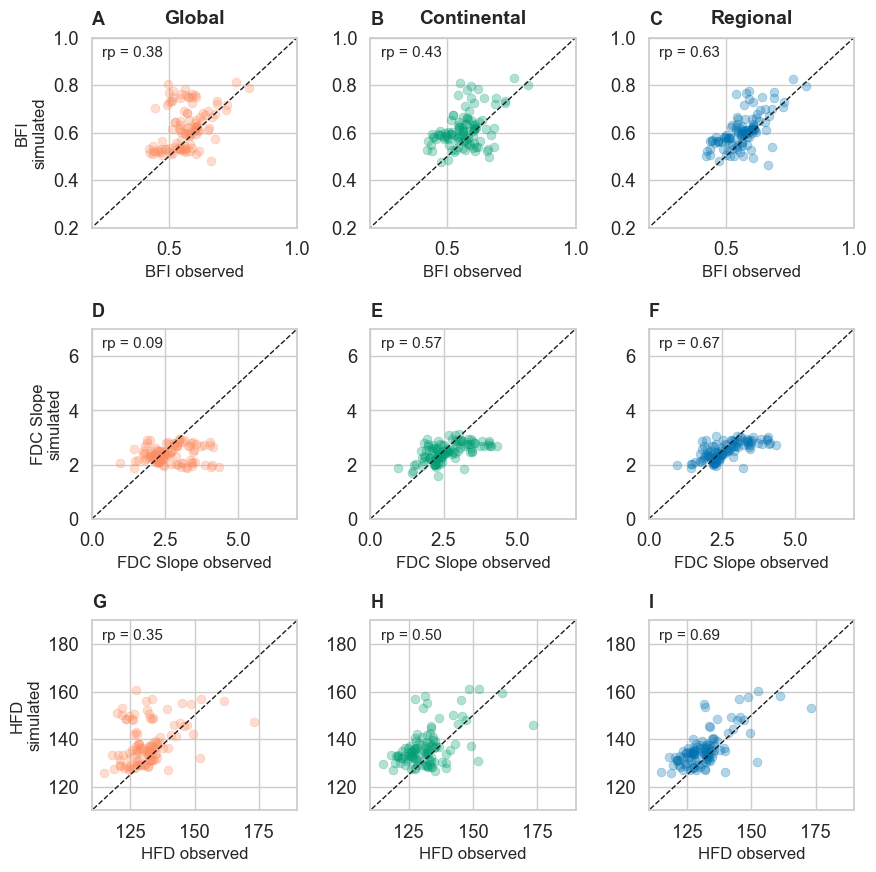

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['g1', 'c1', 'r1']
scale_titles = ['Global', 'Continental', 'Regional']

# Define column-based color (Global, Continental, Regional)
col_colors = ['#fc8d62', '#009E73', '#0072B2']  # Orange, Green, Blue

# Create subplots
fig, axs = plt.subplots(3, 3, figsize=(9, 9), sharex=False, sharey=False)
letters = list(string.ascii_uppercase)

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Scatterplot with seaborn aesthetics
        sns.scatterplot(
            x=data_diff_val_complete[var_obs],
            y=data_diff_val_complete[var_pred],
            ax=ax,
            color=col_colors[col],
            alpha=0.3,
            s=40,
            edgecolor=None
        )

        # 1:1 line
        xy_min = min(data_diff_val_complete[var_obs].min(), data_diff_val_complete[var_pred].min())
        xy_max = max(data_diff_val_complete[var_obs].max(), data_diff_val_complete[var_pred].max())

        # Titles and labels
        if row == 0:
            ax.set_title(scale_title, fontsize=14, pad=10, fontweight="bold")
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12)
        else:
            ax.set_ylabel("")

        ax.set_xlabel(f"{row_title} observed", fontsize=12)

        # Pearson correlation
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        ax.text(
            0.05, 0.9, f"rp = {R:.2f}", transform=ax.transAxes,
            fontsize=11, bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot letter (A, B, C, ...)
        subplot_idx = row * 3 + col
        ax.text(
            -0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
            fontsize=13, fontweight='bold', va='top', ha='left'
        )

        ax.set_xlim(xy_min, xy_max)
        ax.set_ylim(xy_min, xy_max)

axs[0, 0].set_xlim(0.2, 1)
axs[0, 0].set_ylim(0.2, 1)
axs[0, 1].set_xlim(0.2, 1)
axs[0, 1].set_ylim(0.2, 1)
axs[0, 2].set_xlim(0.2, 1)
axs[0, 2].set_ylim(0.2, 1)


axs[1, 0].set_xlim(0, 7)
axs[1, 0].set_ylim(0, 7)
axs[1, 1].set_xlim(0, 7)
axs[1, 1].set_ylim(0, 7)
axs[1, 2].set_xlim(0, 7)
axs[1, 2].set_ylim(0, 7)


axs[2, 0].set_xlim(110, 190)
axs[2, 0].set_ylim(110, 190)
axs[2, 1].set_xlim(110, 190)
axs[2, 1].set_ylim(110, 190)
axs[2, 2].set_xlim(110, 190)
axs[2, 2].set_ylim(110, 190)


axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 1].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 2].plot([0, 7], [0, 7], 'k--', lw=1)

axs[2, 0].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 1].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 2].plot([100, 200], [100, 200], 'k--', lw=1)

# Improve spacing
plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\signatures.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

C:\Users\nascimth\AppData\Local\Temp\ipykernel_27024\164301827.py:115: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.88, 1])  # leave room for colorbar


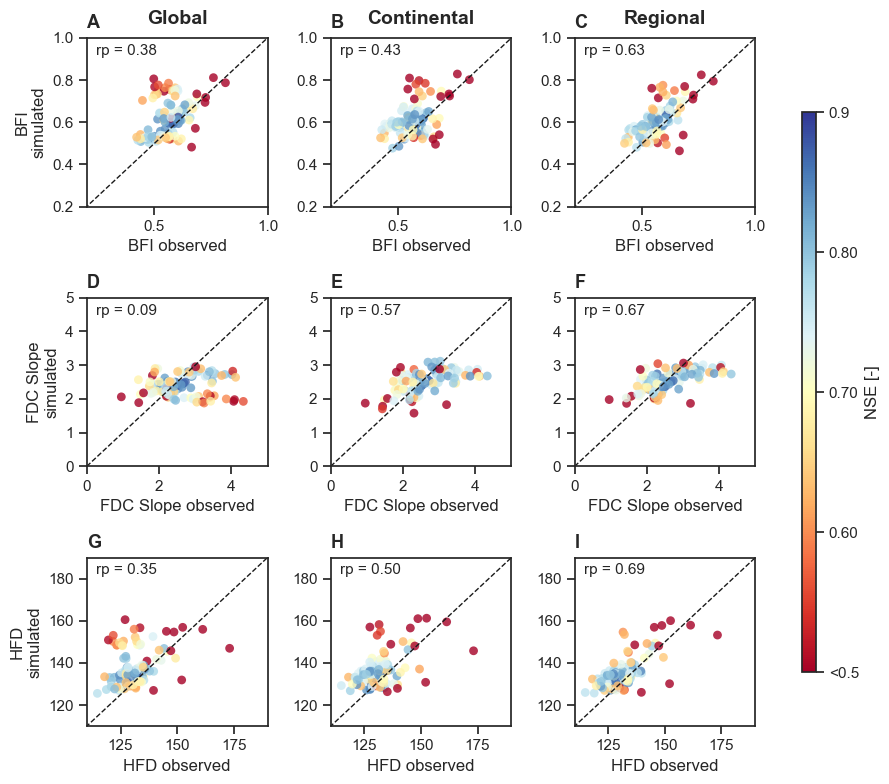

In [ ]:
from matplotlib.cm import ScalarMappable
import matplotlib.pyplot as plt

# Colormap
cmap = plt.cm.RdYlBu
vmin, vmax = 0.5, 0.9  # fixed NSE range for coloring

# Start figure
fig, axs = plt.subplots(3, 3, figsize=(9, 8), sharex=False, sharey=False)
letters = list(string.ascii_uppercase)

for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Get color values for this column's NSE
        colors = data_diff_val_complete[var_nse]

        # Scatter plot with colored points
        sc = ax.scatter(
            data_diff_val_complete[var_obs],
            data_diff_val_complete[var_pred],
            c=data_diff_val_complete[var_nse].clip(0.5, 0.9),
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            s=40,
            alpha=0.8,
            edgecolor='none',
            linewidth=0.2
        )



        # Titles and labels
        if row == 0:
            ax.set_title(scale_title, fontsize=14, pad=10, fontweight="bold")
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12)
        else:
            ax.set_ylabel("")
        ax.set_xlabel(f"{row_title} observed", fontsize=12)

        # Correlation text
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        ax.text(0.05, 0.9, f"rp = {R:.2f}", transform=ax.transAxes,
                fontsize=11, bbox=dict(facecolor='none', alpha=0.6, edgecolor='none'))

        # Subplot letter
        subplot_idx = row * 3 + col
        ax.text(-0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
                fontsize=13, fontweight='bold', va='top', ha='left')

        ax.set_xlim(xy_min, xy_max)
        ax.set_ylim(xy_min, xy_max)

# Add a single colorbar
fig.subplots_adjust(right=0.88)  # make space


ticks = np.linspace(0.5, 0.9, num=5)  # Adjust number of ticks if needed
tick_labels = [f"<0.5"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.9"]


cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin, vmax)), cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)


# Add 1:1 line
axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 1].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 2].plot([0, 7], [0, 7], 'k--', lw=1)

axs[2, 0].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 1].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 2].plot([100, 200], [100, 200], 'k--', lw=1)

axs[0, 0].set_xlim(0.2, 1)
axs[0, 0].set_ylim(0.2, 1)
axs[0, 1].set_xlim(0.2, 1)
axs[0, 1].set_ylim(0.2, 1)
axs[0, 2].set_xlim(0.2, 1)
axs[0, 2].set_ylim(0.2, 1)


axs[1, 0].set_xlim(0, 5)
axs[1, 0].set_ylim(0, 5)
axs[1, 1].set_xlim(0, 5)
axs[1, 1].set_ylim(0, 5)
axs[1, 2].set_xlim(0, 5)
axs[1, 2].set_ylim(0, 5)


axs[2, 0].set_xlim(110, 190)
axs[2, 0].set_ylim(110, 190)
axs[2, 1].set_xlim(110, 190)
axs[2, 1].set_ylim(110, 190)
axs[2, 2].set_xlim(110, 190)
axs[2, 2].set_ylim(110, 190)

# Tight layout and save
plt.tight_layout(rect=[0, 0, 0.88, 1])  # leave room for colorbar
plt.show()

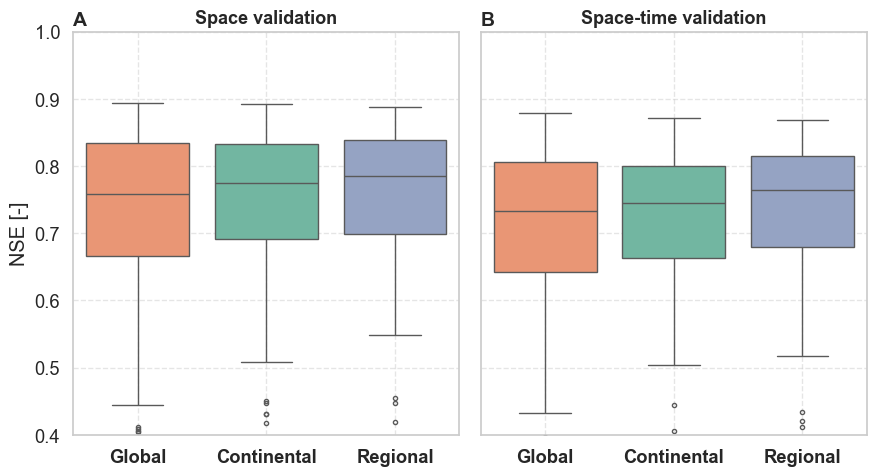

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define model colors
colors = {
    'Regional': '#8da0cb',
    'Continental': '#66c2a5',
    'Global': '#fc8d62'
}

# Map column names to pretty names
column_label_map = {
    'nse_g1': 'Global',
    'nse_c1': 'Continental',
    'nse_r1': 'Regional'

}

# Data sources
dataframes = [data_diff_cal_complete, data_diff_val_complete]
titles = ['Space validation', 'Space-time validation']
letters = ['A', 'B']

# Prepare tidy DataFrames for Seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

# Combine all into one tidy DataFrame
df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot setup
fig, axs = plt.subplots(1, 2, figsize=(9, 5), sharey=True)

# Plot loop
for i, ax in enumerate(axs):
    val_type = titles[i]
    df_sub = df_all[df_all["Validation"] == val_type]

    sns.boxplot(
        data=df_sub,
        x="Model",
        y="NSE",
        hue="Model",           # Fix for future seaborn versions
        ax=ax,
        palette=colors,
        linewidth=1,
        fliersize=3,
        dodge=False            # Ensures boxes stay aligned without hue splitting
    )

    # Bold x-tick labels
    for tick in ax.get_xticklabels():
        tick.set_fontweight('bold')

    ax.set_title(val_type, fontsize=13, weight='bold')
    ax.set_xlabel("")
    #ax.set_ylim(-0.5, 1.0)
    ax.set_ylim(0.4, 1.0)

    ax.grid(True, linestyle='--', alpha=0.5)

    if i == 0:
        ax.set_ylabel("NSE [-]")
    else:
        ax.set_ylabel("")

    # Subplot label (A / B)
    ax.text(-0., 1.05, f"{letters[i]}", transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left')
    

    


# Final layout
plt.tight_layout()
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\boxplots.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()


In [41]:
df = data_diff_val_complete.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

C:\Users\nascimth\AppData\Local\Temp\ipykernel_27024\4109225421.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


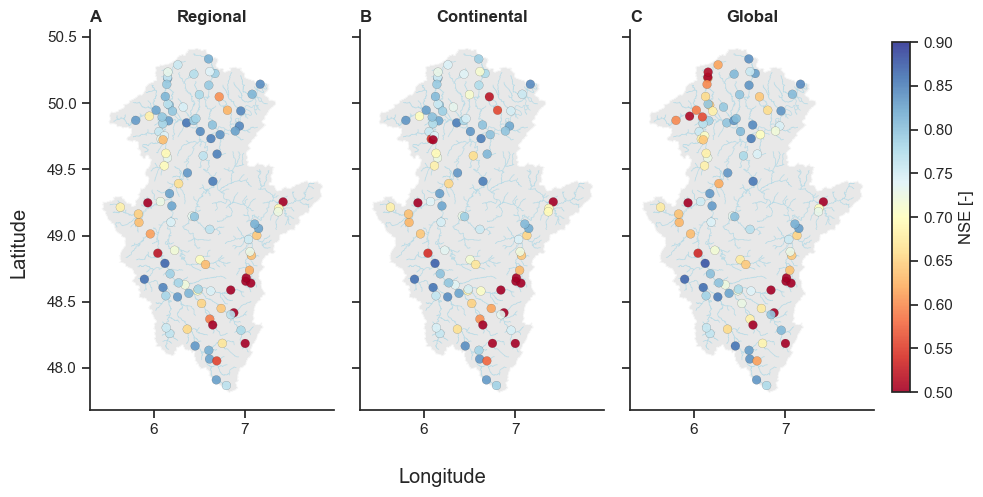

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines

# Set style
sns.set_theme(style="ticks")

# Improved colormap for NSE
cmap_nse = plt.cm.RdYlBu  # or try 'viridis', 'coolwarm'

# Create figure with 3 columns
fig, axes = plt.subplots(1, 3, figsize=(9, 5), sharex=True, sharey=True)

# NSE columns to plot
nse_cols = ['nse_r1', 'nse_c1', 'nse_g1']
titles = ['A', 'B', 'C']
main_titles = ['Regional', 'Continental', 'Global']

# Set common color limits for NSE
vmin, vmax = 0.5, 0.9  # Adjust if you want to include negatives

for ax, col, title in zip(axes, nse_cols, titles):
    # Background maps
    moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

    # Plot all gauges the same way (circle)
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    ax.set_title(title, loc="left", fontweight="bold")
    ax.set_aspect('auto')
    ax.grid(False)
    sns.despine(ax=ax)

# Add a global "subtitle" row across the top
for ax, title in zip(axes, main_titles):
    ax.set_title(title, fontsize=12, fontweight="bold", loc="center")

# Shared axis labels
fig.supxlabel("Longitude")
fig.supylabel("Latitude")


# One colorbar for all subplots
#cbar = fig.colorbar(
#    sc,
#    ax=axes,
#    orientation='vertical',
#    fraction=0.025,
#    pad=0.02
#)

# Adjust layout to make space on the right
fig.subplots_adjust(right=0.85)  # Leave room for colorbar

# Create custom colorbar axis (position: [left, bottom, width, height])
cbar_ax = fig.add_axes([1, 0.2, 0.02, 0.7])  # tweak as needed
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')

#cbar.set_label('NSE [-]')

plt.tight_layout()
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\maps.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

In [83]:
data_diff_cal_complete

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,-0.004011,0.238105,0.840477,0.844488,0.602372,NaN,NaN,NaN,0.515742,0.573996,...,1.354794,1.347175,3.400558,2.868116,2.865808,1.785606,126.294118,132.088235,133.019608,153.411765
BEWA0067,-0.006290,0.160183,0.786864,0.793153,0.626681,NaN,NaN,NaN,0.446878,0.561839,...,1.454498,1.441517,3.527884,2.893638,2.880805,1.936803,123.437500,131.427083,132.531250,148.312500
BEWA0106,0.000643,0.397206,0.779976,0.779333,0.382770,NaN,NaN,NaN,0.496805,0.576025,...,1.073445,1.057375,4.063631,3.077113,2.945425,1.809467,127.000000,133.333333,134.253623,163.630435
BEWA0107,-0.004043,0.253120,0.734429,0.738472,0.481308,NaN,NaN,NaN,0.565063,0.553150,...,1.495473,1.474725,3.418299,2.848702,2.872728,1.849373,133.588235,135.421569,136.127451,160.862745
BEWA0119,-0.005639,0.206364,0.815959,0.821598,0.609595,NaN,NaN,NaN,0.508101,0.564817,...,1.390009,1.375960,3.336434,2.898094,2.878937,1.897892,123.266667,130.922222,131.766667,151.033333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,0.005622,0.423077,0.831265,0.825644,0.408188,NaN,NaN,NaN,0.516853,0.569515,...,1.060348,1.054085,4.331634,3.046407,2.985053,1.851511,121.769231,129.142857,129.549451,162.010989
LU000016,-0.007572,0.043316,0.726632,0.734204,0.683316,NaN,NaN,NaN,0.564940,0.529946,...,0.749355,0.746989,2.005883,2.639049,2.559169,2.976492,133.615385,131.395604,132.670330,128.582418
LU000017,0.001392,0.042253,0.868751,0.867359,0.826498,NaN,NaN,NaN,0.572433,0.599407,...,0.937097,0.929370,2.459555,2.566640,2.502652,1.944899,127.307692,132.956044,134.230769,143.604396


In [89]:
from matplotlib.lines import Line2D
import matplotlib as mpl
import math
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=Warning)

def add_circular_legend(ax, color_mapping, legend_labels, legend_title):
    """
    Add a circular legend to the specified axes.

    Parameters:
        ax (matplotlib.axes.Axes): The axes to which the legend will be added.
        color_mapping (dict): A dictionary mapping legend labels to colors.
        legend_labels (list): List of legend labels.
        legend_title (str): Title for the legend.

    Returns:
        None
    """
    handles = [Line2D([0], [0], marker='o', color='none', markerfacecolor=color_mapping[key], markeredgecolor='none', markersize=7) for key in color_mapping]
    legend = ax.legend(handles, legend_labels, loc='upper left', bbox_to_anchor=(1, 1), title=legend_title)
    legend.get_frame().set_linewidth(0)  # Remove legend frame
    legend.get_frame().set_facecolor('none')  # Remove legend background
    legend.set_bbox_to_anchor((-0.05, 0.8))  # Adjust legend position


def plot_num_measurementsmap_subplot(ax, plotsome: pd.DataFrame, xcoords="lon", ycoords="lat", column_labels="num_yearly_complete",
                                     crsproj='epsg:4326', showcodes=False, markersize_map=3, north_arrow=True, 
                                     set_map_limits=False, minx=0, miny=0, maxx=1, maxy=1, color_categories=None, color_mapping=None,
                                     legend_title=None, legend_labels=None, legend_loc='upper left', show_legend = True, 
                                     legend_outside=True, legend_bbox_to_anchor=(0.5, 1)):  # Add legend_outside and legend_bbox_to_anchor parameters:
    """
    Plot data on a subplot with additional options.

    Parameters:
        ax (matplotlib.axes.Axes): The subplot where the data will be plotted.
        plotsome (pd.DataFrame): The data to be plotted.
        xcoords (str): The name of the column containing x-coordinates.
        ycoords (str): The name of the column containing y-coordinates.
        column_labels (str): The name of the column containing data for coloring.
        crsproj (str): The coordinate reference system (CRS) for the data.
        showcodes (bool): Whether to show data labels.
        markersize_map (int): Size of the markers.
        north_arrow (bool): Whether to include a north arrow.
        set_map_limits (bool): Whether to set specific map limits.
        minx (float): Minimum x-axis limit.
        miny (float): Minimum y-axis limit.
        maxx (float): Maximum x-axis limit.
        maxy (float): Maximum y-axis limit.
        color_categories (list): List of color categories for data bins.
        color_mapping (dict): Mapping of color categories to colors.
        legend_title (str): Title for the legend.
        legend_labels (list): Labels for the legend items.
        legend_loc (str): Location of the legend.
        show_legend (bool): Whether to display the legend.
        legend_outside (bool): Whether to place the legend outside the plot.
        legend_bbox_to_anchor (tuple): Position of the legend (x, y).

    Returns:
        None
    """
    # Prepare the data for plotting
    crs = {'init': crsproj}
    geometry = plotsome.apply(lambda row: Point(row[xcoords], row[ycoords]), axis=1)
    geodata = gpd.GeoDataFrame(plotsome, crs=crs, geometry=geometry)
    geodatacond = geodata

    if color_categories is not None and color_mapping is not None:
        geodatacond['color_category'] = pd.cut(geodatacond[column_labels], bins=[c[0] for c in color_categories] + [np.inf], labels=[f'{c[0]}-{c[1]}' for c in color_categories])
    else:
        raise ValueError("Both color_categories and color_mapping must be provided.")

    # Plotting and legend:
    for category, group in geodatacond.groupby('color_category'):
        #group.plot(ax=ax, color=color_mapping[category], markersize=markersize_map, legend=False, label=category)
        group.plot(ax=ax, marker='o', color=color_mapping[category], markersize=markersize_map, legend=False, label=category, edgecolor='none')
    
    if showcodes == True:
        geodatacond["Code"] = geodatacond.index
        geodatacond.plot(column='Code', ax=ax)
        for x, y, label in zip(geodatacond.geometry.x, geodatacond.geometry.y, geodatacond.index):
            ax.annotate(label, xy=(x, y), xytext=(1, 1), textcoords="offset points")
        plt.rcParams.update({'font.size': 12})

    if set_map_limits == False:
        total_bounds = geodatacond.total_bounds
        minx, miny, maxx, maxy = total_bounds
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)

    # Plot the legend
    if legend_labels is None:
        legend_labels = [f'{c[0]}-{c[1]}' for c in color_categories]
        
    if show_legend:
        if legend_outside:
            legend = ax.legend(title=legend_title, labels=legend_labels, loc='upper left', bbox_to_anchor=legend_bbox_to_anchor,
                               bbox_transform=ax.transAxes, frameon=False)  # Use bbox_transform to position the legend
        else:
            legend = ax.legend(title=legend_title, labels=legend_labels, loc=legend_loc, frameon=False)
            
        if legend_outside:
            ax.add_artist(legend)
            
    # Plot the north arrow:
    if north_arrow == True:
        x, y, arrow_length = 0.975, 0.125, 0.1

        ax.annotate('N', xy=(x, y), xytext=(x, y - arrow_length),
                    arrowprops=dict(facecolor='black', width=5, headwidth=15),
                    ha='center', va='center', fontsize=18,
                    xycoords='axes fraction')
  
    # Set font family and size using rcParams
    mpl.rcParams['font.family'] = 'Arial'
    mpl.rcParams['font.size'] = 8  # You can adjust this value as needed

def generate_legend_and_color_mapping(variable_name, color_categories, xmin_hist, xmax_hist, base_hist, hist_bins, color_palette='default'):
    """
    Generate legend labels and color mapping based on the provided color categories.

    Parameters:
        variable_name (str): Name of the variable.
        color_categories (list): List of tuples defining color categories.
        xmin_hist (float): Minimum value for histogram.
        xmax_hist (float): Maximum value for histogram.
        base_hist (float): Base value for histogram.
        hist_bins (int): Number of bins for histogram.
        color_palette (str): Name of the color palette to use. Options: 'default', 'custom', 'vegetation', 'grassland', 'blues'.

    Returns:
        tuple: Tuple containing variable name, color categories, legend labels, color mapping, histogram parameters.
    """
    # Adjusting the first and last legend labels
    legend_labels = [f"<{color_categories[0][1]}"]
    for i in range(len(color_categories) - 1):
        legend_labels.append(f"{color_categories[i][1]}-{color_categories[i+1][1]}")
    legend_labels[-1] = f">{color_categories[-1][0]}"  # Correcting the last legend label

    color_mapping = {}
    if color_palette == 'default':
        color_mapping = {
            f"{category[0]}-{category[1]}": ['#a6cee3', '#1f78b4', '#6a3d9a', '#b2df8a', '#33a02c'][i] for i, category in enumerate(color_categories)
        }
    elif color_palette == 'custom':
        # Define your custom color palette here
        color_mapping = {
            f"{category[0]}-{category[1]}": ['bisque', '#fdcc8a', '#fc8d59', '#d7301f', '#990000'][i] for i, category in enumerate(color_categories)
             #color_mapping[f"{category[0]}-{category[1]}"] = ['#ffbb78', '#ff7f0e', '#aec7e8', '#1f77b4', '#9467bd'][i] # This is from orange to purple

        }

    elif color_palette == 'vegetation':
        # Define your custom color palette here
        color_mapping = {
            f"{category[0]}-{category[1]}": ['#B2DF8A', '#66C2A5', '#238B45', '#006D2C', '#00441B'][i] for i, category in enumerate(color_categories)
        }

    elif color_palette == 'grassland':
        # Define your custom color palette here
        color_mapping = {
            f"{category[0]}-{category[1]}": ['#FFD699', '#FF9900', '#FF6600', '#FF3300', '#FF0000'][i] for i, category in enumerate(color_categories)
        }

    elif color_palette == 'blues':
        # Define your custom color palette here
        color_mapping = {
            f"{category[0]}-{category[1]}": ['#FFD699', '#b2df8a', '#a6cee3', '#1f78b4', '#6a3d9a'][i] for i, category in enumerate(color_categories)
        }

    else:
        raise ValueError("Invalid color_palette. Choose 'default' or 'custom'.")

    return variable_name, color_categories, legend_labels, color_mapping, xmin_hist, xmax_hist, base_hist, hist_bins

def plot_variable_subplot(ax, variable, estreams_attributes, color_mapping_list, gdf):
    """
    Plot a variable on a subplot along with its legend and histogram.

    Parameters:
        ax (matplotlib Axes): Subplot axes.
        variable (str): Name of the variable.
        estreams_attributes (DataFrame): DataFrame containing attribute data.
        color_mapping_list (dict): Dictionary containing color mapping information.
        gdf (GeoDataFrame): GeoDataFrame for plotting shapefile.

    Returns:
        None
    """
    # Extract color mapping information from the color mapping list
    legend_title = color_mapping_list[variable][0]
    color_categories = color_mapping_list[variable][1]
    legend_labels = color_mapping_list[variable][2]
    color_mapping = color_mapping_list[variable][3]
    xmin_hist = color_mapping_list[variable][4]
    xmax_hist = color_mapping_list[variable][5]
    base_hist = color_mapping_list[variable][6]
    hist_bins = color_mapping_list[variable][7]

    # Set the background color to white
    ax.set_facecolor('white')

    # Plot the shapefile with white facecolor and black boundaries
    gdf.plot(ax=ax, facecolor='whitesmoke', edgecolor='black', linewidth=0.2)
    ax.set_xlim(-24, 40) 
    ax.set_ylim(35, 70)  

    # Plot the data on the map
    plot_num_measurementsmap_subplot(plotsome=estreams_attributes, xcoords="lon", ycoords="lat", column_labels=variable,
                                     color_categories=color_categories, color_mapping=color_mapping, 
                                     legend_title=legend_title, legend_labels=legend_labels, legend_loc='lower left', ax=ax, 
                                     set_map_limits=True, minx=-24, miny=35, maxx=40, maxy=70, show_legend=False, 
                                     legend_outside=False, north_arrow=False, markersize_map=1)

    # Turn off both x-axis and y-axis
    ax.set_axis_off()

    # Create a histogram inset axis within the subplot
    hist_ax = ax.inset_axes([0.05, 0.05, 0.15, 0.175])  # Adjust the values as needed

    # Extract the data for the histogram
    hist_data = estreams_attributes[variable].dropna()

    # Plot the histogram within the inset axis
    hist_ax.hist(hist_data, bins=hist_bins, color='white', edgecolor='black', alpha=0.7, linewidth=0.5)
    
    # Hide the axis spines and ticks for the inset axis
    hist_ax.spines['top'].set_visible(False)
    hist_ax.spines['right'].set_visible(False)
    hist_ax.spines['left'].set_visible(False)
    hist_ax.spines['bottom'].set_visible(True)
    hist_ax.set_facecolor('none')
    hist_ax.set_yticklabels(hist_ax.get_yticks(), rotation=90, fontsize=8)

    # Remove y-axis ticks and labels
    hist_ax.set_yticks([])
    hist_ax.set_yticklabels([])

    # Call the function to add a circular legend
    add_circular_legend(ax, color_mapping, legend_labels, legend_title)

    # Adjust aspect ratio
    ax.set_aspect('equal')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

# Function to create histograms inside subplots
def add_hist(axes, data: pd.DataFrame, axes_loc=[0.05, 0.05, 0.15, 0.175], alpha_hist=0.7,
             num_bins=10, x_ticks=[0, 5], base_xaxis=1, xlim_i=0, xlim_f=5):
    """
    Add a histogram to a subplot.

    Parameters:
        data (pandas.Series): Data for the histogram.
        axes (matplotlib.axes.Axes): The subplot where the histogram will be added.
        axes_loc (list): Location and size of the inset axis.
        alpha_hist (float): Alpha value for histogram transparency.
        num_bins (int): Number of histogram bins.
        x_ticks (list): Specific x-axis tick values.
        base_xaxis (int): Minor locator base for x-axis ticks.
        xlim_i (float): Minimum x-axis limit.
        xlim_f (float): Maximum x-axis limit.

    Returns:
        None
    """
    # Create a histogram inset axis within the subplot
    hist_ax = axes.inset_axes(axes_loc)  # Adjust the values as needed
    # Extract the data for the histogram (replace 'column_name' with the actual column you want to plot)
    hist_data = data.dropna()

    # Plot the histogram within the inset axis
    hist_ax.hist(hist_data, bins=num_bins, color='gray', alpha=alpha_hist)
    hist_ax.set_xlabel('')  # Replace with an appropriate label
    hist_ax.set_ylabel('')  # Replace with an appropriate label

    # Hide the axis spines and ticks for the inset axis
    hist_ax.spines['top'].set_visible(False)
    hist_ax.spines['right'].set_visible(False)
    hist_ax.spines['left'].set_visible(False)
    hist_ax.spines['bottom'].set_visible(True)
    hist_ax.set_facecolor('none')
    hist_ax.set_yticklabels(hist_ax.get_yticks(), rotation=90, fontsize=5)

    # Adjust y-tick label alignment for the right y-axis
    hist_ax.yaxis.tick_right()  # Move the y-tick labels to the right side
    hist_ax.yaxis.set_label_position("right")  # Move the y-axis label to the right side

    # Define the specific y-axis tick values you want to show
    hist_ax.set_xticks(x_ticks)

    # Remove y-axis ticks and labels
    hist_ax.set_yticks([])
    hist_ax.set_yticklabels([])

    hist_ax.xaxis.set_minor_locator(plt.MultipleLocator(base=base_xaxis))  # Adjust the base as needed
    # Set x-axis limits (adjust the values as needed)
    hist_ax.set_xlim(xlim_i, xlim_f)


# Histograms for different catchments groups:
def plot_histograms_by_group(df, col_to_classify, num_cols=3):
    """
    Plot histograms for each class within each variable in the DataFrame.
    
    Parameters:
        df (pd.DataFrame): DataFrame containing the data.
        col_to_classify (str): Name of the column containing the classes.
        num_cols (int): Number of columns in each row of subplots. Default is 3.
    """
    # Get unique classes
    classes = df[col_to_classify].unique()
    classes = classes.astype(int)
    num_classes = len(classes)
    
    # Determine number of rows and columns for subplots
    num_rows = (df.shape[1] - 1) // num_cols + 1

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*3))

    # Flatten the axes array
    axes = axes.flatten()

    # Plot histograms for each variable
    for i, (col, ax) in enumerate(zip(df.columns, axes)):
        if col != col_to_classify:
            for cls in classes:
                ax.hist(df[df[col_to_classify].astype(int) == cls][col], bins=10, alpha=0.5, label=cls)
            ax.set_title(col)
            ax.legend()

    # Adjust layout
    plt.tight_layout()
    plt.show()

def plot_histograms_by_group_two_subsets(df, df2, col_to_classify, num_cols=3):
    """
    Plot histograms for each class within each variable in the DataFrame using only two different subsets.
    
    Parameters:
        df (pd.DataFrame): DataFrame containing the data.
        col_to_classify (str): Name of the column containing the classes.
        num_cols (int): Number of columns in each row of subplots. Default is 3.
    """
    # Get unique classes
    classes = df[col_to_classify].unique()
    classes = classes.astype(int)
    num_classes = len(classes)
    
    # Determine number of rows and columns for subplots
    num_rows = (df.shape[1] - 1) // num_cols + 1

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*3))

    # Flatten the axes array
    axes = axes.flatten()

    # Plot histograms for each variable
    for i, (col, ax) in enumerate(zip(df.columns, axes)):
        if col != col_to_classify:
            for cls in classes:
                ax.hist(df[df[col_to_classify].astype(int) == cls][col], bins=10, alpha=0.5, label=cls, density=True)
                ax.hist(df2[df2[col_to_classify].astype(int) == cls][col], bins=10, alpha=0.5, label=cls, density=True)
            ax.set_title(col)
            ax.legend()

    # Adjust layout
    plt.tight_layout()
    plt.show()

import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

def plot_watershed_groups_from_dict(estreams_attributes_used, title_plot="Plot title", figsize=(8, 6), ax=None, 
                                    add_legend=False, size_symbol=2, limits_europe=True):
    """
    Plot watershed groups on a map using GeoPandas.

    Parameters:
        estreams_attributes_used (dict): A dictionary containing watershed groups dataframes.
        title_plot (str): Title of the plot.
        figsize (tuple): Figure size in inches (width, height).
        ax (matplotlib.axes.Axes, optional): Axes object to plot on. If None, a new figure and axes will be created.
        add_legend (bool): Whether to add a legend to the plot.
        size_symbol (int): Size of the symbols in the plot.
        limits_europe (bool): Whether to set the plot limits to Europe.

    Returns:
        None
    """
    
    # Load the world shapefile dataset provided by GeoPandas
    gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    # Set font properties using rcParams
    mpl.rcParams['font.family'] = 'arial'  # Change the font family
    mpl.rcParams['font.size'] = 8            # Change the font size
    mpl.rcParams['font.weight'] = 'normal'   # Change font weight
    mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)

    # Clear the subplot
    ax.clear()

    # Set the background color to white
    ax.set_facecolor('white')

    # Plot the shapefile with white facecolor and black boundaries
    gdf.plot(ax=ax, facecolor='whitesmoke', edgecolor='black', linewidth=0.1)

    # Calculate the bounds of the data if limits_europe is False
    if not limits_europe:
        all_lons = []
        all_lats = []
        for data in estreams_attributes_used.values():
            all_lons.extend(data['lon'])
            all_lats.extend(data['lat'])
        
        if all_lons and all_lats:
            min_lon, max_lon = min(all_lons), max(all_lons)
            min_lat, max_lat = min(all_lats), max(all_lats)
            margin = 0.05  # Add some margin to the bounds
            ax.set_xlim(min_lon - margin, max_lon + margin)
            ax.set_ylim(min_lat - margin, max_lat + margin)

    else:
        ax.set_xlim(-24, 45)
        ax.set_ylim(35, 70)

    # Define markers for each watershed group
    markers = ['o', 's', '^', 'D', '*']  # You can extend this list if needed

    # Plot the gauges for each desired watershed group
    colors = plt.cm.tab10(np.linspace(0, 1, len(estreams_attributes_used.keys())))  # Get distinct colors
    i = 0
    for catchment, data in estreams_attributes_used.items():
        marker = markers[i % len(markers)]  # Choose marker cyclically
        color = colors[i]  # Choose color from the colormap
        ax.scatter(data['lon'], data['lat'], color=color, edgecolor='black',
                    linewidth=0.01, marker=marker, s=size_symbol, label=catchment)
        i += 1

    ax.set_aspect('equal')  # Adjust aspect ratio as needed
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_axis_off()  # Turn off both x-axis and y-axis

    # Set title for the plot
    ax.set_title(title_plot)
    # Add legend (if needed)
    if add_legend:
        ax.legend()

    # Adjust layout
    plt.tight_layout()

In [101]:
color_categories_range_df = estreams_attributes.loc[data_diff_cal_complete.index].copy()

# Defining the colour categories and mapping lists
color_categories_q_mean = [(color_categories_range_df.q_mean.min(), 0.5), (0.5, 1.0), (1.0, 1.5), (1.5, 2.0), (2.0, np.inf)]
color_categories_q_runoff_ratio = [(color_categories_range_df.q_runoff_ratio.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_q_elas_Sankarasubramanian = [(0.5, 1.0), (1.0, 1.5), (1.5, 2.0), (2.0, 2.5), (2.5, np.inf)]
color_categories_slope_sawicz = [(-np.inf, 1.5), (1.5, 2.0), (2.0, 2.5), (2.5, 3.0), (3.0, np.inf)]
color_categories_baseflow_index = [(0.4, 0.5), (0.5, 0.6), (0.6, 0.7), (0.7, 0.8), (0.8, np.inf)]
color_categories_hfd_mean = [(color_categories_range_df.hfd_mean.min(), 130), (130, 140), (140, 150), (150, 160), (160, np.inf)]
color_categories_q_5 = [(color_categories_range_df.q_5.min(), 0.2), (0.2, 0.3), (0.3, 0.4), (0.4, 0.5), (0.5, np.inf)]
color_categories_q_95 = [(color_categories_range_df.q_95.min(), 2.0), (2.0, 4.0), (4.0, 6.0), (6.0, 8.0), (8.0, np.inf)]
color_categories_hq_freq = [(color_categories_range_df.hq_freq.min(), 10), (10, 15), (15, 20), (20, 25), (25, np.inf)]
color_categories_hq_dur = [(color_categories_range_df.hq_dur.min(), 2), (2, 3), (3, 4), (4, 5), (5, np.inf)]
color_categories_lq_freq = [(color_categories_range_df.lq_freq.min(), 25), (25, 50), (50, 75), (75, 100), (100, np.inf)]
color_categories_lq_dur = [(color_categories_range_df.lq_dur.min(), 5), (5, 10), (10, 15), (15, 20), (20, np.inf)]
color_categories_p_mean = [(color_categories_range_df.p_mean.min(), 2.5), (2.5, 3.0), (3, 3.5), (3.5, 4), (4, np.inf)]
color_categories_pet_mean = [(1.7, 1.8), (1.8, 1.9), (1.9, 2.0), (2.0, 2.1), (2.1, np.inf)]
color_categories_aridity = [(color_categories_range_df.aridity.min(), 0.5), (0.5, 0.6), (0.6, 0.7), (0.7, 0.8), (0.8, np.inf)]
color_categories_p_seasonality = [(color_categories_range_df.p_seasonality.min(), -0.2), (-0.2, -0.1), (-0.1, 0), (0, 0.1), (0.1, np.inf)]
color_categories_frac_snow = [(color_categories_range_df.frac_snow.min(), 0.05), (0.05, 0.1), (0.1, 0.15), (0.15, 0.2), (0.2, np.inf)]
color_categories_hp_freq = [(color_categories_range_df.hp_freq.min(), 14), (14, 15), (15, 16), (16, 17), (17, np.inf)]
color_categories_hp_dur = [(color_categories_range_df.hp_dur.min(), 1.16), (1.16, 1.18), (1.18, 1.2), (1.2, 1.22), (1.22, np.inf)]
color_categories_lp_freq = [(color_categories_range_df.lp_freq.min(), 205), (205, 210), (210,215), (215, 220), (220, np.inf)]
color_categories_lp_dur = [(color_categories_range_df.lp_dur.min(), 3.7), (3.7, 3.8), (3.8, 3.9), (3.9, 4), (4, np.inf)]
color_categories_ele_mt_max = [(color_categories_range_df.ele_mt_max.min(), 1000), (1000, 2000), (2000, 3000), (3000, 4000), (4000, np.inf)]
color_categories_ele_mt_mean = [(color_categories_range_df.ele_mt_mean.min(), 300), (300, 400), (400, 500), (500, 600), (600, np.inf)]
color_categories_slp_dg_mean = [(color_categories_range_df.slp_dg_mean.min(), 5), (5, 7.5), (7.5, 10), (10, 12.5), (12.5, np.inf)]
color_categories_elon_ratio = [(color_categories_range_df.elon_ratio.min(), 0.5), (0.5, 0.6), (0.6, 0.7), (0.7, 0.8), (0.8, np.inf)]
color_categories_flat_area_fra = [(color_categories_range_df.flat_area_fra.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
color_categories_steep_area_fra = [(color_categories_range_df.steep_area_fra.min(), 10), (10, 25), (25, 40), (40, 55), (55, np.inf)]
color_categories_strm_dens = [(color_categories_range_df.strm_dens.min(), 0.1), (0.1, 0.125), (0.125, 0.15), (0.15, 0.175), (0.175, np.inf)]
color_categories_bedrk_dep = [(color_categories_range_df.bedrk_dep.min(), 1), (1, 1.5), (1.5, 2), (2, 2.5), (2.5, np.inf)]
#color_categories_perc_imp = [(color_categories_range_df.perc_imp.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perc_low_perm = [(color_categories_range_df.perc_low_perm.min(), 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]
#color_categories_perc_medium_perm = [(color_categories_range_df.perc_medium_perm.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perc_high_perm = [(color_categories_range_df.perc_high_perm.min(), 2.5), (2.5, 5), (5, 7.5), (7.5, 10), (10, np.inf)]
#
#color_categories_perm_high_euro = [(color_categories_range_df.perm_high_euro.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perm_medium_euro = [(color_categories_range_df.perm_medium_euro.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perm_lower_euro = [(color_categories_range_df.perm_lower_euro.min(), 5), (5, 10), (10, 15), (15, 20), (20, np.inf)]
#color_categories_perm_impermeable_euro = [(color_categories_range_df.perm_impermeable_euro.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#
#color_categories_perm_mos_ff = [(-np.nan, 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_imper_mos_ff = [(-np.nan, 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_semiperm_mos_ff = [(-np.nan, 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]

color_categories_root_dep_mean = [(color_categories_range_df.root_dep_mean.min(), 80), (80, 90), (90, 100), (100, 110), (110, np.inf)]
color_categories_soil_tawc_mean = [(color_categories_range_df.soil_tawc_mean.min(), 45), (45, 47), (47, 49), (49, 52), (52, np.inf)]
color_categories_soil_fra_sand_mean = [(color_categories_range_df.soil_fra_sand_mean.min(), 30), (30, 40), (40, 50), (50, 60), (60, np.inf)]
color_categories_soil_fra_silt_mean = [(color_categories_range_df.soil_fra_silt_mean.min(), 15), (15, 20), (20, 25), (25, 30), (30, np.inf)]
color_categories_soil_fra_clay_mean = [(color_categories_range_df.soil_fra_clay_mean.min(), 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]
color_categories_soil_fra_grav_mean = [(color_categories_range_df.soil_fra_grav_mean.min(), 6), (6, 7), (7, 8), (8, 9), (9, np.inf)]
color_categories_soil_oc_mean = [(color_categories_range_df.soil_oc_mean.min(), 1), (1, 1.5), (1.5, 2), (2, 2.5), (2.5, np.inf)]
color_categories_lai_mean = [(color_categories_range_df.lai_mean.min(), 0.16), (0.16, 0.18), (0.18, 0.2), (0.2, 0.22), (0.22, np.inf)]
color_categories_ndvi_mean = [(color_categories_range_df.ndvi_mean.min(), 0.6), (0.6, 0.64), (0.64, 0.68), (0.68, 0.72), (0.72, np.inf)]
color_categories_lulc_2006_urban = [(color_categories_range_df.lulc_2006_urban.min(), 0.05), (0.05, 0.1), (0.1, 0.15), (0.15, 0.2), (0.2, np.inf)]
color_categories_lulc_2006_NonIrriAgri = [(color_categories_range_df.lulc_2006_NonIrriAgri.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_lulc_2006_Agric = [(color_categories_range_df.lulc_2006_Agric.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_lulc_2006_forest = [(color_categories_range_df.lulc_2006_forest.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_lulc_2006_grass = [(color_categories_range_df.lulc_2006_grass.min(), 0.05), (0.05, 0.075), (0.075, 0.1), (0.1, 0.125), (0.125, np.inf)]
color_categories_lulc_2006_agriculture = [(color_categories_range_df.lulc_2006_agriculture.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_sno_cov_mean = [(color_categories_range_df.sno_cov_mean.min(), 3), (3, 5), (5, 7), (7, 9), (9, np.inf)]
color_categories_dam_num = [(color_categories_range_df.dam_num.min(), 0), (0, 1), (1, 2), (2, 3), (3, np.inf)]
color_categories_lakes_num = [(color_categories_range_df.lakes_num.min(), 0), (0, 1), (1, 2), (2, 3), (3, np.inf)]
color_categories_area = [(color_categories_range_df.area_estreams.min(), 100), (100, 250), (250, 500), (500, 1000), (1000, np.inf)]

color_categories_num_years = [(-np.inf, 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]

# Color mapping list
color_mapping_list = {
    "q_mean":  generate_legend_and_color_mapping("Q [mm/day]", color_categories_q_mean, 0, 10, 1, 10, color_palette='blues'),
    "q_runoff_ratio": generate_legend_and_color_mapping("Q/P [-]", color_categories_q_runoff_ratio, 0, 2, 0.5, 10),
    "q_elas_Sankarasubramanian": generate_legend_and_color_mapping("Q-Elasticity [-]", color_categories_q_elas_Sankarasubramanian, -2, 5, 1, 10),
    "slope_sawicz": generate_legend_and_color_mapping("FDC-Slope[-]", color_categories_slope_sawicz, 0, 10, 0.5, 10, color_palette='blues'),
    "baseflow_index": generate_legend_and_color_mapping("BFI [-]", color_categories_baseflow_index, 0, 1, 0.2, 10, color_palette='blues'),
    "hfd_mean": generate_legend_and_color_mapping("HFD [day]", color_categories_hfd_mean, 100, 300, 50, 10, color_palette='blues'),
    "q_5":  generate_legend_and_color_mapping("Q5 [mm/day]", color_categories_q_5, 0, 2, 0.25, 10, color_palette='blues'),
    "q_95":  generate_legend_and_color_mapping("Q95 [mm/day]", color_categories_q_95, 0, 20, 2, 10, color_palette='blues'),
    "hq_freq":  generate_legend_and_color_mapping("HQ freq. [days/year]", color_categories_hq_freq, 0, 100, 1, 10),
    "hq_dur":  generate_legend_and_color_mapping("HQ dur. [days]", color_categories_hq_dur, 0, 30, 1, 10),
    "lq_freq":  generate_legend_and_color_mapping("LQ freq. [day/year]", color_categories_lq_freq, 0, 350, 50, 10, color_palette='custom'),
    "lq_dur":  generate_legend_and_color_mapping("LQ dur. [days]", color_categories_lq_dur, 0, 150, 1, 10, color_palette='custom'),
    "p_mean":  generate_legend_and_color_mapping("P [mm/day]", color_categories_p_mean, 0, 10, 1, 10, color_palette='blues'),
    "pet_mean":  generate_legend_and_color_mapping("PET [mm/day]", color_categories_pet_mean, 0, 10, 1, 10, color_palette='custom'),
    "aridity": generate_legend_and_color_mapping("Aridity [-]", color_categories_aridity, 0, 5, 1, 10, color_palette='custom'),
    "p_seasonality":  generate_legend_and_color_mapping("P-Seasonality [-]", color_categories_p_seasonality, 0, 10, 1, 10, color_palette='default'),
    "frac_snow":  generate_legend_and_color_mapping("Snow frac. [-]", color_categories_frac_snow, 0, 10, 1, 10, color_palette='default'),
    "hp_freq":  generate_legend_and_color_mapping("HP freq. [days/year]", color_categories_hp_freq, 0, 10, 1, 10, color_palette='default'),
    "hp_dur": generate_legend_and_color_mapping("HP dur. [days]", color_categories_hp_dur, 0, 5, 1, 10, color_palette='default'),
    "lp_freq":  generate_legend_and_color_mapping("LP freq. [days/year]", color_categories_lp_freq, 0, 10, 0.2, 10, color_palette='default'),
    "lp_dur":  generate_legend_and_color_mapping("LP dur. [days]", color_categories_lp_dur, 0, 10, 1, 10, color_palette='default'),
    "ele_mt_max":  generate_legend_and_color_mapping("Elev-max [m]", color_categories_ele_mt_max, 0, 10, 1, 10, color_palette='default'),
    "ele_mt_mean":  generate_legend_and_color_mapping("Mean elev. [m]", color_categories_ele_mt_mean, 0, 10, 1, 10, color_palette='default'),
    "slp_dg_mean":  generate_legend_and_color_mapping("Mean slope [d]", color_categories_slp_dg_mean, 0, 10, 1, 10, color_palette='blues'),
    "elon_ratio":  generate_legend_and_color_mapping("Elon. ratio [-]", color_categories_elon_ratio, 0, 10, 1, 10, color_palette='default'),
    "flat_area_fra":  generate_legend_and_color_mapping("Flat area [-]", color_categories_flat_area_fra, 0, 10, 1, 10, color_palette='default'),
    "steep_area_fra":  generate_legend_and_color_mapping("Steep area [-]", color_categories_steep_area_fra, 0, 10, 1, 10, color_palette='default'),
    "strm_dens":  generate_legend_and_color_mapping("Strm dens. [-]", color_categories_strm_dens, 0, 10, 1, 10, color_palette='default'),
    "bedrk_dep":  generate_legend_and_color_mapping("Bedrock depth [m]", color_categories_bedrk_dep, 0, 10, 1, 10, color_palette='custom'),        
    #"perc_low_perm":  generate_legend_and_color_mapping("Low perm. LR [%]", color_categories_perc_low_perm, 0, 10, 1, 10, color_palette='default'),
    #"perc_medium_perm":  generate_legend_and_color_mapping("Medium perm. LR [%]", color_categories_perc_medium_perm, 0, 10, 1, 10, color_palette='default'),
    #"perc_high_perm":  generate_legend_and_color_mapping("High perm. LR [%]", color_categories_perc_high_perm, 0, 10, 1, 10, color_palette='default'),
    #"perc_imp":  generate_legend_and_color_mapping("Impe. LR [%]", color_categories_perc_imp, 0, 10, 1, 10, color_palette='default'),
    #"perm_mos_ff":  generate_legend_and_color_mapping("Perm. HR [%]", color_categories_perm_mos_ff, 0, 10, 1, 10, color_palette='default'),
    #"semiperm_mos_ff":  generate_legend_and_color_mapping("Semi. HR [%]", color_categories_semiperm_mos_ff, 0, 10, 1, 10, color_palette='default'),
    #"imper_mos_ff":  generate_legend_and_color_mapping("Impe. HR [%]", color_categories_imper_mos_ff, 0, 10, 1, 10, color_palette='default'),
    #
    #"perm_impermeable_euro":  generate_legend_and_color_mapping("Impe. MR [%]", color_categories_perm_impermeable_euro, 0, 10, 1, 10, color_palette='default'),
    #"perm_lower_euro":  generate_legend_and_color_mapping("Low perm. MR [%]", color_categories_perm_lower_euro, 0, 10, 1, 10, color_palette='default'),
    #"perm_medium_euro":  generate_legend_and_color_mapping("Medium perm. MR [%]", color_categories_perm_medium_euro, 0, 10, 1, 10, color_palette='default'),
    #"perm_high_euro":  generate_legend_and_color_mapping("High perm. MR [%]", color_categories_perm_high_euro, 0, 10, 1, 10, color_palette='default'),


    "root_dep_mean":  generate_legend_and_color_mapping("Root depth [cm]", color_categories_root_dep_mean, 0, 10, 1, 10, color_palette='blues'),
    "soil_tawc_mean":  generate_legend_and_color_mapping("TAWC [cm]", color_categories_soil_tawc_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_sand_mean":  generate_legend_and_color_mapping("Sand [%]", color_categories_soil_fra_sand_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_silt_mean":  generate_legend_and_color_mapping("Silt [%]", color_categories_soil_fra_silt_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_clay_mean":  generate_legend_and_color_mapping("Clay [%]", color_categories_soil_fra_clay_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_grav_mean":  generate_legend_and_color_mapping("Gravel [%]", color_categories_soil_fra_grav_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_oc_mean":  generate_legend_and_color_mapping("OC [%]", color_categories_soil_oc_mean, 0, 10, 1, 10, color_palette='default'),
    "lai_mean":  generate_legend_and_color_mapping("LAI [-]", color_categories_lai_mean, 0, 10, 1, 10, color_palette='vegetation'),
    "ndvi_mean":  generate_legend_and_color_mapping("NDVI [-]", color_categories_ndvi_mean, 0, 10, 1, 10, color_palette='vegetation'),
    "lulc_2006_urban":  generate_legend_and_color_mapping("Urban [-]", color_categories_lulc_2006_urban, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_NonIrriAgri":  generate_legend_and_color_mapping("Agriculture [-]", color_categories_lulc_2006_NonIrriAgri, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_Agric":  generate_legend_and_color_mapping("Agriculture [-]", color_categories_lulc_2006_Agric, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_forest":  generate_legend_and_color_mapping("Forests [-]", color_categories_lulc_2006_forest, 0, 10, 1, 10, color_palette='blues'),
    "lulc_2006_grass":  generate_legend_and_color_mapping("Grasslands [-]", color_categories_lulc_2006_grass, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_agriculture":  generate_legend_and_color_mapping("Agriculture [-]", color_categories_lulc_2006_agriculture, 0, 10, 1, 10, color_palette='custom'),
    "sno_cov_mean":  generate_legend_and_color_mapping("Snow cover [%]", color_categories_sno_cov_mean, 0, 10, 1, 10, color_palette='default'),
    "dam_num":  generate_legend_and_color_mapping("Dams [-]", color_categories_dam_num, 0, 10, 1, 10, color_palette='default'),
    "lakes_num":  generate_legend_and_color_mapping("Lakes [-]", color_categories_lakes_num, 0, 10, 1, 10, color_palette='default'),
    "area_estreams":  generate_legend_and_color_mapping("Area [km2]", color_categories_area, 0, 10, 1, 10, color_palette='default'),
    "num_years":  generate_legend_and_color_mapping("Number of years [-]", color_categories_num_years, 0, 10, 1, 10, color_palette='blues'),

}

def plot_variable_subplot(ax, variable, estreams_attributes, color_mapping_list, gdf, total_bins=20):
    """
    Plot a variable on a subplot along with its legend and histogram, ensuring correct bin edges from color_mapping
    and equal-width bins.

    Parameters:
        ax (matplotlib Axes): Subplot axes.
        variable (str): Name of the variable.
        estreams_attributes (DataFrame): DataFrame containing attribute data.
        color_mapping_list (dict): Dictionary containing color mapping information.
        gdf (GeoDataFrame): GeoDataFrame for plotting shapefile.
        total_bins (int): Total number of bins for the histogram (ensuring equal width).

    Returns:
        None
    """
    # Extract color mapping information from the color mapping list
    legend_title = color_mapping_list[variable][0]
    color_categories = color_mapping_list[variable][1]
    legend_labels = color_mapping_list[variable][2]
    color_mapping = color_mapping_list[variable][3]

    # Determine the min and max values from the data
    data_min = estreams_attributes[variable].min()
    data_max = estreams_attributes[variable].max()

    # Create uniform bin edges
    hist_bins = np.linspace(data_min, data_max, total_bins + 1)

    # Set the background color to white
    ax.set_facecolor('white')

    # Plot the shapefile with white facecolor and black boundaries
    #gdf.plot(ax=ax, facecolor='none', edgecolor='none', linewidth=0.2)
    ax.set_xlim(4.5, 8)
    ax.set_ylim(47.5, 50.5)

    # Plot the data on the map
    plot_num_measurementsmap_subplot(plotsome=estreams_attributes, xcoords="lon", ycoords="lat", column_labels=variable,
                                     color_categories=color_categories, color_mapping=color_mapping, 
                                     legend_title=legend_title, legend_labels=legend_labels, legend_loc='lower left', ax=ax, 
                                     set_map_limits=True, minx=4.5, miny=47.5, maxx=8, maxy=50.5, show_legend=False, 
                                     legend_outside=False, north_arrow=False, markersize_map=10)

    # Turn off both x-axis and y-axis
    ax.set_axis_off()

    # Create a histogram inset axis within the subplot
    hist_ax = ax.inset_axes([0.05, 0.15, 0.3, 0.175])  # Adjust the values as needed

    # Extract the data for the histogram
    hist_data = estreams_attributes[variable].dropna()

    # Plot the histogram with manually controlled uniform bins
    counts, bins, patches = hist_ax.hist(hist_data, bins=hist_bins, color='white', edgecolor='black', alpha=0.7, linewidth=0.4)

    # Assign colors based on color_categories to the bins
    for patch, bin_left, bin_right in zip(patches, bins[:-1], bins[1:]):
        # Iterate through color categories and check if the bin falls within the category
        for low, high in color_categories:
            if low <= bin_left < high:
                patch.set_facecolor(color_mapping[f'{low}-{high}'])
                break
        # For bins beyond the last threshold, use the color for the last defined category
        if bin_left >= color_categories[-1][0]:
            patch.set_facecolor(color_mapping[f'{color_categories[-1][0]}-{np.inf}'])

    # Hide the axis spines and ticks for the inset axis
    hist_ax.spines['top'].set_visible(False)
    hist_ax.spines['right'].set_visible(False)
    hist_ax.spines['left'].set_visible(True)
    hist_ax.spines['bottom'].set_visible(True)
    hist_ax.set_facecolor('none')
    hist_ax.set_yticklabels(hist_ax.get_yticks(), rotation=90, fontsize=8)

    # Get the x-axis limits
    x_min, x_max = hist_ax.get_xlim()

    # Compute the midpoint of the x-axis
    middle_tick = (x_min + x_max) / 2

    # Set x-ticks to show only the middle tick
    hist_ax.set_xticks([middle_tick])

    # Set the label for the middle tick
    hist_ax.set_xticklabels([f'{middle_tick:.1f}'], fontsize=7, fontweight="bold")

    hist_ax.set_ylabel("Count", fontsize=7, fontweight="bold")

    # Set custom y-axis ticks to show automatically but label only the middle one
    y_ticks = hist_ax.get_yticks()
    mid_tick = y_ticks[len(y_ticks) // 2]
    hist_ax.set_yticks([mid_tick])  # Set only the middle tick
    hist_ax.set_yticklabels([f'{mid_tick:.0f}'], fontsize=7, fontweight="bold")
    hist_ax.set_ylim(0,50)
    
    # Call the function to add a circular legend
    add_circular_legend(ax, color_mapping, legend_labels, legend_title="")

    # Adjust aspect ratio
    ax.set_aspect('equal')

    # Hide spines for the main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)


def plot_num_measurementsmap_subplot(ax, plotsome: pd.DataFrame, xcoords="lon", ycoords="lat", column_labels="num_yearly_complete",
                                     crsproj='epsg:4326', showcodes=False, markersize_map=3, north_arrow=True, 
                                     set_map_limits=False, minx=0, miny=0, maxx=1, maxy=1, color_categories=None, color_mapping=None,
                                     legend_title=None, legend_labels=None, legend_loc='upper left', show_legend = True, 
                                     legend_outside=True, legend_bbox_to_anchor=(0.5, 1)):  # Add legend_outside and legend_bbox_to_anchor parameters:
    """
    Plot data on a subplot with additional options.

    Parameters:
        ax (matplotlib.axes.Axes): The subplot where the data will be plotted.
        plotsome (pd.DataFrame): The data to be plotted.
        xcoords (str): The name of the column containing x-coordinates.
        ycoords (str): The name of the column containing y-coordinates.
        column_labels (str): The name of the column containing data for coloring.
        crsproj (str): The coordinate reference system (CRS) for the data.
        showcodes (bool): Whether to show data labels.
        markersize_map (int): Size of the markers.
        north_arrow (bool): Whether to include a north arrow.
        set_map_limits (bool): Whether to set specific map limits.
        minx (float): Minimum x-axis limit.
        miny (float): Minimum y-axis limit.
        maxx (float): Maximum x-axis limit.
        maxy (float): Maximum y-axis limit.
        color_categories (list): List of color categories for data bins.
        color_mapping (dict): Mapping of color categories to colors.
        legend_title (str): Title for the legend.
        legend_labels (list): Labels for the legend items.
        legend_loc (str): Location of the legend.
        show_legend (bool): Whether to display the legend.
        legend_outside (bool): Whether to place the legend outside the plot.
        legend_bbox_to_anchor (tuple): Position of the legend (x, y).

    Returns:
        None
    """
    # Prepare the data for plotting
    crs = {'init': crsproj}
    geometry = plotsome.apply(lambda row: Point(row[xcoords], row[ycoords]), axis=1)
    geodata = gpd.GeoDataFrame(plotsome, crs=crs, geometry=geometry)
    geodatacond = geodata

    if color_categories is not None and color_mapping is not None:
        geodatacond['color_category'] = pd.cut(geodatacond[column_labels], bins=[c[0] for c in color_categories] + [np.inf], labels=[f'{c[0]}-{c[1]}' for c in color_categories])
    else:
        raise ValueError("Both color_categories and color_mapping must be provided.")

    # Plotting and legend:
    for category, group in geodatacond.groupby('color_category'):
        #group.plot(ax=ax, color=color_mapping[category], markersize=markersize_map, legend=False, label=category)
        group.plot(ax=ax, marker='o', color=color_mapping[category], markersize=markersize_map, legend=False, label=category, edgecolor='none')
    
    if showcodes == True:
        geodatacond["Code"] = geodatacond.index
        geodatacond.plot(column='Code', ax=ax)
        for x, y, label in zip(geodatacond.geometry.x, geodatacond.geometry.y, geodatacond.index):
            ax.annotate(label, xy=(x, y), xytext=(1, 1), textcoords="offset points")
        plt.rcParams.update({'font.size': 8})

    if set_map_limits == False:
        total_bounds = geodatacond.total_bounds
        minx, miny, maxx, maxy = total_bounds
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)

    # Plot the legend
    if legend_labels is None:
        legend_labels = [f'{c[0]}-{c[1]}' for c in color_categories]
        
    if show_legend:
        if legend_outside:
            legend = ax.legend(title=legend_title, labels=legend_labels, loc='upper left', bbox_to_anchor=legend_bbox_to_anchor,
                               bbox_transform=ax.transAxes, frameon=False)  # Use bbox_transform to position the legend
        else:
            legend = ax.legend(title=legend_title, labels=legend_labels, loc=legend_loc, frameon=False)
            
        if legend_outside:
            ax.add_artist(legend)
            
    # Plot the north arrow:
    if north_arrow == True:
        x, y, arrow_length = 0.975, 0.125, 0.1

        ax.annotate('N', xy=(x, y), xytext=(x, y - arrow_length),
                    arrowprops=dict(facecolor='black', width=5, headwidth=15),
                    ha='center', va='center', fontsize=18,
                    xycoords='axes fraction')
  
    # Set font family and size using rcParams
    mpl.rcParams['font.family'] = 'Arial'
    mpl.rcParams['font.size'] = 7  # You can adjust this value as needed
    
from matplotlib.lines import Line2D
import matplotlib as mpl
import math
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=Warning)

def add_circular_legend(ax, color_mapping, legend_labels, legend_title):
    """
    Add a circular legend to the specified axes.

    Parameters:
        ax (matplotlib.axes.Axes): The axes to which the legend will be added.
        color_mapping (dict): A dictionary mapping legend labels to colors.
        legend_labels (list): List of legend labels.
        legend_title (str): Title for the legend.

    Returns:
        None
    """
    handles = [Line2D([0], [0], marker='o', color='none', markerfacecolor=color_mapping[key], markeredgecolor='none', markersize=7) for key in color_mapping]
    legend = ax.legend(handles, legend_labels, loc='upper left', bbox_to_anchor=(1, 1), title=legend_title)
    legend.get_frame().set_linewidth(0)  # Remove legend frame
    legend.get_frame().set_facecolor('none')  # Remove legend background
    legend.set_bbox_to_anchor((-0.1, 0.875))  # Adjust legend position

In [96]:
df[["slope_sawicz", "baseflow_index", "hfd_mean"]] = df[["slope_obs", "bfi_obs", "hfd_obs"]]

In [ ]:
gdf = "none"

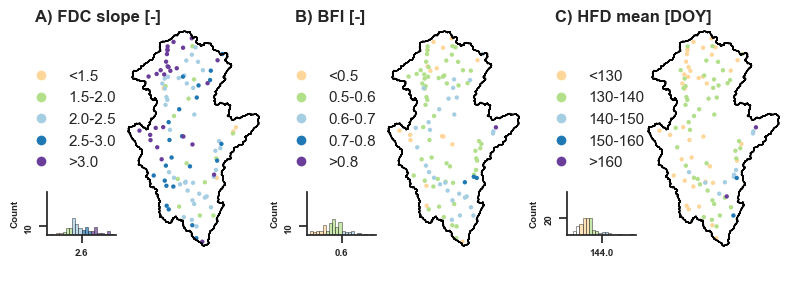

In [112]:
df[["slope_sawicz", "baseflow_index", "hfd_mean"]] = df[["slope_obs", "bfi_obs", "hfd_obs"]]

# List of variables
variable_list = ["slope_sawicz", "baseflow_index", "hfd_mean"]

# Create custom y labels (adjust based on your data)
custom_legend_title = ['FDC slope [-]',  
                   "BFI [-]", 
                   "HFD mean [DOY]"]

# Create a subplot grid
num_variables = len(variable_list)
num_cols = 3
num_rows = math.ceil(num_variables / num_cols)

fig, axs = plt.subplots(num_rows, num_cols, figsize=(7.8, 4.5))
axs = axs.flatten()

for i, variable in enumerate(variable_list):
    
    plot_variable_subplot(axs[i], variable, df, color_mapping_list, gdf)
    legend_title = custom_legend_title[i]
        
    axs[i].set_title(f'{chr(65+i)}) {legend_title}', loc="left", fontweight="bold", pad=0)  # Add subplot title with letter indexing
    # Plot the shapefile with white facecolor and black boundaries
    moselle.plot(ax=axs[i], facecolor='none', edgecolor='black', linewidth=1)
    
    #FR_selected_gdf.plot(ax=axs[i], facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    axs[i].set_xlim(3.7, 8) 
    axs[i].set_ylim(47.5, 50.5)  
    
# Adjust layout and remove space between subplots
plt.tight_layout(pad=0)

# Save the figure as a file
#fig.savefig(r'results\figs\fig_signatures_attributes.png', dpi=300, bbox_inches='tight')

# Save or display the plot
plt.show()

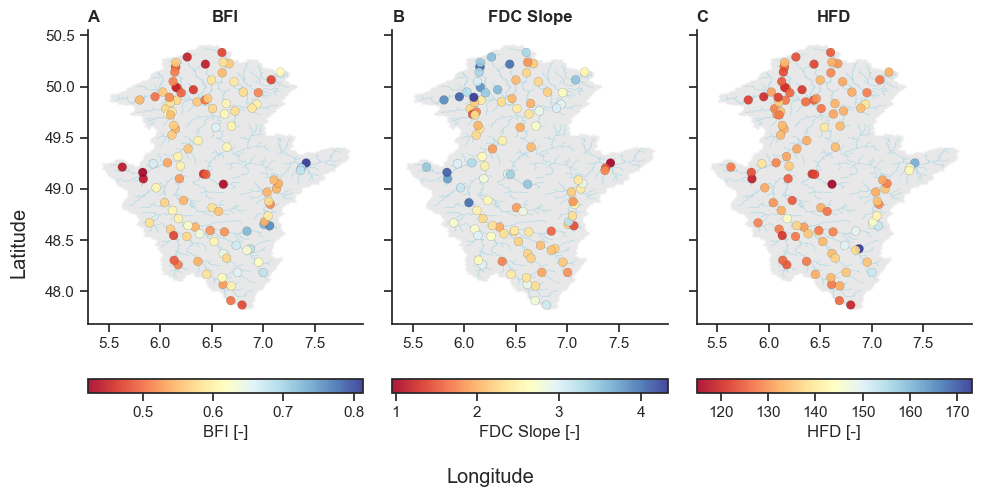

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Set style
sns.set_theme(style="ticks")

# Columns to plot and labels
obs_cols = ['bfi_obs', 'slope_obs', 'hfd_obs']
titles = ['A', 'B', 'C']
main_titles = ['BFI', 'FDC Slope', 'HFD']

# Colormap
cmaps = [plt.cm.RdYlBu, plt.cm.RdYlBu, plt.cm.RdYlBu]

# Determine value ranges for each observed variable
vmins = [df[col].min() for col in obs_cols]
vmaxs = [df[col].max() for col in obs_cols]

# Create figure and axes
fig, axes = plt.subplots(1, 3, figsize=(10, 5), sharex=True, sharey=True)

for ax, col, letter, label, cmap, vmin, vmax in zip(axes, obs_cols, titles, main_titles, cmaps, vmins, vmaxs):
    # Plot background maps
    moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

    # Scatter colored by observation
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot title
    ax.set_title(f"{letter}", loc="left", fontweight="bold")
    ax.set_title(f"{label}", fontsize=12, fontweight="bold", loc="center")

    ax.set_aspect('auto')
    ax.grid(False)
    sns.despine(ax=ax)

    # Colorbar below each subplot
    cbar = fig.colorbar(
        sc,
        ax=ax,
        orientation='horizontal',
        fraction=0.05,
        pad=0.15  # adjust vertical distance from plot
    )
    cbar.set_label(f"{label} [-]")

# Axis labels
fig.supxlabel("Longitude")
fig.supylabel("Latitude")

plt.tight_layout()
#plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\maps_signatures.png", dpi=300)

plt.show()


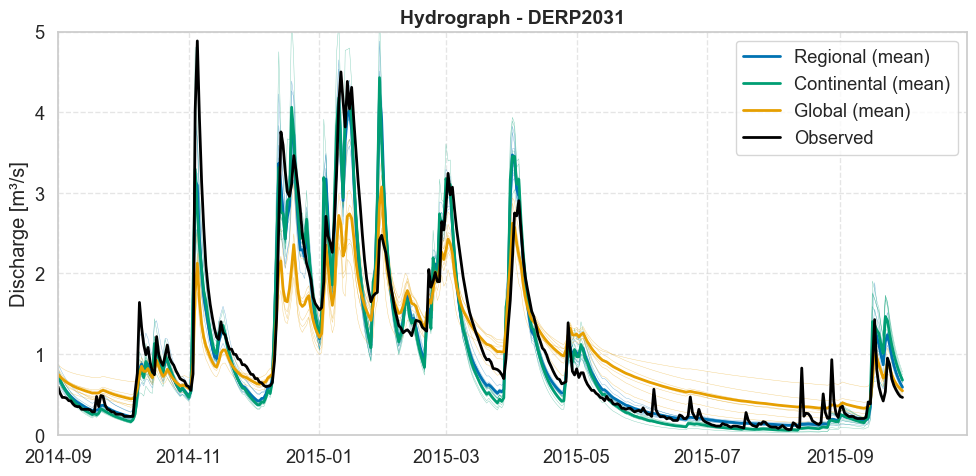

In [37]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# -------------------------------
# Parameters
# -------------------------------
gauge_id = "DERP2031"
start_date = '1988-10-01'
end_date = '2015-09-30'
focus_year = '2015'

# -------------------------------
# Time index and base dataframe
# -------------------------------
Qtimeseries = pd.DataFrame(index=pd.date_range(start_date, end_date, freq='D'))
Qtimeseries["Qobs"] = observations_cal[gauge_id]

# -------------------------------
# Helper function to collect simulations
# -------------------------------
def collect_simulations(output_dict, gauge_id):
    preds = []
    for group_dict in output_dict.values():
        if gauge_id in group_dict:
            preds.append(group_dict[gauge_id][0])
    return np.array(preds)  # shape: (n_groups, n_timesteps)

# -------------------------------
# Collect predictions
# -------------------------------
pred_r = collect_simulations(output_regional_dict_cal, gauge_id)
pred_c = collect_simulations(output_continental_dict_cal, gauge_id)
pred_g = collect_simulations(output_global_dict_cal, gauge_id)

# Add mean predictions to Qtimeseries
Qtimeseries["Qcalc_r"] = pred_r.mean(axis=0)
Qtimeseries["Qcalc_c"] = pred_c.mean(axis=0)
Qtimeseries["Qcalc_g"] = pred_g.mean(axis=0)

# -------------------------------
# Plot
# -------------------------------
fig, ax = plt.subplots(figsize=(10, 5))

# Plot all individual group predictions (thin lines)
for pred_array, color in zip([pred_r, pred_c, pred_g], ['#0072B2', '#009E73', '#E69F00']):  # blue, green, orange
    for i in range(pred_array.shape[0]):
        ax.plot(Qtimeseries.index, pred_array[i], color=color, alpha=0.5, linewidth=0.3)

# Plot mean lines (thicker, darker)
ax.plot(Qtimeseries.index, Qtimeseries["Qcalc_r"], color='#0072B2', label="Regional (mean)", linewidth=2)
ax.plot(Qtimeseries.index, Qtimeseries["Qcalc_c"], color='#009E73', label="Continental (mean)", linewidth=2)
ax.plot(Qtimeseries.index, Qtimeseries["Qcalc_g"], color='#E69F00', label="Global (mean)", linewidth=2)

# Plot observed discharge
ax.plot(Qtimeseries.index, Qtimeseries["Qobs"], color='black', label="Observed", linewidth=2)

# Focus on a specific year (e.g. 2015)
ax.set_xlim(pd.to_datetime(str(int(focus_year)-1) + "-09-01"), pd.to_datetime(focus_year + "-10-30"))
ax.set_ylim(0, 5)

# Final plot styling
ax.set_title(f"Hydrograph - {gauge_id}", fontsize=14, weight='bold')
ax.set_ylabel("Discharge [m³/s]")
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend()
plt.tight_layout()
plt.show()


In [ ]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="FR001179"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
#Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_dict_val["vienne_best_params_cont_Group_1"][gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_dict_val["vienne_best_params_glob_Group_1"][gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

Qtimeseries.loc["2015"].plot()

<Axes: >

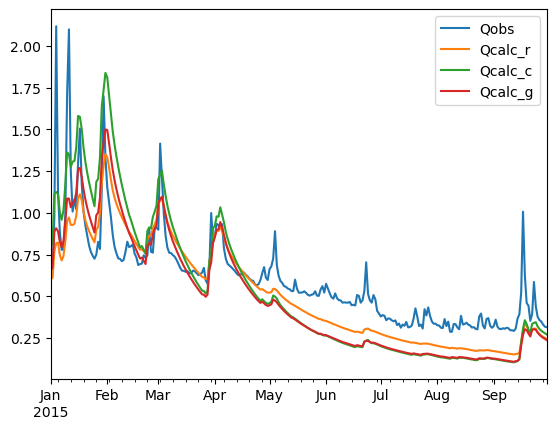

In [172]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="DERP2013"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

Qtimeseries.loc["2015"].plot()

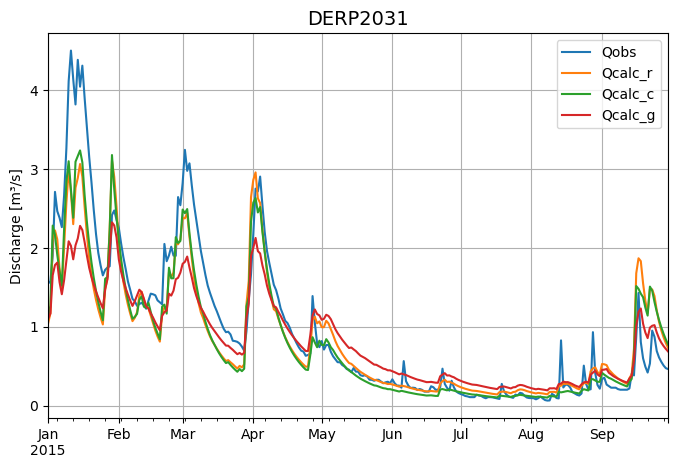

In [125]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="DERP2031"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["2015"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

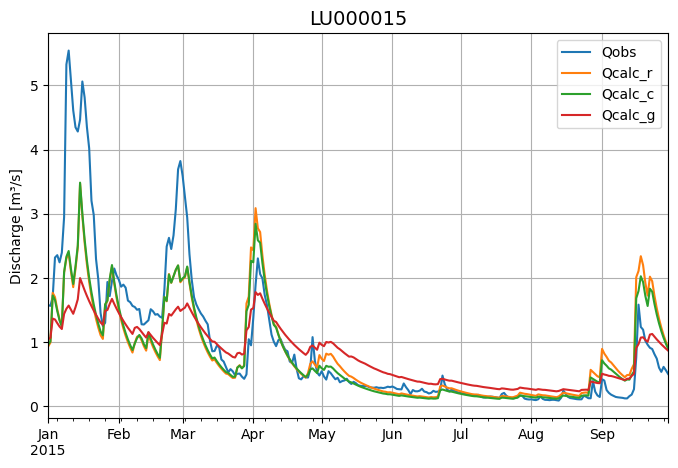

In [126]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="LU000015"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["2015"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

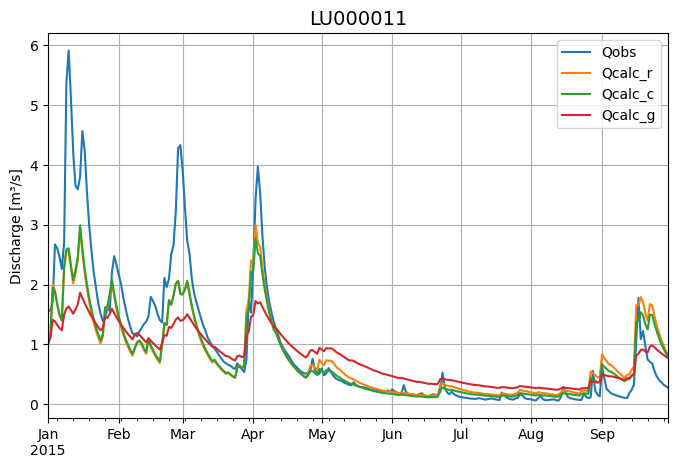

In [127]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="LU000011"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["2015"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

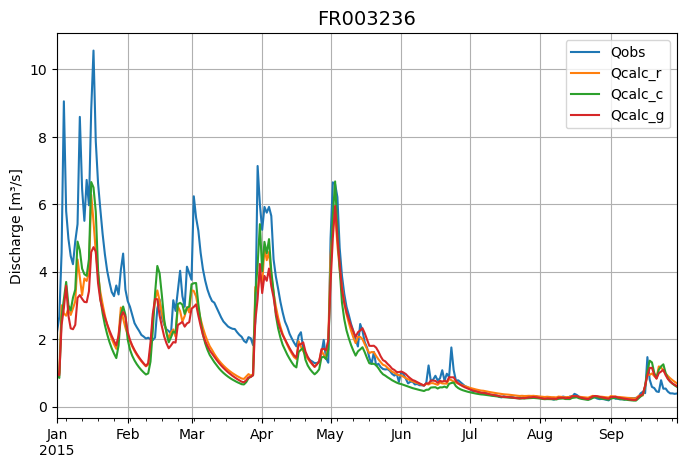

In [128]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="FR003236"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["2015"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

<Axes: >

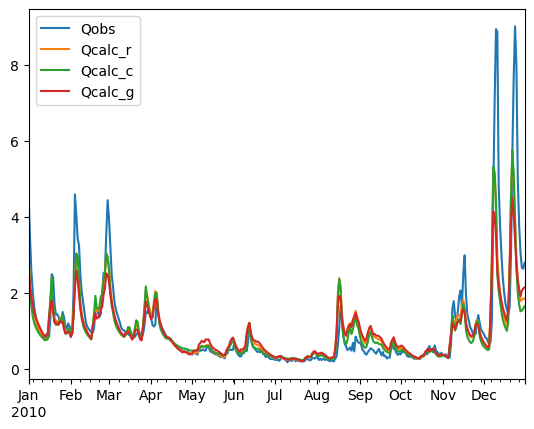

In [129]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="DEBU1956"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

Qtimeseries.loc["2010"].plot()

<Axes: >

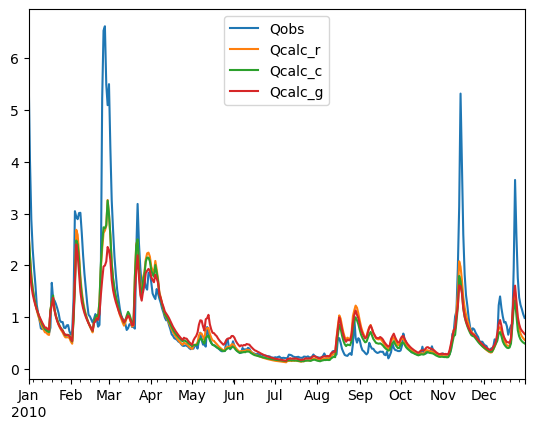

In [130]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="LU000017"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

Qtimeseries.loc["2010"].plot()

In [62]:
nse_results_cal_r_1_100[nse_results_cal_r_1_100.nse < 0.5]

,gauge_name,basin,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
8,A9021050,FR000185,0.287135,0.552725,0.745738,NaN,0.774233,1.179506,3.438700,1.965252,157.500000,163.000000
16,A6232010,FR000144,-0.489820,0.678912,0.758575,NaN,1.348492,1.181155,2.280050,2.096348,178.444444,152.777778
23,A6232010,FR000144,-0.489820,0.678912,0.758575,NaN,1.348492,1.181155,2.280050,2.096348,178.444444,152.777778
36,Le Woigot Ã Briey,FR003280,0.493093,0.689765,0.544019,NaN,1.295303,0.884625,3.038034,3.050208,138.076923,133.307692
65,A6232010,FR000144,-0.489820,0.678912,0.758575,NaN,1.348492,1.181155,2.280050,2.096348,178.444444,152.777778
70,Le Canner Ã KÅ“nigsmacker,FR003288,0.417412,0.588279,0.632877,NaN,0.492836,0.645429,1.896325,2.567747,128.846154,137.384615
76,Contwig,DERP2013,-0.488618,0.814145,0.778640,-1.972549,0.650233,0.793763,0.911240,2.230657,161.615385,153.923077
83,L'ArentÃƒÂ¨le ÃƒÂ Saint-Gorgon et ÃƒÂ Sainte...,FR003259,0.194456,0.582905,0.712927,NaN,0.835544,1.307601,2.004998,2.121848,143.285714,148.285714
98,La Meurthe Ã Fraize,FR003250,0.354904,0.683506,0.566194,NaN,2.122664,1.538537,1.657028,2.608849,154.250000,133.000000


In [292]:
nse_results_cal_r_1_100[nse_results_cal_r_1_100.basin == "FR000183"]

,gauge_name,basin,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
51,A9001050,FR000183,0.813653,0.701242,0.744249,NaN,1.099647,1.045212,1.964987,1.973349,146.272727,149.363636


In [293]:
nse_results_cal_r_1_100[nse_results_cal_r_1_100.basin == "FR003252"]

,gauge_name,basin,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
66,La Meurthe Ã Azerailles et Ã Baccarat,FR003252,0.746247,0.68354,0.682204,NaN,1.860452,1.575774,2.360902,2.057833,153.833333,147.666667


In [294]:
nse_results_cal_r_1_100[nse_results_cal_r_1_100.basin == "FR003254"]

,gauge_name,basin,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
68,La Vezouze Ã BlÃ¢mont et Ã FrÃ©monville,FR003254,0.731087,0.679523,0.748233,NaN,1.230142,0.987262,2.007317,2.101612,144.0,153.666667


In [79]:
nse_results_cal_c_1_100[nse_results_cal_c_1_100.nse < 0.5]

,gauge_name,basin,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
2,Martelange,BEWA0087,-20.952601,0.715474,0.541796,NaN,0.196649,1.271732,1.740044,3.133023,149.666667,123.500000
18,Contwig,DERP2013,0.284077,0.814145,0.903759,-0.571054,0.650233,0.758876,0.911240,1.011156,161.615385,178.307692
21,Saarburg,DERP2016,0.312854,0.670428,0.494655,-0.708736,0.790717,0.738667,1.843940,4.011947,141.615385,127.461538
29,Eisenschmitt,DERP2028,0.322533,0.601355,0.895222,-0.036490,0.955417,0.844708,2.127521,1.001812,133.000000,176.461538
30,Dreis,DERP2029,0.437715,0.581470,0.864318,-0.350848,0.719485,0.764893,2.157646,1.117771,133.615385,169.923077
38,A4333010,FR000132,0.357028,0.663813,0.523920,NaN,1.738141,2.182535,1.942057,2.880786,134.636364,122.818182
43,A6232010,FR000144,-0.120584,0.678912,0.789053,NaN,1.348492,1.174152,2.280050,1.358923,178.444444,159.222222
52,A9013050,FR000184,0.494479,0.768679,0.899653,NaN,1.281813,1.146868,1.627801,1.078761,149.666667,175.666667
53,A9021050,FR000185,0.161288,0.552725,0.819895,NaN,0.774233,1.132219,3.438700,1.184193,157.500000,173.833333
64,La Meurthe Ã Fraize,FR003250,0.239730,0.683506,0.539023,NaN,2.122664,1.532101,1.657028,2.899255,154.250000,129.750000


In [63]:
len(nse_results_cal_r_1_100_8801[nse_results_cal_r_1_100_8801.nse < 0.5])

13

In [64]:
len(nse_results_cal_c_1_100_8801[nse_results_cal_c_1_100_8801.nse < 0.5])

14

In [65]:
len(nse_results_cal_g_1_100_8801[nse_results_cal_g_1_100_8801.nse < 0.5])

12

In [179]:
list_cal = ['FR000184',
 'DERP2017',
 'DERP2011',
 'DERP2013',
 'DERP2007',
 'DERP2024',
 'FR003253',
 #'FR003308',
 'FR003283',
 'FR003301',
 'DERP2003',
 'FR003265',
 'FR003272',
 'DEBU1958']


In [83]:
nse_results_cal_r_1_100_8801.set_index("basin", inplace=False).loc[list_cal].nse

basin
FR000184    0.352785
DERP2017    0.867801
DERP2011    0.819390
DERP2013    0.234303
DERP2007    0.856445
DERP2024    0.879439
FR003253    0.773447
FR003283    0.727192
FR003301    0.855149
DERP2003    0.885016
FR003265    0.902029
FR003272    0.880370
DEBU1958    0.902156
Name: nse, dtype: float64

In [84]:
nse_results_cal_c_1_100_8801.set_index("basin", inplace=False).loc[list_cal].nse

basin
FR000184    0.486031
DERP2017    0.841313
DERP2011    0.780354
DERP2013    0.123369
DERP2007    0.820179
DERP2024    0.862515
FR003253    0.793678
FR003283    0.713177
FR003301    0.821363
DERP2003    0.854755
FR003265    0.896927
FR003272    0.877333
DEBU1958    0.889595
Name: nse, dtype: float64

In [85]:
nse_results_cal_g_1_100_8801.set_index("basin", inplace=False).loc[list_cal].nse

basin
FR000184    0.465567
DERP2017    0.730429
DERP2011    0.806612
DERP2013    0.141411
DERP2007    0.866385
DERP2024    0.876119
FR003253    0.808930
FR003283    0.731916
FR003301    0.838486
DERP2003    0.790638
FR003265    0.903852
FR003272    0.884194
DEBU1958    0.895964
Name: nse, dtype: float64

In [86]:
nse_results_cal_r_1_100.set_index("basin", inplace=False).loc[list_cal].nse

basin
FR000184    0.659844
DERP2017    0.838269
DERP2011    0.772581
DERP2013    0.176162
DERP2007    0.804265
DERP2024    0.835266
FR003253    0.765287
FR003283    0.759701
FR003301    0.821211
DERP2003    0.860527
FR003265    0.882589
FR003272    0.851035
DEBU1958    0.899955
Name: nse, dtype: float64

In [87]:
nse_results_cal_c_1_100.set_index("basin", inplace=False).loc[list_cal].nse

basin
FR000184    0.494479
DERP2017    0.806931
DERP2011    0.754340
DERP2013    0.284077
DERP2007    0.791043
DERP2024    0.836585
FR003253    0.755521
FR003283    0.778456
FR003301    0.852679
DERP2003    0.870758
FR003265    0.906480
FR003272    0.865265
DEBU1958    0.914803
Name: nse, dtype: float64

In [88]:
nse_results_cal_g_1_100.set_index("basin", inplace=False).loc[list_cal].nse

basin
FR000184    0.691362
DERP2017    0.750994
DERP2011    0.779291
DERP2013    0.108688
DERP2007    0.828013
DERP2024    0.833642
FR003253    0.793202
FR003283    0.758378
FR003301    0.818336
DERP2003    0.786225
FR003265    0.892816
FR003272    0.859693
DEBU1958    0.898294
Name: nse, dtype: float64

In [137]:
data_diff_val_complete[["lon", "lat"]] = network_estreams[["lon", "lat"]]
data_diff_val_complete

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1,lon,lat
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,0.033513,0.295382,0.838430,0.804917,0.543048,NaN,NaN,NaN,0.515742,0.550943,...,3.400558,3.121880,2.554032,1.713252,126.294118,129.588235,134.941176,156.176471,6.151802,50.188258
BEWA0067,0.047152,0.236029,0.788691,0.741539,0.552662,NaN,NaN,NaN,0.446878,0.537480,...,3.527884,3.133557,2.543764,1.836960,123.437500,129.187500,137.500000,152.687500,6.263467,50.289277
BEWA0106,0.017845,0.413216,0.764083,0.746238,0.350867,NaN,NaN,NaN,0.496805,0.547966,...,4.063631,3.118763,2.623174,1.562442,127.000000,130.739130,134.869565,164.260870,6.150669,50.196522
BEWA0107,0.010444,0.303428,0.740081,0.729637,0.436653,NaN,NaN,NaN,0.565063,0.536219,...,3.418299,3.138160,2.724969,1.713870,133.588235,134.058824,138.647059,165.823529,6.153955,50.234494
BEWA0119,0.025248,0.267249,0.815924,0.790676,0.548675,NaN,NaN,NaN,0.508101,0.545023,...,3.336434,3.139372,2.679279,1.866495,123.266667,129.400000,133.333333,153.933333,6.141814,50.141935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,0.054974,0.467338,0.819813,0.764840,0.352475,NaN,NaN,NaN,0.516853,0.551345,...,4.331634,2.995448,2.226096,1.351069,121.769231,124.384615,132.461538,163.615385,6.091178,49.895421
LU000016,-0.038874,0.026691,0.636273,0.675147,0.609581,NaN,NaN,NaN,0.564940,0.522122,...,2.005883,3.044009,2.571448,3.110440,133.615385,126.000000,132.230769,127.230769,6.132266,49.620647
LU000017,0.031045,0.077578,0.860150,0.829105,0.782572,NaN,NaN,NaN,0.572433,0.591535,...,2.459555,2.591746,1.990153,1.716308,127.307692,129.461538,136.692308,144.000000,6.509851,49.785883


In [157]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import geopandas as gpd

In [158]:
moselle=gpd.read_file(r"..\data\shps\moselle_delienation.shp")
rivers_moselle=gpd.read_file(r"..\data\shps\rivers_moselle.shp")

In [262]:
list_cal = ['FR000184',
 'DERP2017',
 'DERP2011',
 'DERP2013',
 'DERP2007',
 'DERP2024',
 'FR003253',
 #'FR003308',
 'FR003283',
 'FR003301',
 'DERP2003',
 'FR003265',
 'FR003272',
 'DEBU1958']


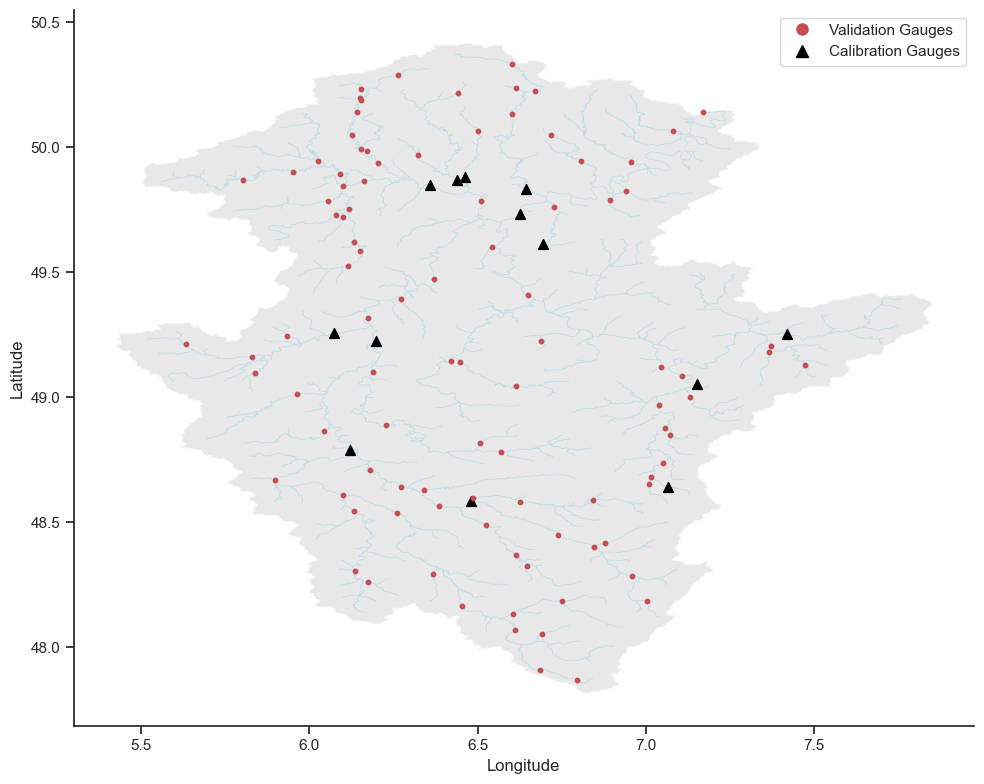

In [263]:
df = data_diff_val_complete.copy()

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Set style
sns.set_theme(style="ticks")

# Custom colormap (red -> gray -> blue)
cmap_nse = LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, '#d35555'), (0.2, '#d8dadc'), (1, '#009ad8')]
)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

ax.scatter(
    network_estreams.loc[list_cal, 'lon'],
    network_estreams.loc[list_cal, 'lat'],
    marker='^',        # triangle
    color='black',     # black
    s=50,              # size of the triangle
    zorder=3,          # on top
    label='Calibrated Basins'
)

ax.scatter(
    df.loc[:, 'lon'],
    df.loc[:, 'lat'],
    marker='o',        # triangle
    color='r',     # black
    s=10,              # size of the triangle
    zorder=3,          # on top
    label='Calibrated Basins'
)

ax.set_aspect('auto')  # or 'equal' for 1:1 scale, but you want 'auto' (equal=False)

# Decorations
#plt.colorbar(sc, label="NSE", ax=ax)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
#ax.set_title("NSE Values by Location")
ax.grid(False)
sns.despine()


import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Circle for validation
validation_handle = mlines.Line2D([], [], color='r', marker='o', linestyle='None',
                                  markersize=8, label='Validation Gauges')

# Triangle for calibration
calibration_handle = mlines.Line2D([], [], color='black', marker='^', linestyle='None',
                                   markersize=8, label='Calibration Gauges')

# Add to legend
ax.legend(handles=[validation_handle, calibration_handle], loc='upper right')



plt.tight_layout()
plt.show()


,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
basin,,,,,,,,,,,,,,,,,,,,,
LU000018,0.165330,-0.005979,0.643927,0.478597,0.649906,NaN,NaN,NaN,0.549133,0.663651,...,0.747819,0.753208,2.305895,2.126032,1.752822,2.940732,127.384615,139.230769,146.230769,129.615385
LU000010,0.118536,0.074434,0.710777,0.592241,0.636343,NaN,NaN,NaN,0.618760,0.667081,...,0.834394,0.840603,1.430667,2.156746,1.903346,2.982150,130.615385,138.615385,143.692308,128.923077
LU000001,0.002910,0.160013,0.827942,0.825032,0.667929,NaN,NaN,NaN,0.546850,0.558409,...,1.070685,1.082947,3.860265,2.508516,2.444504,1.978572,121.615385,129.230769,129.000000,145.846154
DERP2028,0.004380,-0.076293,0.631966,0.627586,0.708260,0.578659,0.569747,0.699353,0.591229,0.771450,...,1.007220,0.990973,2.249833,2.012464,2.052597,2.119470,131.461538,152.653846,149.269231,147.115385
FR000183,0.009503,-0.001809,0.476467,0.466965,0.478277,NaN,NaN,NaN,0.726346,0.737001,...,1.129375,1.117234,2.204864,2.113599,2.233890,2.270498,147.250000,147.500000,143.791667,142.708333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DERP2007,0.000284,-0.009585,0.780389,0.780105,0.789974,0.813876,0.791860,0.771415,0.500914,0.615233,...,1.064938,1.048703,2.915571,2.503010,2.523587,2.837581,124.884615,136.423077,134.884615,135.923077
FR003271,-0.010294,0.015875,0.706475,0.716769,0.690601,NaN,NaN,NaN,0.543269,0.604438,...,0.705003,0.695529,2.584565,2.792069,2.574238,3.001353,124.560000,132.960000,134.040000,130.440000
FR003301,0.012553,-0.014131,0.782955,0.770402,0.797086,NaN,NaN,NaN,0.540766,0.653930,...,0.892364,0.888493,2.879739,2.441276,2.348354,2.595211,128.187500,137.562500,137.187500,134.687500


In [40]:
df = data_diff_val_complete.copy()
df[["lon", "lat"]] = estreams_attributes_clipped_filters[["lon", "lat"]]
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Set style
sns.set_theme(style="ticks")

# Custom colormap (red -> gray -> blue)
cmap_nse = LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, '#d35555'), (0.7, '#d8dadc'), (1, '#009ad8')]
)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

ax.scatter(
    network_estreams.loc[list_cal, 'lon'],
    network_estreams.loc[list_cal, 'lat'],
    marker='^',        # triangle
    color='black',     # black
    s=50,              # size of the triangle
    zorder=3,          # on top
    label='Calibrated Basins'
)

sc = ax.scatter(
    df['lon'], df['lat'],
    c=df['nse_r1'],
    cmap=cmap_nse,
    s=40,
    edgecolor='k',
    linewidth=0.1,
    alpha=0.9,
    zorder=10
)

ax.set_aspect('auto')  # or 'equal' for 1:1 scale, but you want 'auto' (equal=False)

# Decorations
plt.colorbar(sc, label="NSE", ax=ax)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
#ax.set_title("NSE Values by Location")
ax.grid(False)
sns.despine()


import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Circle for validation
validation_handle = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                                  markersize=8, label='Validation Gauges')

# Triangle for calibration
calibration_handle = mlines.Line2D([], [], color='black', marker='^', linestyle='None',
                                   markersize=8, label='Calibration Gauges')

# Add to legend
ax.legend(handles=[validation_handle, calibration_handle], loc='upper right')



plt.tight_layout()
plt.show()

C:\Users\nascimth\AppData\Local\Temp\ipykernel_4688\1350808124.py:2: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  df[["lon", "lat"]] = estreams_attributes_clipped_filters[["lon", "lat"]]


ValueError: cannot reindex on an axis with duplicate labels

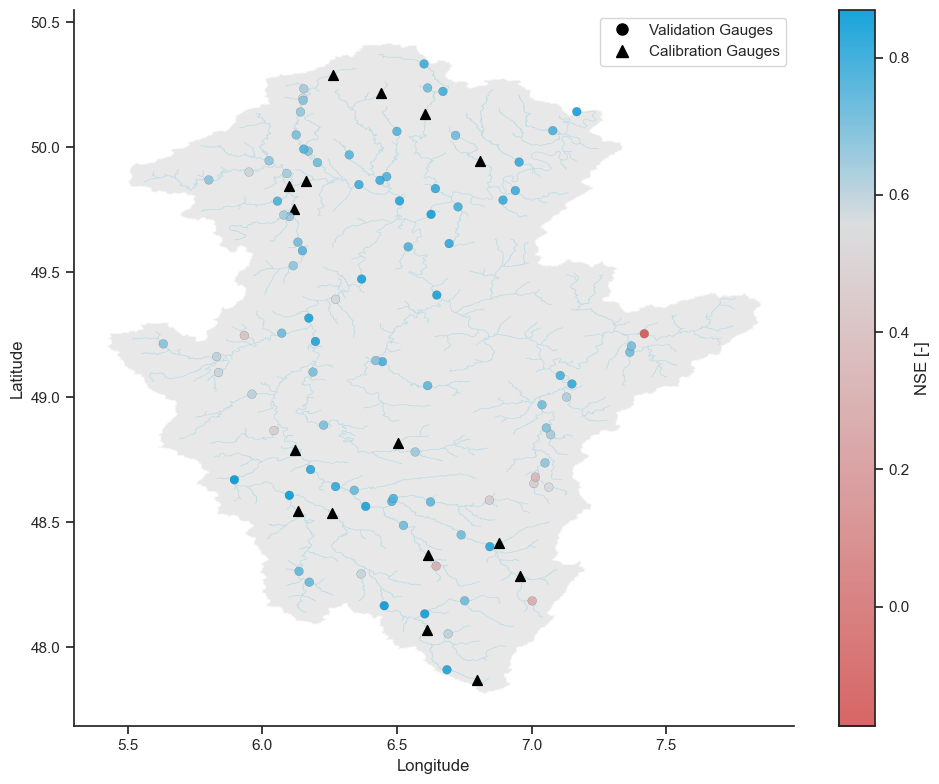

In [162]:

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Set style
sns.set_theme(style="ticks")

# Custom colormap (red -> gray -> blue)
cmap_nse = LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, '#d35555'), (0.7, '#d8dadc'), (1, '#009ad8')]
)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

ax.scatter(
    network_estreams.loc[list_cal, 'lon'],
    network_estreams.loc[list_cal, 'lat'],
    marker='^',        # triangle
    color='black',     # black
    s=50,              # size of the triangle
    zorder=3,          # on top
    label='Calibrated Basins'
)

sc = ax.scatter(
    df['lon'], df['lat'],
    c=df['nse_g1'],
    cmap=cmap_nse,
    s=40,
    edgecolor='k',
    linewidth=0.1,
    alpha=0.9,
    zorder=10
)

ax.set_aspect('auto')  # or 'equal' for 1:1 scale, but you want 'auto' (equal=False)

# Decorations
plt.colorbar(sc, label="NSE [-]", ax=ax)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
#ax.set_title("NSE Values by Location")
ax.grid(False)
sns.despine()


import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Circle for validation
validation_handle = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                                  markersize=8, label='Validation Gauges')

# Triangle for calibration
calibration_handle = mlines.Line2D([], [], color='black', marker='^', linestyle='None',
                                   markersize=8, label='Calibration Gauges')

# Add to legend
ax.legend(handles=[validation_handle, calibration_handle], loc='upper right')



plt.tight_layout()
plt.show()


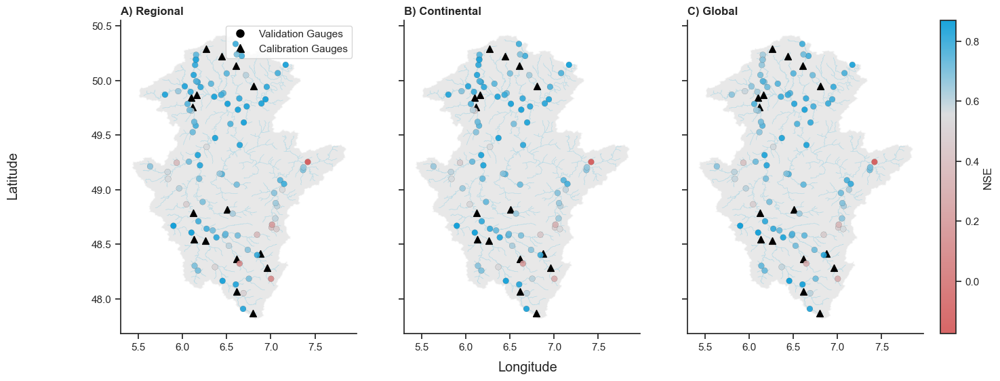

In [163]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.lines as mlines

# Set style
sns.set_theme(style="ticks")

# Custom colormap (red -> gray -> blue)
cmap_nse = LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, '#d35555'), (0.7, '#d8dadc'), (1, '#009ad8')]
)

# Create figure with 3 columns
fig, axes = plt.subplots(1, 3, figsize=(16, 6), sharex=True, sharey=True)

# NSE columns to plot
nse_cols = ['nse_r1', 'nse_c1', 'nse_g1']
titles = ['A) Regional', 'B) Continental', 'C) Global']

for ax, col, title in zip(axes, nse_cols, titles):
    moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

    # Calibration basins (triangle)
    ax.scatter(
        network_estreams.loc[list_cal, 'lon'],
        network_estreams.loc[list_cal, 'lat'],
        marker='^',
        color='black',
        s=50,
        zorder=3,
        label='Calibrated Basins'
    )

    # NSE scatter
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    ax.set_title(title, loc="left", fontweight="bold")
    ax.set_aspect('auto')
    ax.grid(False)
    sns.despine(ax=ax)

    # Add legend only to the first plot
    if ax == axes[0]:
        validation_handle = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                                          markersize=8, label='Validation Gauges')
        calibration_handle = mlines.Line2D([], [], color='black', marker='^', linestyle='None',
                                           markersize=8, label='Calibration Gauges')
        ax.legend(handles=[validation_handle, calibration_handle], loc='upper right')

# Shared labels and colorbar
fig.supxlabel("Longitude")
fig.supylabel("Latitude")

# One colorbar for all
#bar = fig.colorbar(sc, ax=axes.ravel().tolist(), label='NSE', shrink=0.8)
# Add a vertical colorbar on the extreme right
cbar = fig.colorbar(
    sc, 
    ax=axes, 
    orientation='vertical', 
    fraction=0.025,  # controls the thickness
    pad=0.02         # controls the distance from the last subplot
)
cbar.set_label('NSE')

#plt.tight_layout()
plt.show()


<Axes: >

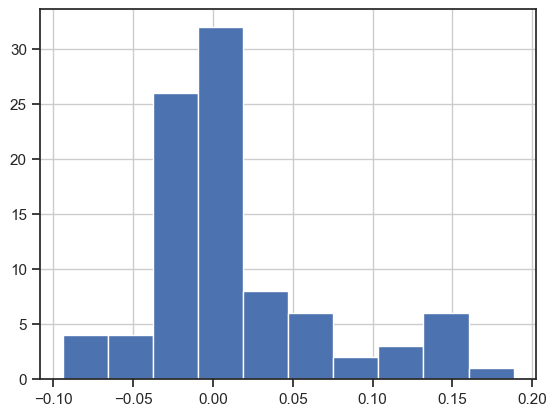

In [164]:
df['nse_rg'].hist()

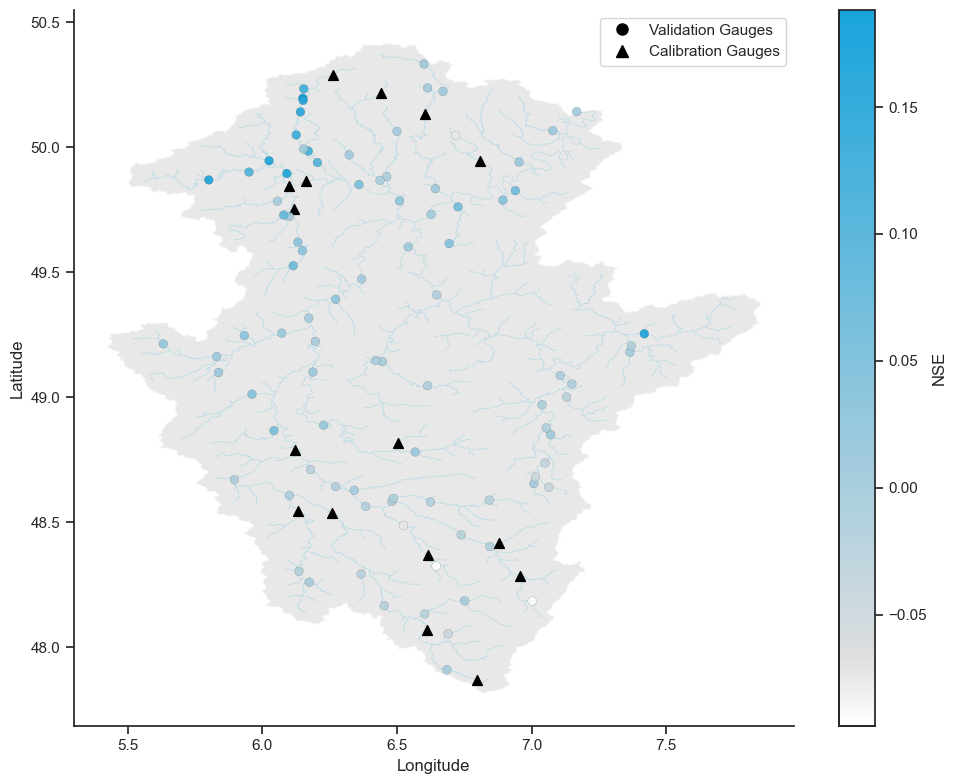

In [168]:
df = data_diff_val_complete.copy()
df[["lon", "lat"]] = estreams_attributes_clipped_filters[["lon", "lat"]]

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Set style
sns.set_theme(style="ticks")

# Custom colormap (red -> gray -> blue)
cmap_nse = LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, 'white'), (0.1, '#d8dadc'), (1, '#009ad8')]
)


# Plot
fig, ax = plt.subplots(figsize=(10, 8))
moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

ax.scatter(
    network_estreams.loc[list_cal, 'lon'],
    network_estreams.loc[list_cal, 'lat'],
    marker='^',        # triangle
    color='black',     # black
    s=50,              # size of the triangle
    zorder=3,          # on top
    label='Calibrated Basins'
)

sc = ax.scatter(
    df['lon'], df['lat'],
    c=df['nse_rg'],
    cmap=cmap_nse,
    s=40,
    edgecolor='k',
    linewidth=0.1,
    alpha=0.9,
    zorder=10
)

ax.set_aspect('auto')  # or 'equal' for 1:1 scale, but you want 'auto' (equal=False)

# Decorations
plt.colorbar(sc, label="NSE", ax=ax)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
#ax.set_title("NSE Values by Location")
ax.grid(False)
sns.despine()


import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Circle for validation
validation_handle = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                                  markersize=8, label='Validation Gauges')

# Triangle for calibration
calibration_handle = mlines.Line2D([], [], color='black', marker='^', linestyle='None',
                                   markersize=8, label='Calibration Gauges')

# Add to legend
ax.legend(handles=[validation_handle, calibration_handle], loc='upper right')



plt.tight_layout()
plt.show()


### Group 2: second half

In [212]:
list_cal = ['FR003303',
 'FR000144',
 'DERP2033',
 'FR003275',
 'DERP2004',
 'FR003271',
 #'LU000007',
 'FR003237',
 'FR000171',
 'FR000159',
 'FR003249',
 'DEBU1957',
 'DEBU1956',
 'DEBU1959']

In [103]:
catchments_ids = estreams_attributes_clipped_filters.index.tolist()

path_inputs = '../data/models/input/subset_2001_2015'

inputs = np.load(path_inputs+'//inputs.npy', allow_pickle=True).item()
observations = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
areas = np.load(path_inputs+'//areas.npy', allow_pickle=True).item()
perm_areas = np.load(path_inputs+'//perm_areas.npy', allow_pickle=True).item()
perm_areascontinental = np.load(path_inputs+'//perm_areascontinental.npy', allow_pickle=True).item()
perm_areasglobal = np.load(path_inputs+'//perm_areasglobal.npy', allow_pickle=True).item()
quality_masks = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()
rootdepth_mean = np.load(path_inputs+'//rootdepth_mean.npy', allow_pickle=True).item()
waterdeficit_mean= np.load(path_inputs+'//waterdeficit_mean.npy', allow_pickle=True).item()

output_regional2 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_r_2, perm_areas_model = perm_areas)
output_continental2 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_c_2, perm_areas_model = perm_areascontinental)
output_global2 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_g_2, perm_areas_model = perm_areasglobal)

nse_results_cal_r_2_100 = generate_nse_results(catchments_ids, pd.date_range('2001-10-01', '2015-09-30', freq='D'), output_regional2, observations, quality_masks)
nse_results_cal_c_2_100 = generate_nse_results(catchments_ids, pd.date_range('2001-10-01', '2015-09-30', freq='D'), output_continental2, observations, quality_masks)
nse_results_cal_g_2_100 = generate_nse_results(catchments_ids, pd.date_range('2001-10-01', '2015-09-30', freq='D'), output_global2, observations, quality_masks)

path_inputs = '../data/models/input/subset_1988_2001'

inputs = np.load(path_inputs+'//inputs.npy', allow_pickle=True).item()
observations = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
areas = np.load(path_inputs+'//areas.npy', allow_pickle=True).item()
perm_areas = np.load(path_inputs+'//perm_areas.npy', allow_pickle=True).item()
perm_areascontinental = np.load(path_inputs+'//perm_areascontinental.npy', allow_pickle=True).item()
perm_areasglobal = np.load(path_inputs+'//perm_areasglobal.npy', allow_pickle=True).item()
quality_masks = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()
rootdepth_mean = np.load(path_inputs+'//rootdepth_mean.npy', allow_pickle=True).item()
waterdeficit_mean= np.load(path_inputs+'//waterdeficit_mean.npy', allow_pickle=True).item()

output_regional_88012 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_r_2_8801, perm_areas_model = perm_areas)
output_continental_88012 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_c_2_8801, perm_areas_model = perm_areascontinental)
output_global_88012 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_g_2_8801, perm_areas_model = perm_areasglobal)

nse_results_cal_r_2_100_8801 = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2001-09-30', freq='D'), output_regional_88012, observations, quality_masks)
nse_results_cal_c_2_100_8801 = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2001-09-30', freq='D'), output_continental_88012, observations, quality_masks)
nse_results_cal_g_2_100_8801 = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2001-09-30', freq='D'), output_global_88012, observations, quality_masks)


path_inputs = '../data/models/input/subset_1988_2001'

observations1 = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
quality_masks1 = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()

path_inputs = '../data/models/input/subset_2001_2015'

observations2 = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
quality_masks2 = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()


observations_cal = {}

for key in observations1.keys():
    arr1 = np.atleast_1d(observations1[key])
    arr2 = np.atleast_1d(observations2.get(key, np.array([])))

    # Always concatenate arrays, even if they contain NaNs or are empty
    observations_cal[key] = np.concatenate([arr1, arr2])

quality_masks_cal = {}

for key in quality_masks1.keys():
    arr1 = np.atleast_1d(quality_masks1[key])
    arr2 = np.atleast_1d(quality_masks2.get(key, np.array([])))

    # Always concatenate arrays, even if they contain NaNs or are empty
    quality_masks_cal[key] = np.concatenate([arr1, arr2])

output_regional_cal2 = {
    key: [np.concatenate([output_regional_88012[key][0], output_regional2[key][0]])]
    for key in output_regional_88012
    if key in output_regional2  # ensures keys match
}

output_continental_cal2 = {
    key: [np.concatenate([output_continental_88012[key][0], output_continental2[key][0]])]
    for key in output_continental_88012
    if key in output_continental2  # ensures keys match
}

output_global_cal2 = {
    key: [np.concatenate([output_global_88012[key][0], output_global2[key][0]])]
    for key in output_global_88012
    if key in output_global2  # ensures keys match
}


nse_results_cal_r_2_100_complete_cal = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2015-09-30', freq='D'), output_regional_cal2, observations_cal, quality_masks_cal)
nse_results_cal_c_2_100_complete_cal = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2015-09-30', freq='D'), output_continental_cal2, observations_cal, quality_masks_cal)
nse_results_cal_g_2_100_complete_cal = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2015-09-30', freq='D'), output_global_cal2, observations_cal, quality_masks_cal)

c:\Users\nascimth\.conda\envs\superf\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\nascimth\.conda\envs\superf\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\nascimth\AppData\Local\Temp\ipykernel_18512\1110209421.py:27: RuntimeWarning: invalid value encountered in double_scalars
  metric = np.sum((sim**expo - obs**expo)**2) / np.sum((obs**expo - np.mean(obs**expo))**2)
c:\Users\nascimth\.conda\envs\superf\lib\site-packages\hydroanalysis\utils.py:63: UserWarning: Skipped because of no data
  warnings.warn('Skipped because of no data')
c:\Users\nascimth\.conda\envs\superf\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\nascimth\.conda\envs\superf\lib\site-packages\numpy\core\_methods.py:1

In [104]:
data_diff_cal_complete2 = pd.DataFrame(data=nse_results_cal_r_2_100_complete_cal.nse - nse_results_cal_c_2_100_complete_cal.nse)
data_diff_cal_complete2["nse_rg"] = nse_results_cal_r_2_100_complete_cal.nse - nse_results_cal_g_2_100_complete_cal.nse

data_diff_cal_complete2.index = nse_results_cal_c_2_100_complete_cal.basin

data_diff_cal_complete2 = data_diff_cal_complete2.loc[~data_diff_cal_complete2.index.isin(list_cal)]

data_diff_cal_complete2["nse_r1"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).nse
data_diff_cal_complete2["nse_c1"] = nse_results_cal_c_2_100_complete_cal.set_index("basin", inplace = False).nse
data_diff_cal_complete2["nse_g1"] = nse_results_cal_g_2_100_complete_cal.set_index("basin", inplace = False).nse

data_diff_cal_complete2["nse_bfi_r1"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).nse_value_bfi
data_diff_cal_complete2["nse_bfi_c1"] = nse_results_cal_c_2_100_complete_cal.set_index("basin", inplace = False).nse_value_bfi
data_diff_cal_complete2["nse_bfi_g1"] = nse_results_cal_g_2_100_complete_cal.set_index("basin", inplace = False).nse_value_bfi

data_diff_cal_complete2["bfi_obs"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).bfi_obs
data_diff_cal_complete2["bfi_r1"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).bfi_sim
data_diff_cal_complete2["bfi_c1"] = nse_results_cal_c_2_100_complete_cal.set_index("basin", inplace = False).bfi_sim
data_diff_cal_complete2["bfi_g1"] = nse_results_cal_g_2_100_complete_cal.set_index("basin", inplace = False).bfi_sim

data_diff_cal_complete2["qmean_obs"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).qmean_obs
data_diff_cal_complete2["qmean_r1"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).qmean_sim
data_diff_cal_complete2["qmean_c1"] = nse_results_cal_c_2_100_complete_cal.set_index("basin", inplace = False).qmean_sim
data_diff_cal_complete2["qmean_g1"] = nse_results_cal_g_2_100_complete_cal.set_index("basin", inplace = False).qmean_sim

data_diff_cal_complete2["slope_obs"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).slope_obs
data_diff_cal_complete2["slope_r1"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).slope_sim
data_diff_cal_complete2["slope_c1"] = nse_results_cal_c_2_100_complete_cal.set_index("basin", inplace = False).slope_sim
data_diff_cal_complete2["slope_g1"] = nse_results_cal_g_2_100_complete_cal.set_index("basin", inplace = False).slope_sim

data_diff_cal_complete2["hfd_obs"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).hfd_obs
data_diff_cal_complete2["hfd_r1"] = nse_results_cal_r_2_100_complete_cal.set_index("basin", inplace = False).hfd_sim
data_diff_cal_complete2["hfd_c1"] = nse_results_cal_c_2_100_complete_cal.set_index("basin", inplace = False).hfd_sim
data_diff_cal_complete2["hfd_g1"] = nse_results_cal_g_2_100_complete_cal.set_index("basin", inplace = False).hfd_sim


data_diff_cal_complete2 = data_diff_cal_complete2[data_diff_cal_complete2.nse_r1 > -10.0]
data_diff_cal_complete2

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,-0.025793,0.310020,0.829036,0.854830,0.519017,NaN,NaN,NaN,0.515742,0.573456,...,1.307285,1.234615,3.400558,2.743290,3.195068,1.777066,126.294118,137.294118,130.352941,159.352941
BEWA0067,-0.034845,0.234069,0.768075,0.802919,0.534006,NaN,NaN,NaN,0.446878,0.560397,...,1.397150,1.323675,3.527884,2.698627,3.134984,1.860673,123.437500,138.937500,130.562500,154.750000
BEWA0106,-0.029836,0.487017,0.763070,0.792906,0.276053,NaN,NaN,NaN,0.496805,0.572535,...,1.021858,0.983790,4.063631,2.783658,3.291014,1.591152,127.000000,136.521739,133.000000,171.000000
BEWA0107,-0.002470,0.396842,0.759315,0.761785,0.362473,NaN,NaN,NaN,0.565063,0.557326,...,1.429620,1.321399,3.418299,2.795479,3.137608,1.671909,133.588235,141.411765,133.941176,168.588235
BEWA0119,-0.015906,0.310934,0.816860,0.832765,0.505925,NaN,NaN,NaN,0.508101,0.567503,...,1.325504,1.260757,3.336434,2.753243,3.131224,1.822339,123.266667,136.400000,130.600000,157.133333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,-0.060333,0.383704,0.784399,0.844733,0.400695,NaN,NaN,NaN,0.516853,0.570479,...,1.013724,0.962041,4.331634,2.573227,3.314807,1.744927,121.769231,135.076923,128.000000,164.692308
LU000016,0.113749,0.058466,0.657855,0.544106,0.599389,NaN,NaN,NaN,0.564940,0.555673,...,0.696155,0.690550,2.005883,2.774134,3.753879,3.276128,133.615385,134.384615,130.076923,130.538462
LU000017,-0.018020,0.066757,0.844705,0.862725,0.777947,NaN,NaN,NaN,0.572433,0.606628,...,0.873031,0.845101,2.459555,2.377061,2.690857,1.983503,127.307692,137.769231,133.076923,147.846154


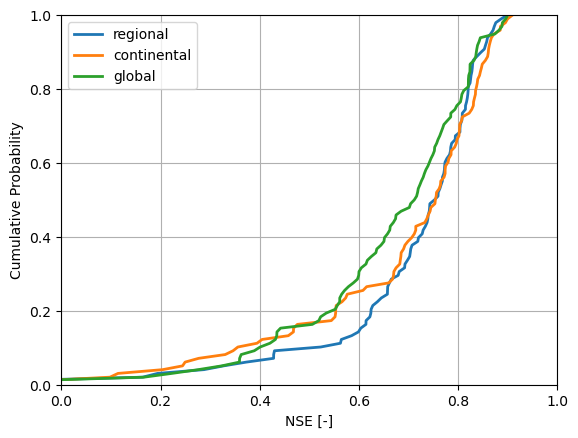

In [105]:
# Remove NaN values from the NSE columns before sorting
nse_values_1 = np.sort(data_diff_cal_complete2["nse_r1"].dropna())
nse_values_2 = np.sort(data_diff_cal_complete2["nse_c1"].dropna())
nse_values_3 = np.sort(data_diff_cal_complete2["nse_g1"].dropna())

# Compute cumulative distribution correctly
cumulative_1 = np.arange(1, len(nse_values_1) + 1) / len(nse_values_1)
cumulative_2 = np.arange(1, len(nse_values_2) + 1) / len(nse_values_2)
cumulative_3 = np.arange(1, len(nse_values_3) + 1) / len(nse_values_3)

# Plot cumulative distributions
plt.plot(nse_values_1, cumulative_1, label="regional", linewidth=2)
plt.plot(nse_values_2, cumulative_2, label="continental", linewidth=2)
plt.plot(nse_values_3, cumulative_3, label="global", linewidth=2)

# Labels and legend
plt.xlabel("NSE [-]")
plt.xlim(-0.0, 1)
plt.ylim(0, 1)

plt.ylabel("Cumulative Probability")
#plt.title("Cumulative Distribution of NSE Value BFI")
plt.legend()
plt.grid()

# Show plot
plt.show()

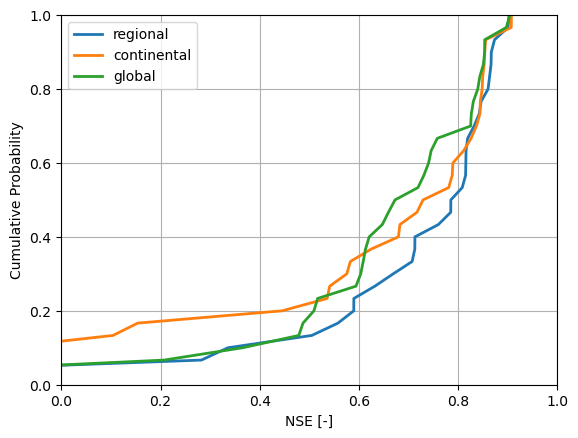

In [106]:
# Remove NaN values from the NSE columns before sorting
nse_values_1 = np.sort(data_diff_cal_complete2["nse_bfi_r1"].dropna())
nse_values_2 = np.sort(data_diff_cal_complete2["nse_bfi_c1"].dropna())
nse_values_3 = np.sort(data_diff_cal_complete2["nse_bfi_g1"].dropna())

# Compute cumulative distribution correctly
cumulative_1 = np.arange(1, len(nse_values_1) + 1) / len(nse_values_1)
cumulative_2 = np.arange(1, len(nse_values_2) + 1) / len(nse_values_2)
cumulative_3 = np.arange(1, len(nse_values_3) + 1) / len(nse_values_3)

# Plot cumulative distributions
plt.plot(nse_values_1, cumulative_1, label="regional", linewidth=2)
plt.plot(nse_values_2, cumulative_2, label="continental", linewidth=2)
plt.plot(nse_values_3, cumulative_3, label="global", linewidth=2)

# Labels and legend
plt.xlabel("NSE [-]")
plt.xlim(-0.0, 1)
plt.ylim(0, 1)

plt.ylabel("Cumulative Probability")
#plt.title("Cumulative Distribution of NSE Value BFI")
plt.legend()
plt.grid()

# Show plot
plt.show()


#### Validation

In [108]:
path_inputs = '../data/models/input/subset_1988_2001'

inputs = np.load(path_inputs+'//inputs.npy', allow_pickle=True).item()
observations = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
areas = np.load(path_inputs+'//areas.npy', allow_pickle=True).item()
perm_areas = np.load(path_inputs+'//perm_areas.npy', allow_pickle=True).item()
perm_areascontinental = np.load(path_inputs+'//perm_areascontinental.npy', allow_pickle=True).item()
perm_areasglobal = np.load(path_inputs+'//perm_areasglobal.npy', allow_pickle=True).item()
quality_masks = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()
rootdepth_mean = np.load(path_inputs+'//rootdepth_mean.npy', allow_pickle=True).item()
waterdeficit_mean= np.load(path_inputs+'//waterdeficit_mean.npy', allow_pickle=True).item()

output_regional_val2 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_r_2, perm_areas_model = perm_areas)
output_continental_val2 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_c_2, perm_areas_model = perm_areascontinental)
output_global_val2 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_g_2, perm_areas_model = perm_areasglobal)

path_inputs = '../data/models/input/subset_2001_2015'

inputs = np.load(path_inputs+'//inputs.npy', allow_pickle=True).item()
observations = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
areas = np.load(path_inputs+'//areas.npy', allow_pickle=True).item()
perm_areas = np.load(path_inputs+'//perm_areas.npy', allow_pickle=True).item()
perm_areascontinental = np.load(path_inputs+'//perm_areascontinental.npy', allow_pickle=True).item()
perm_areasglobal = np.load(path_inputs+'//perm_areasglobal.npy', allow_pickle=True).item()
quality_masks = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()
rootdepth_mean = np.load(path_inputs+'//rootdepth_mean.npy', allow_pickle=True).item()
waterdeficit_mean= np.load(path_inputs+'//waterdeficit_mean.npy', allow_pickle=True).item()

output_regional_01152 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_r_2_8801, perm_areas_model = perm_areas)
output_continental_01152 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_c_2_8801, perm_areas_model = perm_areascontinental)
output_global_01152 = run_model_superflexpy(catchments_ids = catchments_ids, best_params_dict_model = best_params_dict_model_g_2_8801, perm_areas_model = perm_areasglobal)

In [109]:
output_regional_val_c2 = {
    key: [np.concatenate([output_regional_val2[key][0], output_regional_01152[key][0]])]
    for key in output_regional_01152
    if key in output_regional_val2  # ensures keys match
}

output_continental_val_c2 = {
    key: [np.concatenate([output_continental_val2[key][0], output_continental_01152[key][0]])]
    for key in output_continental_val2
    if key in output_continental_01152  # ensures keys match
}

output_global_val_c2 = {
    key: [np.concatenate([output_global_val2[key][0], output_global_01152[key][0]])]
    for key in output_global_val2
    if key in output_global_01152  # ensures keys match
}

In [110]:
nse_results_cal_r_2_100_complete_val = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2015-09-30', freq='D'), output_regional_val_c2, observations_cal, quality_masks_cal)
nse_results_cal_c_2_100_complete_val = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2015-09-30', freq='D'), output_continental_val_c2, observations_cal, quality_masks_cal)
nse_results_cal_g_2_100_complete_val = generate_nse_results(catchments_ids, pd.date_range('1988-10-01', '2015-09-30', freq='D'), output_global_val_c2, observations_cal, quality_masks_cal)

In [134]:
data_diff_val_complete2 = pd.DataFrame(data=nse_results_cal_r_2_100_complete_val.nse - nse_results_cal_c_2_100_complete_val.nse)
data_diff_val_complete2["nse_rg"] = nse_results_cal_r_2_100_complete_val.nse - nse_results_cal_g_2_100_complete_val.nse

data_diff_val_complete2.index = nse_results_cal_c_2_100_complete_val.basin

data_diff_val_complete2 = data_diff_val_complete2.loc[~data_diff_val_complete2.index.isin(list_cal)]

data_diff_val_complete2["nse_r1"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).nse
data_diff_val_complete2["nse_c1"] = nse_results_cal_c_2_100_complete_val.set_index("basin", inplace = False).nse
data_diff_val_complete2["nse_g1"] = nse_results_cal_g_2_100_complete_val.set_index("basin", inplace = False).nse

data_diff_val_complete2["nse_bfi_r1"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).nse_value_bfi
data_diff_val_complete2["nse_bfi_c1"] = nse_results_cal_c_2_100_complete_val.set_index("basin", inplace = False).nse_value_bfi
data_diff_val_complete2["nse_bfi_g1"] = nse_results_cal_g_2_100_complete_val.set_index("basin", inplace = False).nse_value_bfi

data_diff_val_complete2["bfi_obs"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).bfi_obs
data_diff_val_complete2["bfi_r1"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).bfi_sim
data_diff_val_complete2["bfi_c1"] = nse_results_cal_c_2_100_complete_val.set_index("basin", inplace = False).bfi_sim
data_diff_val_complete2["bfi_g1"] = nse_results_cal_g_2_100_complete_val.set_index("basin", inplace = False).bfi_sim

data_diff_val_complete2["qmean_obs"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).qmean_obs
data_diff_val_complete2["qmean_r1"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).qmean_sim
data_diff_val_complete2["qmean_c1"] = nse_results_cal_c_2_100_complete_val.set_index("basin", inplace = False).qmean_sim
data_diff_val_complete2["qmean_g1"] = nse_results_cal_g_2_100_complete_val.set_index("basin", inplace = False).qmean_sim

data_diff_val_complete2["slope_obs"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).slope_obs
data_diff_val_complete2["slope_r1"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).slope_sim
data_diff_val_complete2["slope_c1"] = nse_results_cal_c_2_100_complete_val.set_index("basin", inplace = False).slope_sim
data_diff_val_complete2["slope_g1"] = nse_results_cal_g_2_100_complete_val.set_index("basin", inplace = False).slope_sim

data_diff_val_complete2["hfd_obs"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).hfd_obs
data_diff_val_complete2["hfd_r1"] = nse_results_cal_r_2_100_complete_val.set_index("basin", inplace = False).hfd_sim
data_diff_val_complete2["hfd_c1"] = nse_results_cal_c_2_100_complete_val.set_index("basin", inplace = False).hfd_sim
data_diff_val_complete2["hfd_g1"] = nse_results_cal_g_2_100_complete_val.set_index("basin", inplace = False).hfd_sim


data_diff_val_complete2 = data_diff_val_complete2[data_diff_val_complete2.nse_r1 > -10.0]
data_diff_val_complete2




,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,-0.005718,0.355179,0.821671,0.827389,0.466492,NaN,NaN,NaN,0.515742,0.571076,...,1.229881,1.190466,3.400558,2.868569,3.061155,1.599769,126.294118,135.352941,132.058824,163.529412
BEWA0067,-0.009087,0.261289,0.755194,0.764281,0.493905,NaN,NaN,NaN,0.446878,0.555953,...,1.289278,1.264698,3.527884,2.914973,3.098414,1.715402,123.437500,136.937500,133.937500,158.187500
BEWA0106,-0.024381,0.494743,0.750625,0.775006,0.255882,NaN,NaN,NaN,0.496805,0.571488,...,1.026590,0.976160,4.063631,2.857153,3.179807,1.408204,127.000000,136.086957,133.043478,173.478261
BEWA0107,0.010143,0.427166,0.761236,0.751093,0.334070,NaN,NaN,NaN,0.565063,0.555682,...,1.408629,1.316139,3.418299,2.874452,3.142920,1.562104,133.588235,139.411765,135.470588,175.529412
BEWA0119,-0.002562,0.319474,0.804388,0.806950,0.484914,NaN,NaN,NaN,0.508101,0.565601,...,1.308257,1.251409,3.336434,2.884838,3.082609,1.748002,123.266667,134.800000,130.933333,160.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,-0.008877,0.594414,0.808341,0.817218,0.213927,NaN,NaN,NaN,0.516853,0.571037,...,0.906454,0.889642,4.331634,2.747176,2.931268,1.237538,121.769231,129.923077,129.461538,174.846154
LU000016,0.032608,0.082443,0.612132,0.579524,0.529689,NaN,NaN,NaN,0.564940,0.555008,...,0.638566,0.644934,2.005883,2.862135,3.078900,3.457008,133.615385,130.461538,129.923077,127.000000
LU000017,0.003530,0.087533,0.834798,0.831269,0.747265,NaN,NaN,NaN,0.572433,0.610980,...,0.787699,0.785198,2.459555,2.438855,2.459436,1.693942,127.307692,134.307692,134.538462,147.230769


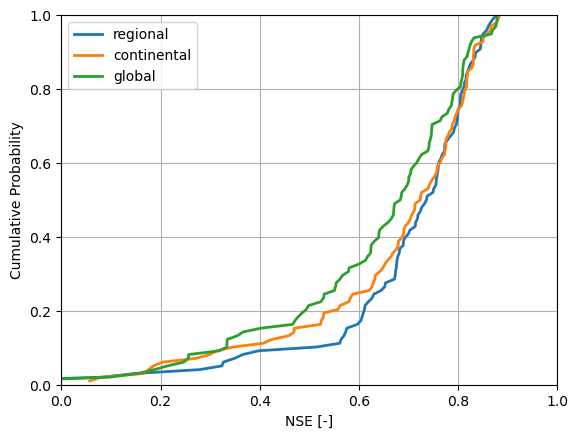

In [135]:
# Remove NaN values from the NSE columns before sorting
nse_values_1 = np.sort(data_diff_val_complete2["nse_r1"].dropna())
nse_values_2 = np.sort(data_diff_val_complete2["nse_c1"].dropna())
nse_values_3 = np.sort(data_diff_val_complete2["nse_g1"].dropna())

# Compute cumulative distribution correctly
cumulative_1 = np.arange(1, len(nse_values_1) + 1) / len(nse_values_1)
cumulative_2 = np.arange(1, len(nse_values_2) + 1) / len(nse_values_2)
cumulative_3 = np.arange(1, len(nse_values_3) + 1) / len(nse_values_3)

# Plot cumulative distributions
plt.plot(nse_values_1, cumulative_1, label="regional", linewidth=2)
plt.plot(nse_values_2, cumulative_2, label="continental", linewidth=2)
plt.plot(nse_values_3, cumulative_3, label="global", linewidth=2)

# Labels and legend
plt.xlabel("NSE [-]")
plt.xlim(-0.0, 1)
plt.ylim(0, 1)

plt.ylabel("Cumulative Probability")
#plt.title("Cumulative Distribution of NSE Value BFI")
plt.legend()
plt.grid()

# Show plot
plt.show()

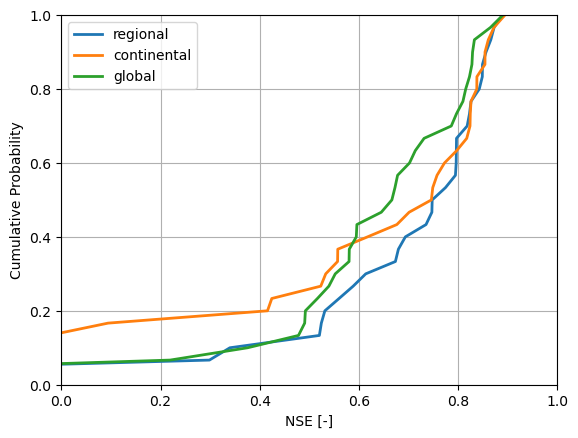

In [115]:
# Remove NaN values from the NSE columns before sorting
nse_values_1 = np.sort(data_diff_val_complete2["nse_bfi_r1"].dropna())
nse_values_2 = np.sort(data_diff_val_complete2["nse_bfi_c1"].dropna())
nse_values_3 = np.sort(data_diff_val_complete2["nse_bfi_g1"].dropna())

# Compute cumulative distribution correctly
cumulative_1 = np.arange(1, len(nse_values_1) + 1) / len(nse_values_1)
cumulative_2 = np.arange(1, len(nse_values_2) + 1) / len(nse_values_2)
cumulative_3 = np.arange(1, len(nse_values_3) + 1) / len(nse_values_3)

# Plot cumulative distributions
plt.plot(nse_values_1, cumulative_1, label="regional", linewidth=2)
plt.plot(nse_values_2, cumulative_2, label="continental", linewidth=2)
plt.plot(nse_values_3, cumulative_3, label="global", linewidth=2)

# Labels and legend
plt.xlabel("NSE [-]")
plt.xlim(-0.0, 1)
plt.ylim(0, 1)

plt.ylabel("Cumulative Probability")
#plt.title("Cumulative Distribution of NSE Value BFI")
plt.legend()
plt.grid()

# Show plot
plt.show()

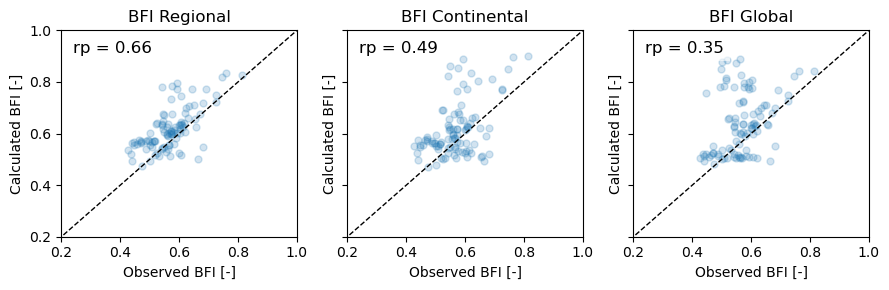

In [117]:
# Set figure and axes
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)

# List of variables
variables = ['bfi_r1', 'bfi_c1', 'bfi_g1']
titles = ['BFI Regional', 'BFI Continental', 'BFI Global']

# Loop over each subplot clearly
for ax, var, title in zip(axs, variables, titles):
    
    x = data_diff_val_complete2["bfi_obs"]
    y = data_diff_val_complete2[var]

    ax.scatter(x, y, alpha=0.2, s=25)

    # Plot the 1:1 line
    ax.plot([0, 1], [0, 1], 'k--', linewidth=1)

    # Set labels and title
    ax.set_xlabel("Observed BFI [-]")
    ax.set_ylabel("Calculated BFI [-]")
    ax.set_title(title)
    ax.set_xlim(0.2, 1.0)
    ax.set_ylim(0.2, 1.0)

    # Compute Pearson correlation coefficient (R)
    R = np.corrcoef(x, y=data_diff_val_complete2[var])[0, 1]

    # Annotate R clearly on plot (top-left corner)
    ax.text(
        0.05, 0.95, f'rp = {R:.2f}', transform=ax.transAxes,
        fontsize=12, verticalalignment='top', horizontalalignment='left',
        bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
    )

# Adjust layout
plt.tight_layout()
plt.show()

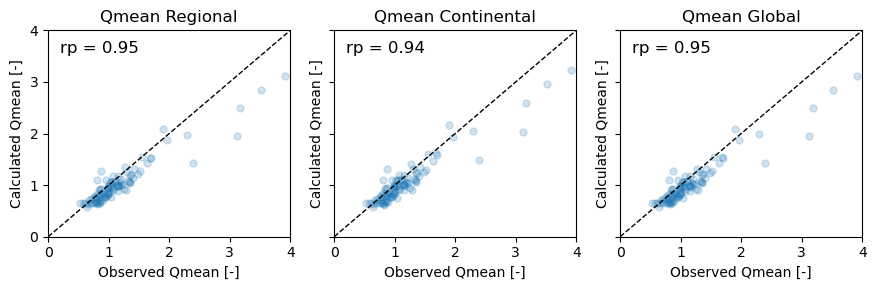

In [119]:
# Set figure and axes
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)

# List of variables
variables = ['qmean_r1', 'qmean_c1', 'qmean_g1']
titles = ['Qmean Regional', 'Qmean Continental', 'Qmean Global']

# Loop over each subplot clearly
for ax, var, title in zip(axs, variables, titles):
    
    x = data_diff_val_complete2["qmean_obs"]
    y = data_diff_val_complete2[var]

    ax.scatter(x, y, alpha=0.2, s=25)

    # Plot the 1:1 line
    ax.plot([0, 4], [0, 4], 'k--', linewidth=1)

    # Set labels and title
    ax.set_xlabel("Observed Qmean [-]")
    ax.set_ylabel("Calculated Qmean [-]")
    ax.set_title(title)
    ax.set_xlim(0.0, 4.0)
    ax.set_ylim(0.0, 4.0)

    # Compute Pearson correlation coefficient (R)
    R = np.corrcoef(x, y=data_diff_val_complete2[var])[0, 1]

    # Annotate R clearly on plot (top-left corner)
    ax.text(
        0.05, 0.95, f'rp = {R:.2f}', transform=ax.transAxes,
        fontsize=12, verticalalignment='top', horizontalalignment='left',
        bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
    )

# Adjust layout
plt.tight_layout()
plt.show()

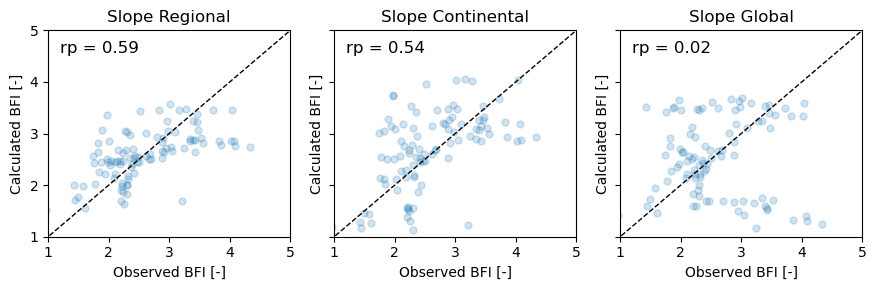

In [121]:
# Set figure and axes
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)

# List of variables
variables = ['slope_r1', 'slope_c1', 'slope_g1']
titles = ['Slope Regional', 'Slope Continental', 'Slope Global']

# Loop over each subplot clearly
for ax, var, title in zip(axs, variables, titles):
    
    x = data_diff_val_complete2["slope_obs"]
    y = data_diff_val_complete2[var]

    ax.scatter(x, y, alpha=0.2, s=25)

    # Plot the 1:1 line
    ax.plot([0, 5], [0, 5], 'k--', linewidth=1)

    # Set labels and title
    ax.set_xlabel("Observed BFI [-]")
    ax.set_ylabel("Calculated BFI [-]")
    ax.set_title(title)
    ax.set_xlim(1, 5.0)
    ax.set_ylim(1, 5.0)

    # Compute Pearson correlation coefficient (R)
    R = np.corrcoef(x, y=data_diff_val_complete2[var])[0, 1]

    # Annotate R clearly on plot (top-left corner)
    ax.text(
        0.05, 0.95, f'rp = {R:.2f}', transform=ax.transAxes,
        fontsize=12, verticalalignment='top', horizontalalignment='left',
        bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
    )

# Adjust layout
plt.tight_layout()
plt.show()

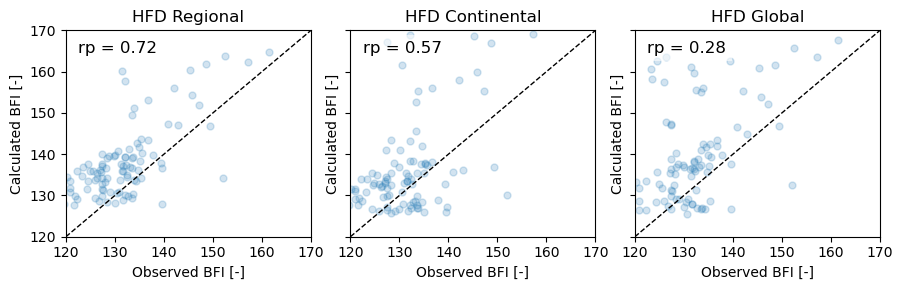

In [122]:
# Set figure and axes
fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)

# List of variables
variables = ['hfd_r1', 'hfd_c1', 'hfd_g1']
titles = ['HFD Regional', 'HFD Continental', 'HFD Global']

# Loop over each subplot clearly
for ax, var, title in zip(axs, variables, titles):
    
    x = data_diff_val_complete2["hfd_obs"]
    y = data_diff_val_complete2[var]

    ax.scatter(x, y, alpha=0.2, s=25)

    # Plot the 1:1 line
    ax.plot([120, 200], [120, 200], 'k--', linewidth=1)

    # Set labels and title
    ax.set_xlabel("Observed BFI [-]")
    ax.set_ylabel("Calculated BFI [-]")
    ax.set_title(title)
    ax.set_xlim(120, 170.0)
    ax.set_ylim(120, 170.0)

    # Compute Pearson correlation coefficient (R)
    R = np.corrcoef(x, y=data_diff_val_complete2[var])[0, 1]

    # Annotate R clearly on plot (top-left corner)
    ax.text(
        0.05, 0.95, f'rp = {R:.2f}', transform=ax.transAxes,
        fontsize=12, verticalalignment='top', horizontalalignment='left',
        bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
    )

# Adjust layout
plt.tight_layout()
plt.show()

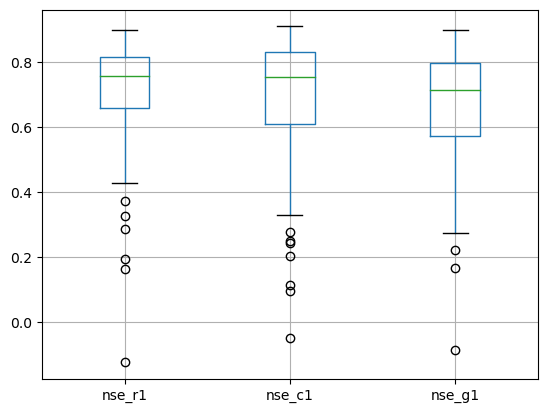

In [124]:


# Plot both columns side by side
data_diff_cal_complete2.boxplot(column=["nse_r1","nse_c1", "nse_g1"])

# Show the plot
plt.show()



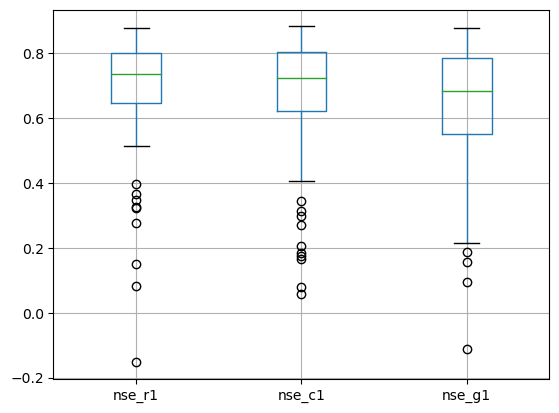

In [125]:


# Plot both columns side by side
data_diff_val_complete2.boxplot(column=["nse_r1","nse_c1", "nse_g1"])

# Show the plot
plt.show()



In [127]:
data_diff_val_complete2[data_diff_val_complete2.nse_r1 < 0.5]

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
basin,,,,,,,,,,,,,,,,,,,,,
DERP2013,-0.083075,-0.013097,0.083079,0.166154,0.096176,-0.585098,-0.408345,-0.554157,0.813898,0.827653,...,0.771586,0.778427,0.958560,1.524482,1.192806,1.417545,161.346154,164.807692,179.538462,167.653846
FR000183,-0.009516,-0.004917,0.397711,0.407226,0.402628,NaN,NaN,NaN,0.726346,0.747846,...,1.053525,1.040745,2.204864,1.898045,1.555593,1.833309,147.250000,151.958333,155.250000,152.041667
FR000184,0.180012,0.010754,0.365726,0.185714,0.354972,NaN,NaN,NaN,0.760768,0.832815,...,1.076194,1.069917,1.439657,1.711659,1.161932,1.601227,152.480000,163.760000,179.160000,165.840000
FR000185,0.147979,0.005401,0.323789,0.175810,0.318388,NaN,NaN,NaN,0.541713,0.779659,...,1.106566,1.096805,3.206302,1.692572,1.223568,1.651249,145.277778,160.444444,168.611111,160.833333
FR003250,0.070088,-0.005127,0.150458,0.080370,0.155585,NaN,NaN,NaN,0.680834,0.547678,...,1.490959,1.438213,1.818016,2.818138,3.039606,2.907354,152.040000,134.120000,130.080000,132.600000
FR003254,-0.019839,-0.007303,0.326564,0.346403,0.333867,NaN,NaN,NaN,0.723597,0.723494,...,0.901611,0.898634,1.571402,1.975920,1.441068,1.941028,148.625000,161.875000,167.000000,161.500000
FR003259,0.073407,-0.088387,0.278223,0.204816,0.366610,NaN,NaN,NaN,0.570623,0.732099,...,1.305717,1.279329,2.215223,2.042469,1.546628,2.545800,136.647059,153.176471,156.058824,143.411765
FR003280,0.050043,0.015513,0.349008,0.298965,0.333495,NaN,NaN,NaN,0.664153,0.501144,...,0.942279,0.919787,3.012886,3.564313,4.041586,3.689990,139.576923,127.807692,125.884615,126.769231
FR003306,-0.210191,-0.040751,-0.153152,0.057039,-0.112401,NaN,NaN,NaN,0.747143,0.818040,...,0.617547,0.630695,1.611967,1.551600,1.269791,1.468984,157.166667,162.388889,169.222222,163.611111


In [128]:
data_diff_val_complete2[data_diff_val_complete2.nse_g1 < 0.5]

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
basin,,,,,,,,,,,,,,,,,,,,,
BEWA0066,-0.005718,0.355179,0.821671,0.827389,0.466492,NaN,NaN,NaN,0.515742,0.571076,...,1.229881,1.190466,3.400558,2.868569,3.061155,1.599769,126.294118,135.352941,132.058824,163.529412
BEWA0067,-0.009087,0.261289,0.755194,0.764281,0.493905,NaN,NaN,NaN,0.446878,0.555953,...,1.289278,1.264698,3.527884,2.914973,3.098414,1.715402,123.437500,136.937500,133.937500,158.187500
BEWA0106,-0.024381,0.494743,0.750625,0.775006,0.255882,NaN,NaN,NaN,0.496805,0.571488,...,1.026590,0.976160,4.063631,2.857153,3.179807,1.408204,127.000000,136.086957,133.043478,173.478261
BEWA0107,0.010143,0.427166,0.761236,0.751093,0.334070,NaN,NaN,NaN,0.565063,0.555682,...,1.408629,1.316139,3.418299,2.874452,3.142920,1.562104,133.588235,139.411765,135.470588,175.529412
BEWA0119,-0.002562,0.319474,0.804388,0.806950,0.484914,NaN,NaN,NaN,0.508101,0.565601,...,1.308257,1.251409,3.336434,2.884838,3.082609,1.748002,123.266667,134.800000,130.933333,160.666667
DERP2013,-0.083075,-0.013097,0.083079,0.166154,0.096176,-0.585098,-0.408345,-0.554157,0.813898,0.827653,...,0.771586,0.778427,0.958560,1.524482,1.192806,1.417545,161.346154,164.807692,179.538462,167.653846
FR000183,-0.009516,-0.004917,0.397711,0.407226,0.402628,NaN,NaN,NaN,0.726346,0.747846,...,1.053525,1.040745,2.204864,1.898045,1.555593,1.833309,147.250000,151.958333,155.250000,152.041667
FR000184,0.180012,0.010754,0.365726,0.185714,0.354972,NaN,NaN,NaN,0.760768,0.832815,...,1.076194,1.069917,1.439657,1.711659,1.161932,1.601227,152.480000,163.760000,179.160000,165.840000
FR000185,0.147979,0.005401,0.323789,0.175810,0.318388,NaN,NaN,NaN,0.541713,0.779659,...,1.106566,1.096805,3.206302,1.692572,1.223568,1.651249,145.277778,160.444444,168.611111,160.833333


In [214]:
data_diff_val_complete2[["lon", "lat"]] = network_estreams[["lon", "lat"]]

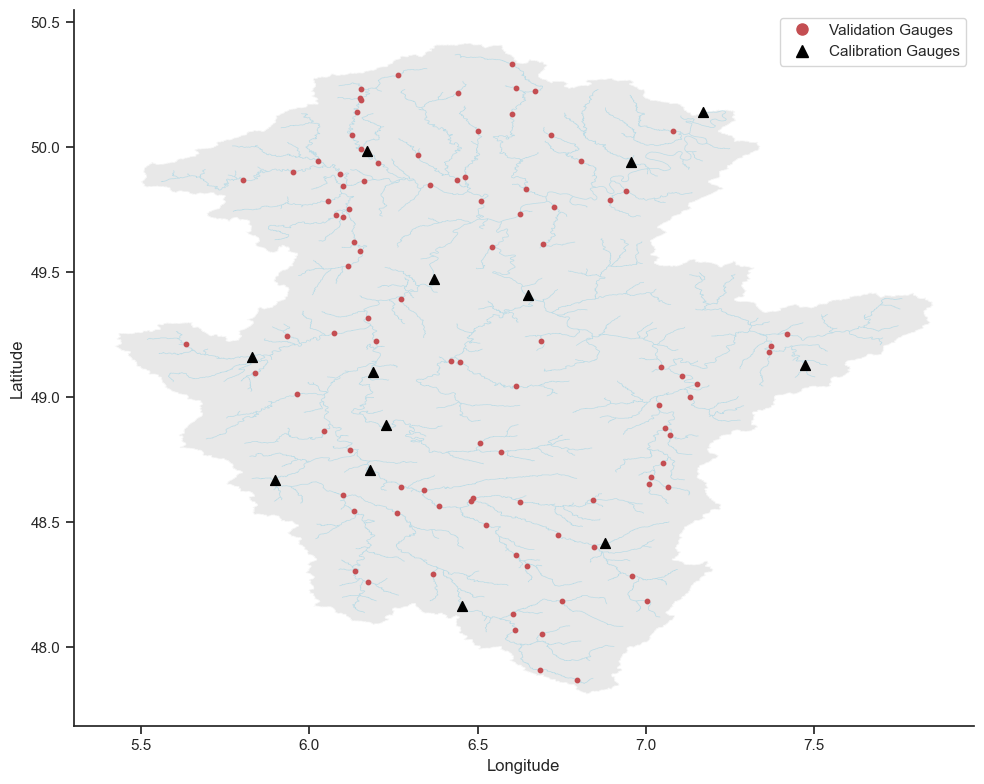

In [252]:
df = data_diff_val_complete2.copy()

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Set style
sns.set_theme(style="ticks")

# Custom colormap (red -> gray -> blue)
cmap_nse = LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, '#d35555'), (0.2, '#d8dadc'), (1, '#009ad8')]
)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
moselle.plot(ax=ax, color='lightgray', linewidth=1, alpha=0.5)
rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

ax.scatter(
    network_estreams.loc[list_cal, 'lon'],
    network_estreams.loc[list_cal, 'lat'],
    marker='^',        # triangle
    color='black',     # black
    s=50,              # size of the triangle
    zorder=3,          # on top
    label='Calibrated Basins'
)

ax.scatter(
    df.loc[:, 'lon'],
    df.loc[:, 'lat'],
    marker='o',        # triangle
    color='r',     # black
    s=10,              # size of the triangle
    zorder=3,          # on top
    label='Calibrated Basins'
)

ax.set_aspect('auto')  # or 'equal' for 1:1 scale, but you want 'auto' (equal=False)

# Decorations
#plt.colorbar(sc, label="NSE", ax=ax)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
#ax.set_title("NSE Values by Location")
ax.grid(False)
sns.despine()


import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Circle for validation
validation_handle = mlines.Line2D([], [], color='r', marker='o', linestyle='None',
                                  markersize=8, label='Validation Gauges')

# Triangle for calibration
calibration_handle = mlines.Line2D([], [], color='black', marker='^', linestyle='None',
                                   markersize=8, label='Calibration Gauges')

# Add to legend
ax.legend(handles=[validation_handle, calibration_handle], loc='upper right')



plt.tight_layout()
plt.show()


In [ ]:
LU000016

In [251]:
perm_areasglobal

{'BEWA0066': [0.75, 0.25, 0.0],
 'BEWA0067': [0.64, 0.36, 0.0],
 'BEWA0087': [1.0, 0.0, 0.0],
 'BEWA0106': [1.0, 0.0, 0.0],
 'BEWA0107': [1.0, 0.0, 0.0],
 'BEWA0119': [0.75, 0.25, 0.0],
 'DEBU1956': [0.19, 0.73, 0.08],
 'DEBU1957': [0.33, 0.66, 0.01],
 'DEBU1958': [0.28, 0.68, 0.04],
 'DEBU1959': [0.31, 0.65, 0.04],
 'DERP2003': [0.5, 0.5, 0.0],
 'DERP2004': [0.59, 0.41, 0.0],
 'DERP2005': [0.0, 1.0, 0.0],
 'DERP2006': [0.0, 1.0, 0.0],
 'DERP2007': [0.07, 0.93, 0.0],
 'DERP2008': [0.01, 0.99, 0.0],
 'DERP2010': [0.23, 0.77, 0.0],
 'DERP2011': [0.23, 0.77, 0.0],
 'DERP2013': [0.92, 0.08, 0.0],
 'DERP2014': [0.67, 0.33, 0.0],
 'DERP2015': [0.49, 0.51, 0.0],
 'DERP2016': [0.32, 0.68, 0.0],
 'DERP2017': [0.74, 0.26, 0.0],
 'DERP2018': [0.75, 0.25, 0.0],
 'DERP2021': [0.02, 0.98, 0.0],
 'DERP2022': [0.14, 0.76, 0.1],
 'DERP2023': [0.14, 0.77, 0.09],
 'DERP2024': [0.3, 0.65, 0.05],
 'DERP2027': [0.18, 0.78, 0.04],
 'DERP2028': [0.79, 0.2, 0.01],
 'DERP2029': [0.75, 0.25, 0.0],
 'DERP2030': [

In [248]:
data_diff_val_complete.iloc[50:]

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1,lon,lat
basin,,,,,,,,,,,,,,,,,,,,,
FR003237,-0.010695,-0.025205,0.830886,0.841580,0.856091,0.845793,0.810661,0.859823,0.582925,0.573563,...,2.455219,2.656551,2.647317,2.619848,132.269231,129.038462,129.884615,131.346154,6.452981,48.165666
FR003239,0.009453,-0.003134,0.588980,0.579528,0.592114,NaN,NaN,NaN,0.541757,0.624275,...,1.733716,2.572342,2.804096,2.512157,127.391304,133.130435,129.086957,133.521739,6.367100,48.292520
FR003241,-0.007894,-0.027964,0.837770,0.845664,0.865734,NaN,NaN,NaN,0.572007,0.591357,...,2.665677,2.601466,2.564830,2.552515,127.500000,127.045455,127.954545,129.000000,6.260215,48.536107
FR003246,0.015625,0.018337,0.752508,0.736883,0.734171,NaN,NaN,NaN,0.470773,0.550802,...,2.979324,3.181073,2.780996,3.241284,120.840000,127.440000,130.720000,127.040000,6.131546,48.545356
FR003249,-0.000189,-0.011399,0.865700,0.865889,0.877099,NaN,NaN,NaN,0.579674,0.597453,...,2.729270,2.721966,2.555754,2.670418,128.307692,129.653846,131.000000,130.884615,5.896402,48.669764
FR003250,-0.084235,-0.155093,0.094741,0.178975,0.249834,NaN,NaN,NaN,0.680834,0.526290,...,1.818016,2.954627,2.715800,2.650297,152.040000,128.280000,131.240000,131.800000,7.002529,48.184730
FR003251,0.067694,-0.014822,0.783474,0.715780,0.798296,NaN,NaN,NaN,0.628729,0.654936,...,2.109643,2.213135,2.603438,2.187480,137.863636,135.636364,129.590909,137.136364,6.845062,48.402032
FR003252,0.055869,-0.021724,0.675042,0.619172,0.696766,NaN,NaN,NaN,0.669344,0.675448,...,2.087440,2.098826,2.495875,2.182795,149.333333,143.333333,137.416667,143.583333,6.738613,48.449237
FR003254,-0.071523,-0.024247,0.395169,0.466692,0.419416,NaN,NaN,NaN,0.723597,0.725719,...,1.571402,1.875206,1.556467,1.926381,148.625000,158.500000,160.625000,157.375000,6.843861,48.588049


# Further analysis

In [305]:
estreams_attributes_clipped_filters[estreams_attributes_clipped_filters.q_runoff_ratio<0.3]

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_high_glob2,perm_medium_glob2,perm_low_glob2
basin_id,,,,,,,,,,,,,,,,,,,,,
BEWA0087,56100000,Martelange,BE,BE_SPW,Sure,5.739269,49.833704,5.739269,49.833704,NaN,...,6.106,0.000,0.000,6.0,0.0,0.0,100.0,100.0,0.0,0.0
FR000174,A812200001,A8122000,FR,FR_EAUFRANCE,L'Yron à Hannonville-Suzémont,5.837081,49.098776,5.837081,49.098776,197,...,2.131,0.070,0.040,2.0,0.0,100.0,0.0,1.0,99.0,0.0
FR003259,A664031002,L'ArentÃƒÂ¨le ÃƒÂ Saint-Gorgon et ÃƒÂ Sainte...,FR,FR_EAUFRANCE,L'Arentèle à Saint-Gorgon et à Sainte-Hélène,6.645964,48.324169,6.645964,48.324169,295,...,3.622,0.011,0.009,2.0,66.0,34.0,0.0,35.0,65.0,0.0
FR003266,A712201001,L'Esch Ã Jezainville,FR,FR_EAUFRANCE,L'Esch à Jezainville,6.043284,48.866376,6.043284,48.866376,182,...,2.120,0.025,0.057,2.0,0.0,100.0,0.0,0.0,100.0,0.0


In [308]:
data_diff_cal_complete.loc[["FR000174", "FR003259", "FR003266"]]

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
basin,,,,,,,,,,,,,,,,,,,,,
FR000174,0.030850,-0.000239,0.591608,0.560758,0.591847,NaN,NaN,NaN,0.437861,0.507505,...,0.720963,0.730438,3.730071,3.480109,4.070957,3.285338,117.923077,129.769231,130.000000,131.000000
FR003259,-0.032133,-0.111755,0.256759,0.288892,0.368514,NaN,NaN,NaN,0.570623,0.748932,...,1.313141,1.307574,2.215223,1.854404,1.809174,2.474283,136.647059,152.117647,151.764706,141.411765
FR003266,-0.010001,0.047898,0.542852,0.552853,0.494954,NaN,NaN,NaN,0.567523,0.488606,...,0.690247,0.696934,4.039029,3.712760,3.667047,3.430468,130.000000,124.363636,126.681818,126.681818


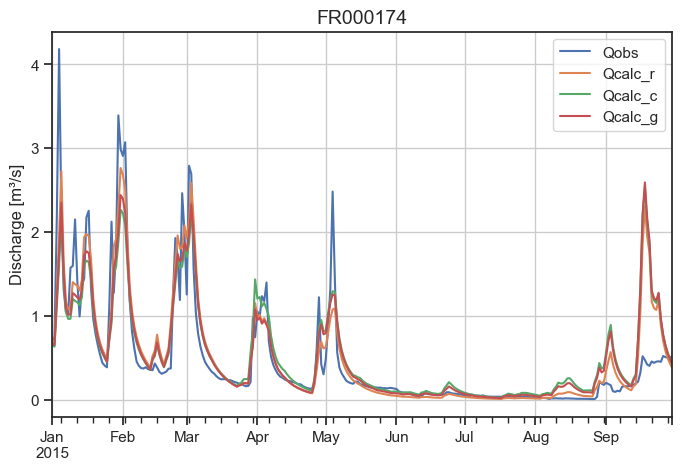

In [312]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="FR000174"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["2015"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

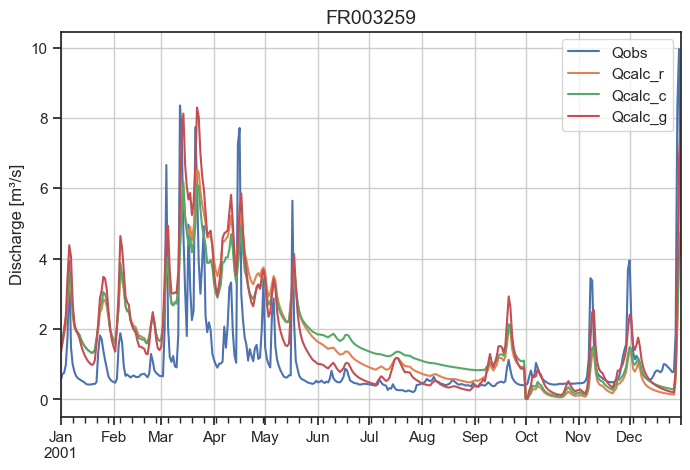

In [317]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="FR003259"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["2001"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

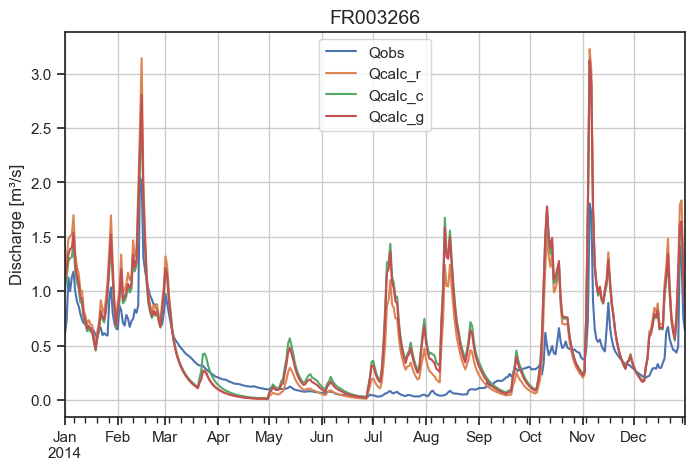

In [319]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="FR003266"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["2014"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

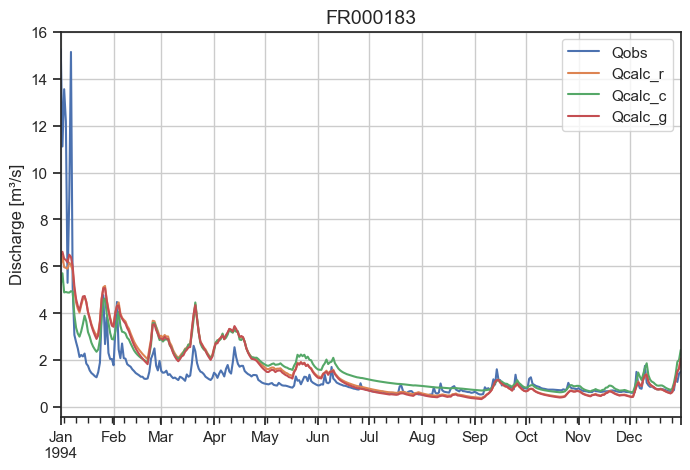

In [334]:
Qtimeseries = pd.DataFrame(index = pd.date_range('10-01-1988','09-30-2015', freq='D'))

gauge_id="FR000183"

Qtimeseries["Qobs"] = observations_cal[gauge_id]
Qtimeseries["Qcalc_r"] = output_regional_val_c[gauge_id][0]
Qtimeseries["Qcalc_c"] = output_continental_val_c[gauge_id][0]
Qtimeseries["Qcalc_g"] = output_global_val_c[gauge_id][0]

1 - obj_fun_nsee(observations = Qtimeseries.iloc[365:, 0].values, simulation = Qtimeseries.iloc[365:, 1].values, expo = 0.5)

fig, ax = plt.subplots(figsize=(8, 5))

Qtimeseries.loc["1994"].plot(ax=ax)

# Add title with gauge ID
ax.set_title(f"{gauge_id}", fontsize=14)

# Add labels if you want
ax.set_ylabel("Discharge [m³/s]")
#ax.set_xlabel("Date")
ax.grid(True)

In [335]:
list_cal

['FR000184',
 'DERP2017',
 'DERP2011',
 'DERP2013',
 'DERP2007',
 'DERP2024',
 'FR003253',
 'FR003283',
 'FR003301',
 'DERP2003',
 'FR003265',
 'FR003272',
 'DEBU1958']

In [336]:
nse_results_cal_r_1_100[nse_results_cal_r_1_100.basin == gauge_id]

,gauge_name,basin,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
51,A9001050,FR000183,0.813653,0.701242,0.744249,NaN,1.099647,1.045212,1.964987,1.973349,146.272727,149.363636


In [337]:
nse_results_cal_r_1_100

,gauge_name,basin,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
0,Reuland,BEWA0066,0.848794,0.514795,0.548222,0.864637,1.238351,1.163753,3.347668,2.688420,125.769231,131.846154
1,Schoenberg,BEWA0067,0.802846,0.448057,0.530274,0.815041,1.412586,1.264227,3.448610,2.755547,122.307692,131.846154
2,Martelange,BEWA0087,-19.559708,0.715474,0.514520,NaN,0.196649,1.218498,1.740044,2.755850,149.666667,125.416667
3,Reuland,BEWA0106,0.771835,0.481832,0.549566,NaN,1.011804,0.901341,4.246454,2.674293,126.153846,132.769231
4,Lommersweiler,BEWA0107,0.733169,0.569622,0.545603,NaN,1.142034,1.248445,3.281075,2.697986,131.250000,134.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
107,Michelau,LU000015,0.780712,0.524064,0.544619,0.828639,1.040332,1.017226,4.286267,2.764151,121.769231,128.615385
108,Pfaffenthal,LU000016,0.672278,0.567054,0.549926,0.446167,0.801764,0.740183,2.023796,2.837984,133.615385,130.846154
109,Rosport,LU000017,0.865073,0.577206,0.593668,0.885683,0.935842,0.893069,2.468492,2.448700,127.307692,133.000000
110,Schoenfels,LU000018,0.630301,0.549042,0.658087,0.512632,0.876011,0.789524,2.255653,2.105457,127.384615,139.461538


# Visualization of the params

In [46]:
import re

def is_valid_key(k):
    # Exclude keys that end in Group_X_2
    return not re.search(r'Group_\d+_2$', k)

def is_valid_key_2(k):
    # Include only keys that end in Group_X_2
    return re.search(r'Group_\d+_2$', k)

In [47]:
import os
import glob

# Dictionary to store all parameter dicts
all_param_dicts = {}

# Loop through all CSVs in the current directory
for filepath in glob.glob("../results/groups/*moselle*comp*.csv"):
    file_key = os.path.splitext(os.path.basename(filepath))[0]  # Strip .csv
    
    param_dict = {}

    # Read file and parse lines
    with open(filepath, 'r') as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith(","):  # Skip empty or malformed lines
                continue
            parts = line.split(",")
            if len(parts) == 2:
                key, value = parts
                try:
                    param_dict[key] = float(value)
                except ValueError:
                    pass  # Skip lines where value is not a float
            else:
                pass  # Skip malformed lines

    # Store the parsed dictionary
    all_param_dicts[file_key] = param_dict


In [48]:
regional_keys_2 = [k for k in all_param_dicts if "regi" in k and is_valid_key_2(k)]
continental_keys_2 = [k for k in all_param_dicts if "cont" in k and is_valid_key_2(k)]
global_keys_2 = [k for k in all_param_dicts if "glob" in k and is_valid_key_2(k)]


In [49]:
regional_keys_1 = [k for k in all_param_dicts if "regi" in k and is_valid_key(k)]
continental_keys_1 = [k for k in all_param_dicts if "cont" in k and is_valid_key(k)]
global_keys_1 = [k for k in all_param_dicts if "glob" in k and is_valid_key(k)]

In [50]:
dfs=[]
for key in regional_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_2 = pd.concat(dfs)
regional_params_2.high_snow_k = 1/regional_params_2.high_snow_k
regional_params_2.high_slow_k = 1/regional_params_2.high_slow_k
regional_params_2.high_fast_k = 1/regional_params_2.high_fast_k
regional_params_2.general_snow_k = 1/regional_params_2.general_snow_k
regional_params_2.general_slow_k = 1/regional_params_2.general_slow_k
regional_params_2.general_fast_k = 1/regional_params_2.general_fast_k
regional_params_2.low_snow_k = 1/regional_params_2.low_snow_k
regional_params_2.low_slow_k = 1/regional_params_2.low_slow_k
regional_params_2.low_fast_k = 1/regional_params_2.low_fast_k

dfs=[]
for key in regional_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_1 = pd.concat(dfs)
regional_params_1.high_snow_k = 1/regional_params_1.high_snow_k
regional_params_1.high_slow_k = 1/regional_params_1.high_slow_k
regional_params_1.high_fast_k = 1/regional_params_1.high_fast_k
regional_params_1.general_snow_k = 1/regional_params_1.general_snow_k
regional_params_1.general_slow_k = 1/regional_params_1.general_slow_k
regional_params_1.general_fast_k = 1/regional_params_1.general_fast_k
regional_params_1.low_snow_k = 1/regional_params_1.low_snow_k
regional_params_1.low_slow_k = 1/regional_params_1.low_slow_k
regional_params_1.low_fast_k = 1/regional_params_1.low_fast_k

regional_params_1

,high_snow_k,high_unsaturated_Smax,high_unsaturated_Ce,high_unsaturated_beta,high_lowersplitter_splitpar,high_slow_k,high_lag-fun_lag-time,high_fast_k,general_snow_k,general_unsaturated_Smax,...,general_lag-fun_lag-time,general_fast_k,low_snow_k,low_unsaturated_Smax,low_unsaturated_Ce,low_unsaturated_beta,low_lowersplitter_splitpar,low_slow_k,low_lag-fun_lag-time,low_fast_k
0,0.339948,123.550093,0.764848,2.316849,0.616640,481.216858,2.035121,331.087394,0.339948,123.550093,...,2.035121,29.899827,0.339948,123.550093,0.764848,2.316849,0.331856,11.912578,2.035121,32.202776
0,0.364328,121.526910,0.762403,2.401420,0.693623,490.773251,1.998690,96.975647,0.364328,121.526910,...,1.998690,23.795617,0.364328,121.526910,0.762403,2.401420,0.266680,16.961404,1.998690,84.677320
0,0.346792,127.321406,0.749946,2.249435,0.449088,410.594629,1.995418,531.315958,0.346792,127.321406,...,1.995418,37.418038,0.346792,127.321406,0.749946,2.249435,0.298026,16.883437,1.995418,82.512722
0,0.315002,126.428235,0.700266,3.061847,0.884068,273.217283,1.993162,2.700500,0.315002,126.428235,...,1.993162,52.312235,0.315002,126.428235,0.700266,3.061847,0.726554,10.234316,1.993162,6.352938
0,0.385650,143.310800,0.779519,2.386952,0.824092,444.903704,2.128160,2.039247,0.385650,143.310800,...,2.128160,44.397515,0.385650,143.310800,0.779519,2.386952,0.654370,10.972795,2.128160,14.866188
0,0.358641,130.728600,0.791150,2.060613,0.529052,882.543441,2.130810,616.049228,0.358641,130.728600,...,2.130810,32.846986,0.358641,130.728600,0.791150,2.060613,0.484139,10.450055,2.130810,29.301874
0,0.328474,124.055970,0.749512,1.954776,0.517091,516.443696,2.040960,399.849049,0.328474,124.055970,...,2.040960,70.876856,0.328474,124.055970,0.749512,1.954776,0.459895,49.303067,2.040960,54.248613


In [51]:
dfs=[]
for key in continental_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_2 = pd.concat(dfs)
continental_params_2.high_snow_k = 1/continental_params_2.high_snow_k
continental_params_2.high_slow_k = 1/continental_params_2.high_slow_k
continental_params_2.high_fast_k = 1/continental_params_2.high_fast_k
continental_params_2.general_snow_k = 1/continental_params_2.general_snow_k
continental_params_2.general_slow_k = 1/continental_params_2.general_slow_k
continental_params_2.general_fast_k = 1/continental_params_2.general_fast_k
continental_params_2.low_snow_k = 1/continental_params_2.low_snow_k
continental_params_2.low_slow_k = 1/continental_params_2.low_slow_k
continental_params_2.low_fast_k = 1/continental_params_2.low_fast_k

dfs=[]
for key in continental_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_1 = pd.concat(dfs)
continental_params_1.high_snow_k = 1/continental_params_1.high_snow_k
continental_params_1.high_slow_k = 1/continental_params_1.high_slow_k
continental_params_1.high_fast_k = 1/continental_params_1.high_fast_k
continental_params_1.general_snow_k = 1/continental_params_1.general_snow_k
continental_params_1.general_slow_k = 1/continental_params_1.general_slow_k
continental_params_1.general_fast_k = 1/continental_params_1.general_fast_k
continental_params_1.low_snow_k = 1/continental_params_1.low_snow_k
continental_params_1.low_slow_k = 1/continental_params_1.low_slow_k
continental_params_1.low_fast_k = 1/continental_params_1.low_fast_k

continental_params_2

,high_snow_k,high_unsaturated_Smax,high_unsaturated_Ce,high_unsaturated_beta,high_lowersplitter_splitpar,high_slow_k,high_lag-fun_lag-time,high_fast_k,general_snow_k,general_unsaturated_Smax,...,general_lag-fun_lag-time,general_fast_k,low_snow_k,low_unsaturated_Smax,low_unsaturated_Ce,low_unsaturated_beta,low_lowersplitter_splitpar,low_slow_k,low_lag-fun_lag-time,low_fast_k
0,0.406181,142.337130,0.989215,1.309709,0.487312,341.120805,1.993460,534.426657,0.406181,142.337130,...,1.993460,47.522709,0.406181,142.337130,0.989215,1.309709,0.331068,40.654198,1.993460,63.871081
0,0.428738,145.406964,0.931931,1.440335,0.641605,1298.440567,1.997099,162.066266,0.428738,145.406964,...,1.997099,51.423690,0.428738,145.406964,0.931931,1.440335,0.244777,15.843361,1.997099,96.643820
0,0.594094,160.003838,1.021613,1.151007,0.457242,356.886699,2.124266,323.837620,0.594094,160.003838,...,2.124266,50.798495,0.594094,160.003838,1.021613,1.151007,0.545561,19.509296,2.124266,30.212840
0,0.414207,159.777711,0.899771,1.490362,0.895903,375.482528,2.051974,14.735857,0.414207,159.777711,...,2.051974,57.326472,0.414207,159.777711,0.899771,1.490362,0.725397,10.773033,2.051974,24.063178
0,0.470732,149.490816,1.260205,0.959812,0.788995,310.013247,2.087202,4.575136,0.470732,149.490816,...,2.087202,69.158574,0.470732,149.490816,1.260205,0.959812,0.221848,57.353677,2.087202,137.284059
0,0.300590,162.305497,1.168430,1.212444,0.556103,287.881307,2.040640,227.189204,0.300590,162.305497,...,2.040640,62.748478,0.300590,162.305497,1.168430,1.212444,0.107879,52.207332,2.040640,86.655056
0,0.532997,147.281818,0.969870,1.206350,0.756880,355.876054,2.095688,3.325895,0.532997,147.281818,...,2.095688,141.464207,0.532997,147.281818,0.969870,1.206350,0.387947,111.612026,2.095688,134.604082


In [52]:
dfs=[]
for key in global_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_2 = pd.concat(dfs)
global_params_2.high_snow_k = 1/global_params_2.high_snow_k
global_params_2.high_slow_k = 1/global_params_2.high_slow_k
global_params_2.high_fast_k = 1/global_params_2.high_fast_k
global_params_2.general_snow_k = 1/global_params_2.general_snow_k
global_params_2.general_slow_k = 1/global_params_2.general_slow_k
global_params_2.general_fast_k = 1/global_params_2.general_fast_k
global_params_2.low_snow_k = 1/global_params_2.low_snow_k
global_params_2.low_slow_k = 1/global_params_2.low_slow_k
global_params_2.low_fast_k = 1/global_params_2.low_fast_k

dfs=[]
for key in global_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_1 = pd.concat(dfs)
global_params_1.high_snow_k = 1/global_params_1.high_snow_k
global_params_1.high_slow_k = 1/global_params_1.high_slow_k
global_params_1.high_fast_k = 1/global_params_1.high_fast_k
global_params_1.general_snow_k = 1/global_params_1.general_snow_k
global_params_1.general_slow_k = 1/global_params_1.general_slow_k
global_params_1.general_fast_k = 1/global_params_1.general_fast_k
global_params_1.low_snow_k = 1/global_params_1.low_snow_k
global_params_1.low_slow_k = 1/global_params_1.low_slow_k
global_params_1.low_fast_k = 1/global_params_1.low_fast_k

global_params_1

,high_snow_k,high_unsaturated_Smax,high_unsaturated_Ce,high_unsaturated_beta,high_lowersplitter_splitpar,high_slow_k,high_lag-fun_lag-time,high_fast_k,general_snow_k,general_unsaturated_Smax,...,general_lag-fun_lag-time,general_fast_k,low_snow_k,low_unsaturated_Smax,low_unsaturated_Ce,low_unsaturated_beta,low_lowersplitter_splitpar,low_slow_k,low_lag-fun_lag-time,low_fast_k
0,0.263775,121.792695,0.764024,2.422288,0.534666,728.251501,1.993199,262.130093,0.263775,121.792695,...,1.993199,39.619618,0.263775,121.792695,0.764024,2.422288,0.875842,120.149684,1.993199,1.683478
0,0.417049,118.598117,0.755744,2.980238,0.669594,562.385374,2.001336,76.201946,0.417049,118.598117,...,2.001336,31.913085,0.417049,118.598117,0.755744,2.980238,0.226697,18.446088,2.001336,377.646543
0,0.375215,148.358870,0.650398,4.649047,0.325405,626.385800,2.008956,381.300272,0.375215,148.358870,...,2.008956,37.162690,0.375215,148.358870,0.650398,4.649047,0.746139,12.202076,2.008956,1.009829
0,0.338556,129.599104,0.731704,3.291096,0.793925,269.950748,1.981996,13.101528,0.338556,129.599104,...,1.981996,51.708281,0.338556,129.599104,0.731704,3.291096,0.605961,10.511354,1.981996,148.963517
0,0.281726,140.471416,0.872088,1.501382,0.631044,529.015980,1.913164,51.771687,0.281726,140.471416,...,1.913164,53.413703,0.281726,140.471416,0.872088,1.501382,0.851252,10.333201,1.913164,3.780372
0,0.207184,130.718830,0.859041,1.570424,0.564327,288.340806,2.041436,184.873504,0.207184,130.718830,...,2.041436,40.699113,0.207184,130.718830,0.859041,1.570424,0.874414,44.232752,2.041436,1.009084
0,0.256286,126.458050,0.694831,2.552835,0.550318,275.147422,2.010927,431.905149,0.256286,126.458050,...,2.010927,65.498092,0.256286,126.458050,0.694831,2.552835,0.840695,45.390095,2.010927,2.267059


In [53]:
import warnings
warnings.filterwarnings("ignore")

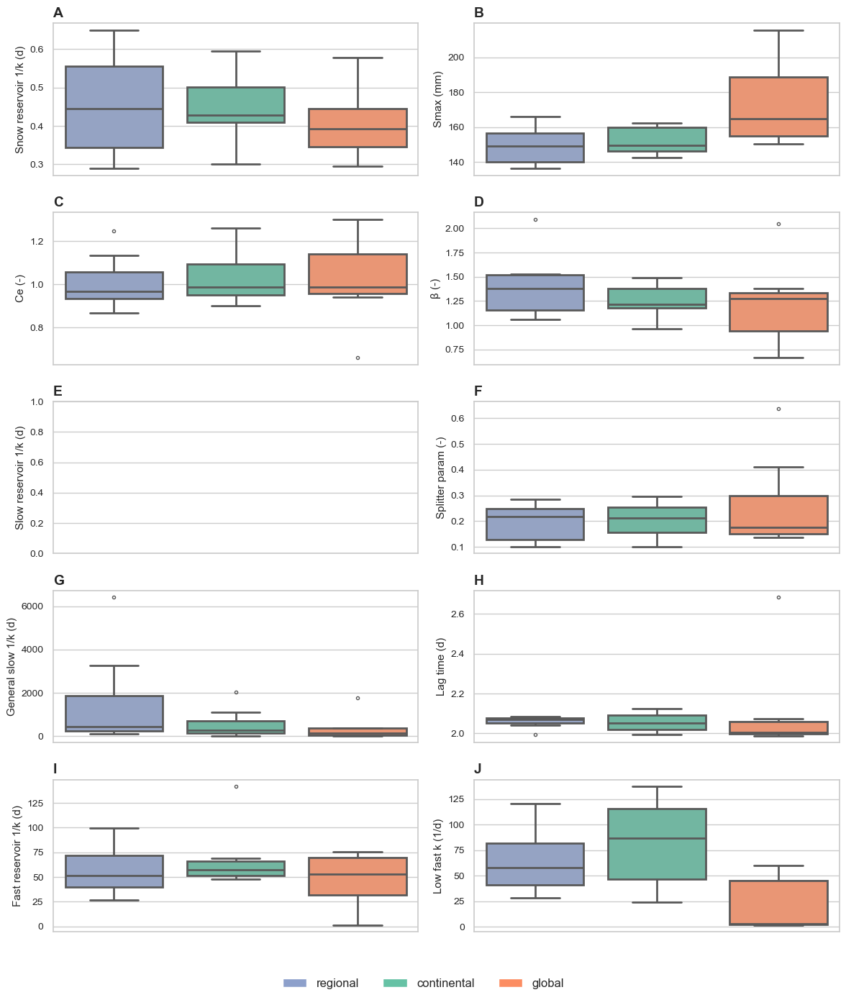

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch

subplot_titles = list("ABCDEFGHIJKLMNOPQRSTUVWXYZ")  # Enough for 26 variables


# Seaborn styling
sns.set_theme(style="whitegrid", font_scale=1.2)

# Prepare long-format data
def prepare_long_df(df, name):
    df_long = df.copy()
    df_long['source'] = name
    return df_long

regional_long = prepare_long_df(regional_params_2, 'regional')
continental_long = prepare_long_df(continental_params_2, 'continental')
global_long = prepare_long_df(global_params_2, 'global')

all_long = pd.concat([regional_long, continental_long, global_long], axis=0)
all_long = all_long.melt(id_vars='source', var_name='variable', value_name='value')

# Colors for groups
palette = {
    'regional': '#8da0cb',     # blue
    'continental': '#66c2a5',  # green
    'global': '#fc8d62'        # orange
}

# Variables to plot
variables = [
    'high_snow_k', 
    'high_unsaturated_Smax', 
    'high_unsaturated_Ce',
    'high_unsaturated_beta', 
    'high_slowhigh_k', 
    'general_lowersplitter_splitpar',
    'general_slow_k', 
    'general_lag-fun_lag-time', 
    'general_fast_k',
    'low_fast_k'
]


# Pretty labels for y-axes
pretty_labels = {
    'high_snow_k': 'Snow reservoir 1/k (d)',#
    'high_unsaturated_Smax': 'Smax (mm)',#
    'high_unsaturated_Ce': 'Ce (-)',#
    'high_unsaturated_beta': 'β (-)',#
    'high_slowhigh_k': 'Slow reservoir 1/k (d)',#
    'general_lowersplitter_splitpar': 'Splitter param (-)',#
    'general_slow_k': 'General slow 1/k (d)',#
    'general_lag-fun_lag-time': 'Lag time (d)',#
    'general_fast_k': 'Fast reservoir 1/k (d)',#
    'low_fast_k': 'Low fast k (1/d)'#
}

# Layout
ncols = 2
nrows = int(np.ceil(len(variables) / ncols))
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 14), sharey=False)
axes = axes.flatten()

# Plot
for i, var in enumerate(variables):
    ax = axes[i]
    sns.boxplot(
        data=all_long[all_long['variable'] == var],
        x='source', y='value',
        palette=palette,
        linewidth=2.0,
        fliersize=3,
        ax=ax
    )
    ax.set_title(subplot_titles[i], fontsize=14, weight='bold', loc="left")  # "A", "B", ...
    ax.set_xlabel('')
    ax.set_ylabel(pretty_labels.get(var, var), fontsize=11)
    ax.set_xticks([])  # remove x-axis group labels
    ax.tick_params(labelsize=10)

# Hide unused axes
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Custom legend
legend_elements = [
    Patch(facecolor=palette['regional'], label='regional'),
    Patch(facecolor=palette['continental'], label='continental'),
    Patch(facecolor=palette['global'], label='global')
]

fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=3,
    fontsize=12,
    frameon=False
)

plt.tight_layout(rect=[0, 0.05, 1, 1]) 
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\boxplots_params.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

In [55]:
regional_params_1.columns

Index(['high_snow_k', 'high_unsaturated_Smax', 'high_unsaturated_Ce',
       'high_unsaturated_beta', 'high_lowersplitter_splitpar', 'high_slow_k',
       'high_lag-fun_lag-time', 'high_fast_k', 'general_snow_k',
       'general_unsaturated_Smax', 'general_unsaturated_Ce',
       'general_unsaturated_beta', 'general_lowersplitter_splitpar',
       'general_slow_k', 'general_lag-fun_lag-time', 'general_fast_k',
       'low_snow_k', 'low_unsaturated_Smax', 'low_unsaturated_Ce',
       'low_unsaturated_beta', 'low_lowersplitter_splitpar', 'low_slow_k',
       'low_lag-fun_lag-time', 'low_fast_k'],
      dtype='object')

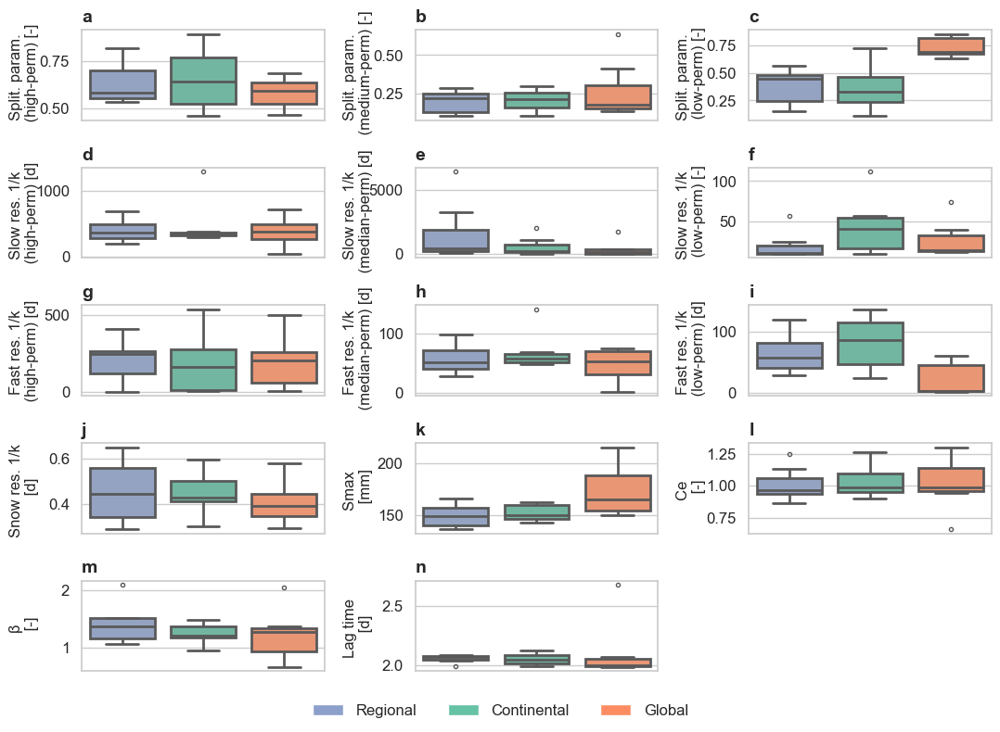

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch

subplot_titles = list("abcdefghijklmnopqrstu")  # Enough for 26 variables


# Seaborn styling
sns.set_theme(style="whitegrid", font_scale=1.2)

# Prepare long-format data
def prepare_long_df(df, name):
    df_long = df.copy()
    df_long['source'] = name
    return df_long

regional_long = prepare_long_df(regional_params_2, 'Regional')
continental_long = prepare_long_df(continental_params_2, 'Continental')
global_long = prepare_long_df(global_params_2, 'Global')

all_long = pd.concat([regional_long, continental_long, global_long], axis=0)
all_long = all_long.melt(id_vars='source', var_name='variable', value_name='value')

# Colors for groups
palette = {
    'Regional': '#8da0cb',     # blue
    'Continental': '#66c2a5',  # green
    'Global': '#fc8d62'        # orange
}

# Variables to plot
variables = [

    'high_lowersplitter_splitpar', 
    'general_lowersplitter_splitpar',
    'low_lowersplitter_splitpar',

    'high_slow_k',
    'general_slow_k',
    'low_slow_k',
    
    'high_fast_k', 
    'general_fast_k',
    'low_fast_k',

    'high_snow_k', 
    'high_unsaturated_Smax', 
    'high_unsaturated_Ce',
    'high_unsaturated_beta', 
    'high_lag-fun_lag-time',
    ]


# Pretty labels for y-axes
pretty_labels = {
    'general_lowersplitter_splitpar': 'Split. param. \n (medium-perm) [-]',#
    'high_lowersplitter_splitpar': 'Split. param. \n (high-perm) [-]',#
    'low_lowersplitter_splitpar': 'Split. param. \n (low-perm) [-]',#
    'high_fast_k': 'Fast res. 1/k \n (high-perm) [d] ',#
    'high_slow_k': 'Slow res. 1/k \n (high-perm) [d] ',#
    'general_slow_k': 'Slow res. 1/k \n (median-perm) [d]',#
    'general_fast_k': 'Fast res. 1/k \n (median-perm) [d]',#
    'low_slow_k': 'Slow res. 1/k \n (low-perm) [-]',#
    'low_fast_k': 'Fast res. 1/k \n (low-perm) [d]',#

    'high_snow_k': 'Snow res. 1/k \n [d]',#
    'high_unsaturated_Smax': 'Smax \n [mm]',#
    'high_unsaturated_Ce': 'Ce \n [-]',#
    'high_unsaturated_beta': 'β \n [-]',#
    'high_lag-fun_lag-time': 'Lag time \n [d]',#




}

# Layout
ncols = 3
nrows = int(np.ceil(len(variables) / ncols))
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(11, 8), sharey=False)
axes = axes.flatten()

# Plot
for i, var in enumerate(variables):
    ax = axes[i]
    sns.boxplot(
        data=all_long[all_long['variable'] == var],
        x='source', y='value',
        palette=palette,
        linewidth=2.0,
        fliersize=3,
        ax=ax
    )
    ax.set_title(subplot_titles[i], fontsize=14, weight='bold', loc="left")  # "A", "B", ...
    ax.set_xlabel('')
    ax.set_ylabel(pretty_labels.get(var, var), fontsize=12)
    ax.set_xticks([])  # remove x-axis group labels
    ax.tick_params(labelsize=12)

# Hide unused axes
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Custom legend
legend_elements = [
    Patch(facecolor=palette['Regional'], label='Regional'),
    Patch(facecolor=palette['Continental'], label='Continental'),
    Patch(facecolor=palette['Global'], label='Global')
]

fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=3,
    fontsize=12,
    frameon=False
)

# Align all y-axis labels
for ax in axes:
    ax.yaxis.set_label_coords(-0.175, 0.5)  # adjust -0.15 as needed
    
plt.tight_layout(rect=[0, 0.05, 1, 1]) 
plt.savefig(r"C:\Users\nascimth\OneDrive - Eawag\Eawag\Papers\Moselle_superflexpy\GitHub\estreams_superflexpy\results\figs\boxplots_params_1.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

# Use one set of params to the other

In [ ]:
path_inputs = '../data/models/input/subset_2001_2015'
inputs = np.load(path_inputs+'//inputs.npy', allow_pickle=True).item()
observations = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
areas = np.load(path_inputs+'//areas.npy', allow_pickle=True).item()
perm_areas = np.load(path_inputs+'//perm_areas.npy', allow_pickle=True).item()
perm_areascontinental = np.load(path_inputs+'//perm_areascontinental.npy', allow_pickle=True).item()
perm_areasglobal = np.load(path_inputs+'//perm_areasglobal.npy', allow_pickle=True).item()
quality_masks = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()
rootdepth_mean = np.load(path_inputs+'//rootdepth_mean.npy', allow_pickle=True).item()
waterdeficit_mean= np.load(path_inputs+'//waterdeficit_mean.npy', allow_pickle=True).item()

# Filter keys
global_keys = [k for k in all_param_dicts if "glob" in k and is_valid_key(k)]

output_global_dict_regigeo = {}


for key in tqdm.tqdm(global_keys):
    output = run_model_superflexpy(
        catchments_ids=catchments_ids,
        best_params_dict_model=all_param_dicts[key],
        perm_areas_model=perm_areas
    )
    output_global_dict_regigeo[key] = output


path_inputs = '../data/models/input/subset_1988_2001'
inputs = np.load(path_inputs+'//inputs.npy', allow_pickle=True).item()
observations = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
areas = np.load(path_inputs+'//areas.npy', allow_pickle=True).item()
perm_areas = np.load(path_inputs+'//perm_areas.npy', allow_pickle=True).item()
perm_areascontinental = np.load(path_inputs+'//perm_areascontinental.npy', allow_pickle=True).item()
perm_areasglobal = np.load(path_inputs+'//perm_areasglobal.npy', allow_pickle=True).item()
quality_masks = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()
rootdepth_mean = np.load(path_inputs+'//rootdepth_mean.npy', allow_pickle=True).item()
waterdeficit_mean= np.load(path_inputs+'//waterdeficit_mean.npy', allow_pickle=True).item()

# Filter keys
global_keys_2 = [k for k in all_param_dicts if "glob" in k and is_valid_key_2(k)]

output_global_dict_regigeo_8801 = {}

for key in tqdm.tqdm(global_keys_2):
    output = run_model_superflexpy(
        catchments_ids=catchments_ids,
        best_params_dict_model=all_param_dicts[key],
        perm_areas_model=perm_areas
    )
    output_global_dict_regigeo_8801[key] = output


# Create the concatenated data for the complete series analysis
path_inputs = '../data/models/input/subset_1988_2001'
observations1 = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
quality_masks1 = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()

path_inputs = '../data/models/input/subset_2001_2015'
observations2 = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
quality_masks2 = np.load(path_inputs+'//quality_masks.npy', allow_pickle=True).item()

observations_cal = {}

for key in observations1.keys():
    arr1 = np.atleast_1d(observations1[key])
    arr2 = np.atleast_1d(observations2.get(key, np.array([])))

    # Always concatenate arrays, even if they contain NaNs or are empty
    observations_cal[key] = np.concatenate([arr1, arr2])

quality_masks_cal = {}

for key in quality_masks1.keys():
    arr1 = np.atleast_1d(quality_masks1[key])
    arr2 = np.atleast_1d(quality_masks2.get(key, np.array([])))

    # Always concatenate arrays, even if they contain NaNs or are empty
    quality_masks_cal[key] = np.concatenate([arr1, arr2])

In [38]:
output_global_dict_regigeo_cal = {}

for param_key in output_global_dict_regigeo:
    param_key_8801 = param_key + "_2"

    if param_key_8801 in output_global_dict_regigeo_8801:
        merged_outputs = {}

        for gauge_id in output_global_dict_regigeo[param_key]:
            if gauge_id in output_global_dict_regigeo_8801[param_key_8801]:
                # Ensure both arrays are flat (1D)
                series_8801 = np.ravel(output_global_dict_regigeo_8801[param_key_8801][gauge_id])
                series_recent = np.ravel(output_global_dict_regigeo[param_key][gauge_id])
                concatenated = np.concatenate([series_8801, series_recent])
                merged_outputs[gauge_id] = [concatenated]

        output_global_dict_regigeo_cal[param_key] = merged_outputs


date_range = pd.date_range("1988-10-01", "2015-09-30", freq="D")

nse_results_global_dict_calregigeo = {}
for key in tqdm.tqdm(output_global_dict_regigeo_cal):
    nse_results_global_dict_calregigeo[key] = generate_nse_results(
        catchments_ids,
        date_range,
        output_global_dict_regigeo_cal[key],
        observations_cal,
        quality_masks_cal
    )
    nse_results_global_dict_calregigeo[key].drop_duplicates(subset='basin', keep='first', inplace=True)

100%|██████████| 7/7 [01:03<00:00,  9.07s/it]


In [53]:
nse_results_global_dict_calregigeo["moselle_best_params_glob_Group_1"].corr()

C:\Users\nascimth\AppData\Local\Temp\ipykernel_15792\2921404408.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  nse_results_global_dict_calregigeo["moselle_best_params_glob_Group_1"].corr()


,nse,bfi_obs,bfi_sim,nse_value_bfi,qmean_obs,qmean_sim,slope_obs,slope_sim,hfd_obs,hfd_sim
nse,1.000000,-0.405711,-0.271235,0.974768,0.042742,0.068591,0.213694,0.152008,-0.618962,-0.443081
bfi_obs,-0.405711,1.000000,0.572113,-0.542408,0.067962,0.061295,-0.716254,-0.516009,0.845981,0.504684
bfi_sim,-0.271235,0.572113,1.000000,-0.607851,0.029588,0.103501,-0.403770,-0.911471,0.569909,0.843550
nse_value_bfi,0.974768,-0.542408,-0.607851,1.000000,0.276281,0.220019,0.473767,0.501579,-0.670239,-0.679981
qmean_obs,0.042742,0.067962,0.029588,0.276281,1.000000,0.949894,-0.006449,0.060929,0.027007,-0.179392
qmean_sim,0.068591,0.061295,0.103501,0.220019,0.949894,1.000000,0.021123,-0.021281,0.015991,-0.137989
slope_obs,0.213694,-0.716254,-0.403770,0.473767,-0.006449,0.021123,1.000000,0.551987,-0.610688,-0.414104
slope_sim,0.152008,-0.516009,-0.911471,0.501579,0.060929,-0.021281,0.551987,1.000000,-0.510446,-0.801182
hfd_obs,-0.618962,0.845981,0.569909,-0.670239,0.027007,0.015991,-0.610688,-0.510446,1.000000,0.650557
hfd_sim,-0.443081,0.504684,0.843550,-0.679981,-0.179392,-0.137989,-0.414104,-0.801182,0.650557,1.000000


In [54]:
data_diff_cal_complete_dict["Group_1"].corr()

,nse,nse_rg,nse_r1,nse_c1,nse_g1,nse_bfi_r1,nse_bfi_c1,nse_bfi_g1,bfi_obs,bfi_r1,...,qmean_c1,qmean_g1,slope_obs,slope_r1,slope_c1,slope_g1,hfd_obs,hfd_r1,hfd_c1,hfd_g1
nse,1.000000,0.061224,0.240844,-0.040089,0.210574,0.302402,0.133009,0.321222,-0.119907,0.121757,...,-0.127011,-0.129798,-0.054523,-0.240213,-0.179445,0.091412,-0.190075,0.049439,0.180287,-0.156449
nse_rg,0.061224,1.000000,0.203715,0.192090,-0.249801,-0.319864,-0.288811,-0.505646,-0.271050,-0.310020,...,-0.192337,-0.190713,0.474086,0.475311,0.239396,-0.374710,-0.311388,-0.324165,-0.146337,0.537297
nse_r1,0.240844,0.203715,1.000000,0.960128,0.897104,0.971548,0.941920,0.970274,-0.443854,-0.259256,...,0.044120,0.043167,0.271143,0.175083,0.225954,-0.114503,-0.557150,-0.408622,-0.383172,-0.081856
nse_c1,-0.040089,0.192090,0.960128,1.000000,0.862916,0.963392,0.962451,0.958717,-0.422411,-0.301975,...,0.082006,0.081827,0.294847,0.249438,0.284307,-0.144211,-0.518838,-0.434917,-0.446406,-0.039208
nse_g1,0.210574,-0.249801,0.897104,0.862916,1.000000,0.950829,0.918276,0.980685,-0.316668,-0.116507,...,0.130435,0.128759,0.054224,-0.041336,0.115442,0.055852,-0.410518,-0.257852,-0.312932,-0.323432
nse_bfi_r1,0.302402,-0.319864,0.971548,0.963392,0.950829,1.000000,0.978583,0.969670,-0.607621,-0.707432,...,0.207310,0.203828,0.534943,0.561387,0.551763,0.296926,-0.725528,-0.811819,-0.756070,-0.499110
nse_bfi_c1,0.133009,-0.288811,0.941920,0.962451,0.918276,0.978583,1.000000,0.939590,-0.594288,-0.716336,...,0.221501,0.218629,0.547152,0.597701,0.558234,0.323365,-0.715422,-0.823675,-0.756690,-0.502434
nse_bfi_g1,0.321222,-0.505646,0.970274,0.958717,0.980685,0.969670,0.939590,1.000000,-0.595258,-0.620069,...,0.237583,0.235888,0.466171,0.459887,0.425727,0.349638,-0.738375,-0.745763,-0.679111,-0.591366
bfi_obs,-0.119907,-0.271050,-0.443854,-0.422411,-0.316668,-0.607621,-0.594288,-0.595258,1.000000,0.657429,...,0.018086,0.020236,-0.725891,-0.574850,-0.372173,-0.275724,0.893271,0.604282,0.429601,0.227825
bfi_r1,0.121757,-0.310020,-0.259256,-0.301975,-0.116507,-0.707432,-0.716336,-0.620069,0.657429,1.000000,...,-0.167133,-0.164715,-0.675794,-0.864209,-0.754260,-0.337346,0.651697,0.915901,0.777380,0.287996


In [ ]:




data_diff_cal_complete_dictregigeo = {}

groups_list = [1,2,3, 4,5,6,7]

for number_group in groups_list:

    Group_number = f"Group_"+str(number_group)

    nse_results_cal_r_1_100_complete_cal = nse_results_regional_dict_cal[f"moselle_best_params_regi_Group_{number_group}"]
    nse_results_cal_c_1_100_complete_cal = nse_results_global_dict_calregigeo[f"moselle_best_params_glob_Group_{number_group}"]
    nse_results_cal_g_1_100_complete_cal = nse_results_global_dict_cal[f"moselle_best_params_glob_Group_{number_group}"]


    list_cal = estreams_attributes_clipped_filters[estreams_attributes_clipped_filters.group == Group_number].index.tolist()

    # Remove strings starting with 'LU'
    list_cal = [g for g in list_cal if not g.startswith("LU")]


    data_diff_cal_complete = pd.DataFrame(data=nse_results_cal_r_1_100_complete_cal.nse - nse_results_cal_c_1_100_complete_cal.nse)
    data_diff_cal_complete["nse_rg"] = nse_results_cal_r_1_100_complete_cal.nse - nse_results_cal_g_1_100_complete_cal.nse

    data_diff_cal_complete.index = nse_results_cal_c_1_100_complete_cal.basin

    data_diff_cal_complete = data_diff_cal_complete.loc[~data_diff_cal_complete.index.isin(list_cal)]

    data_diff_cal_complete["nse_r1"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).nse
    data_diff_cal_complete["nse_c1"] = nse_results_cal_c_1_100_complete_cal.set_index("basin", inplace = False).nse
    data_diff_cal_complete["nse_g1"] = nse_results_cal_g_1_100_complete_cal.set_index("basin", inplace = False).nse

    data_diff_cal_complete["nse_bfi_r1"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).nse_value_bfi
    data_diff_cal_complete["nse_bfi_c1"] = nse_results_cal_c_1_100_complete_cal.set_index("basin", inplace = False).nse_value_bfi
    data_diff_cal_complete["nse_bfi_g1"] = nse_results_cal_g_1_100_complete_cal.set_index("basin", inplace = False).nse_value_bfi

    data_diff_cal_complete["bfi_obs"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).bfi_obs
    data_diff_cal_complete["bfi_r1"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).bfi_sim
    data_diff_cal_complete["bfi_c1"] = nse_results_cal_c_1_100_complete_cal.set_index("basin", inplace = False).bfi_sim
    data_diff_cal_complete["bfi_g1"] = nse_results_cal_g_1_100_complete_cal.set_index("basin", inplace = False).bfi_sim

    data_diff_cal_complete["qmean_obs"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).qmean_obs
    data_diff_cal_complete["qmean_r1"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).qmean_sim
    data_diff_cal_complete["qmean_c1"] = nse_results_cal_c_1_100_complete_cal.set_index("basin", inplace = False).qmean_sim
    data_diff_cal_complete["qmean_g1"] = nse_results_cal_g_1_100_complete_cal.set_index("basin", inplace = False).qmean_sim

    data_diff_cal_complete["slope_obs"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).slope_obs
    data_diff_cal_complete["slope_r1"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).slope_sim
    data_diff_cal_complete["slope_c1"] = nse_results_cal_c_1_100_complete_cal.set_index("basin", inplace = False).slope_sim
    data_diff_cal_complete["slope_g1"] = nse_results_cal_g_1_100_complete_cal.set_index("basin", inplace = False).slope_sim

    data_diff_cal_complete["hfd_obs"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).hfd_obs
    data_diff_cal_complete["hfd_r1"] = nse_results_cal_r_1_100_complete_cal.set_index("basin", inplace = False).hfd_sim
    data_diff_cal_complete["hfd_c1"] = nse_results_cal_c_1_100_complete_cal.set_index("basin", inplace = False).hfd_sim
    data_diff_cal_complete["hfd_g1"] = nse_results_cal_g_1_100_complete_cal.set_index("basin", inplace = False).hfd_sim

    data_diff_cal_complete_dictregigeo[Group_number] = data_diff_cal_complete

100%|██████████| 7/7 [02:15<00:00, 19.42s/it]
0it [00:00, ?it/s]


NameError: name 'nse_results_regional_dict_cal' is not defined

In [29]:
global_keys_2

['moselle_best_params_glob_Group_1_2',
 'moselle_best_params_glob_Group_2_2',
 'moselle_best_params_glob_Group_3_2',
 'moselle_best_params_glob_Group_4_2',
 'moselle_best_params_glob_Group_5_2',
 'moselle_best_params_glob_Group_6_2',
 'moselle_best_params_glob_Group_7_2']

## Discussion with Gnann
- Check the parameters. Plot them for example to see. The variability should be bigger between groups than within.
- Use the parameters form the global with the correct geology: to see what is the problem? 
- Check the catchments where there is the very high PROBLEM (fdc flope)
- How dificult would be to improve the model for the Garone? If it would be relativelly easier, how does it work?
- LSTM?
- Can you look inside the LSTMs and see if is there a BF ts?

# End